<a href="https://colab.research.google.com/github/Shruti-Bibra/Diffusion-Based-Generative-Modeling-for-Medical-Image-Synthesis-and-Augmentation/blob/main/DiffusionTransformers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Medical Image Generation using Diffusion Transformer

###Import Libraries


In [ ]:
pip install medmnist

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 3.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 111.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 85.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 56.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 15.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 71.1 MB/s eta 0:00:00
  Created wheel for fire: filename=fire-0.7.0-py3-none-any.whl size=114249 sha25

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torchvision import datasets, transforms
import torchvision.utils as vutils
from torch.utils.data import Dataset
import torch.utils.data as data
import torchvision.transforms as transforms
from torchvision.transforms import Compose, ToTensor, Lambda, ToPILImage, Resize
from medmnist.dataset import MedMNIST
from medmnist.info import INFO
from medmnist.utils import montage2d
import random

torch.backends.cuda.matmul.allow_tf32 = True
torch.backends.cudnn.allow_tf32 = True

import os
import matplotlib.pyplot as plt
import numpy as np
import imageio
import copy
import math
from tqdm.notebook import trange, tqdm
from PIL import Image

from diffusers.models import AutoencoderKL
import os
import numpy as np
import torch
from tqdm import tqdm

import os
import torch
import numpy as np
from torchvision import models, transforms
from scipy.linalg import sqrtm
from skimage.metrics import structural_similarity as ssim
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt
from torchvision.utils import save_image
from torch.utils.data import Subset

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torchvision import datasets, transforms
import torchvision.utils as vutils
from torch.utils.data import Dataset

import os
import matplotlib.pyplot as plt
import numpy as np
import imageio
import copy
import math
from tqdm.notebook import trange, tqdm
from Unet import Unet

from diffusers.models import AutoencoderKL

import os
import torch
import matplotlib.pyplot as plt
import torchvision.utils as vutils
import os
import torch
import matplotlib.pyplot as plt
import torchvision.utils as vutils

In [ ]:
from medmnist import BloodMNIST
from medmnist import INFO, Evaluator

In [ ]:
import numpy as np
import os
from tqdm import tqdm

import torch
torch.backends.cuda.matmul.allow_tf32 = True
torch.backends.cudnn.allow_tf32 = True

from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision import transforms

from diffusers.models import AutoencoderKL

###Training Parameters

In [ ]:
batch_size = 32
lr = 2e-5
train_epoch = 1200
latent_size = 32
FLAG = "bloodmnist"

###Loading BloodMNIST Dataset

In [ ]:
use_cuda = torch.cuda.is_available()
gpu_indx  = 0
device = torch.device(gpu_indx if use_cuda else "cpu")

In [ ]:
image_size = 256
assert image_size % 8 == 0, "Image size must be divisible by 8 (for the VAE encoder)."

batch_size = 32
dataset_dir = "."
latent_save_dir = "."
os.makedirs(latent_save_dir, exist_ok=True)

In [ ]:
vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-ema").to(device)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

In [ ]:
image_transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5], inplace=True)
])

In [ ]:
class MedMNIST2D(MedMNIST):
    def __getitem__(self, index):
        """
        return: (without transform/target_transofrm)
            img: PIL.Image
        """

        if self.split in ["test", "val"]:
            index = random.randint(0, len(self.imgs) - 1)

        img = self.imgs[index]
        img = Image.fromarray(img)

        if self.as_rgb:
            img = img.convert("RGB")

        if self.transform is not None:
            img = self.transform(img)

        return img

    def cut(self):
        CUT_INDEX = len(self.imgs) // 100 * 100
        self.imgs = self.imgs[:CUT_INDEX]
        self.info["n_samples"][self.split] = len(self.imgs)

    def __len__(self):
        if self.split in ["test", "val"]:
            self.info["n_samples"][self.split] = 4
            return 4
        return len(self.imgs)

    def montage(self, length=20, replace=False, save_folder=None):
        n_sel = length * length
        sel = np.random.choice(self.__len__(), size=n_sel, replace=replace)

        montage_img = montage2d(
            imgs=self.imgs, n_channels=self.info["n_channels"], sel=sel
        )

        if save_folder is not None:
            if not os.path.exists(save_folder):
                os.makedirs(save_folder)
            montage_img.save(
                os.path.join(save_folder, f"{self.flag}_{self.split}_montage.jpg")
            )

        return montage_img


class BiomedicalDataset(MedMNIST2D):
    flag = FLAG

In [ ]:
dataset_dir = "./bloodmnist-final"
os.makedirs(dataset_dir, exist_ok=True)

In [ ]:
train_dataset = BiomedicalDataset(split="train", transform=image_transform, download=True)
test_dataset = BiomedicalDataset(split="test", transform=image_transform, download=True)
val_dataset = BiomedicalDataset(split="val", transform=image_transform, download=True)

def sample_dataset(dataset, fraction=0.5):
    indices = list(range(len(dataset)))
    sampled_indices = random.sample(indices, int(len(dataset) * fraction))
    return Subset(dataset, sampled_indices)


train_dataset = sample_dataset(train_dataset)
test_dataset = sample_dataset(test_dataset)
val_dataset = sample_dataset(val_dataset)

for split, dataset in zip(["train", "test", "val"], [train_dataset, test_dataset, val_dataset]):
    split_dir = os.path.join(dataset_dir, split)
    os.makedirs(split_dir, exist_ok=True)

    for idx in range(len(dataset)):
        img = dataset[idx]  # Get transformed image
        save_image(img, os.path.join(split_dir, f"{idx}.png"))

100%|██████████| 35.5M/35.5M [00:02<00:00, 12.8MB/s]


In [ ]:
dataset = ImageFolder(root=dataset_dir, transform=image_transform)
data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=False, num_workers=8, pin_memory=True)

###Latent Images

In [ ]:
latent_images_dir = os.path.join(latent_save_dir, "latent_images-final")
os.makedirs(latent_images_dir, exist_ok=True)  # Create the folder if it doesn't exist

img_index = 0
with torch.no_grad():
    for x, y in tqdm(data_loader, leave=False):
        x = x.to(device)
        y = y.to(device)
        with torch.cuda.amp.autocast():
            # Map input images to latent space + normalize latents:
            latent_features = vae.encode(x).latent_dist.sample().mul_(0.18215)
            latent_features = latent_features.detach().cpu()  # (bs, 4, image_size//8, image_size//8)

        for latent in latent_features.split(1, 0):
            np.save(os.path.join(latent_images_dir, f"{img_index}.npy"), latent.squeeze(0).numpy())
            img_index += 1


  0%|          | 0/187 [00:00<?, ?it/s]<ipython-input-14-aab062459c97>:10: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


In [ ]:
batch_size = 32
lr = 2e-5

train_epoch = 2

latent_size = 32

In [ ]:
class LatentDataset(Dataset):
    def __init__(self, latent_dir):
        self.latent_dir = latent_dir
        self.latent_files = sorted(os.listdir(latent_dir))

    def __len__(self):
        return len(self.latent_files)

    def __getitem__(self, idx):
        latent_file = self.latent_files[idx]
        latent = np.load(os.path.join(self.latent_dir, latent_file))
        return torch.tensor(latent)

In [ ]:
data_set_root = "latent_images-final"
full_dataset = LatentDataset(data_set_root)

In [ ]:
train_size = int(0.8 * len(full_dataset))
val_size = int(0.1 * len(full_dataset))
test_size = len(full_dataset) - train_size - val_size
trainset, valset, testset = torch.utils.data.random_split(full_dataset, [train_size, val_size, test_size])

In [ ]:
train_loader = DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(valset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(testset, batch_size=batch_size, shuffle=False, num_workers=4)

### Baseline - Latent Diffusion Model

In [ ]:
def cosine_alphas_bar(timesteps, s=0.008):
    steps = timesteps + 1
    x = torch.linspace(0, steps, steps)
    alphas_bar = torch.cos(((x / steps) + s) / (1 + s) * torch.pi * 0.5) ** 2
    alphas_bar = alphas_bar / alphas_bar[0]
    return alphas_bar[1:]

In [ ]:
def noise_from_x0(curr_img, img_pred, alpha):
    return (curr_img - alpha.sqrt() * img_pred)/((1 - alpha).sqrt() + 1e-4)

In [ ]:
def cold_diffuse(diffusion_model, sample_in, total_steps):
    diffusion_model.eval()
    bs = sample_in.shape[0]
    alphas = torch.flip(cosine_alphas_bar(total_steps), (0,)).to(device)
    random_sample = copy.deepcopy(sample_in)
    with torch.no_grad():
        for i in trange(total_steps - 1):
            index = (i * torch.ones(bs, device=sample_in.device)).long()

            img_output = diffusion_model(random_sample, index)

            noise = noise_from_x0(random_sample, img_output, alphas[i])
            x0 = img_output

            rep1 = alphas[i].sqrt() * x0 + (1 - alphas[i]).sqrt() * noise
            rep2 = alphas[i + 1].sqrt() * x0 + (1 - alphas[i + 1]).sqrt() * noise

            random_sample += rep2 - rep1

        index = ((total_steps - 1) * torch.ones(bs, device=sample_in.device)).long()
        img_output = diffusion_model(random_sample, index)

    return img_output

In [ ]:
# Create a dataloader itterable object
dataiter = iter(train_loader)
latents = next(dataiter)

In [ ]:
# Create a dataloader itterable object
dataiter_val = iter(val_loader)
latents_val = next(dataiter)

In [ ]:
use_cuda = torch.cuda.is_available()
gpu_indx  = 0
device = torch.device(gpu_indx if use_cuda else "cpu")

In [ ]:
timesteps = 500

# network
u_net = Unet(channels=latents.shape[1],
             img_size=latent_size,
             out_dim=latents.shape[1],
             dim=64,
             dim_mults=(1, 2, 4, 8)).to(device)

# Adam optimizer
optimizer = optim.Adam(u_net.parameters(), lr=lr)

# Scaler for mixed precision training
scaler = torch.cuda.amp.GradScaler()

alphas = torch.flip(cosine_alphas_bar(timesteps), (0,)).to(device)

<ipython-input-26-68006946bbb0>:14: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()


In [ ]:
# Let's see how many Parameters our Model has!
num_model_params = 0
for param in u_net.parameters():
    num_model_params += param.flatten().shape[0]

print("-This Model Has %d (Approximately %d Million) Parameters!" % (num_model_params, num_model_params//1e6))

-This Model Has 35712964 (Approximately 35 Million) Parameters!


### Training and Validation - Diffusion Model

In [ ]:
def train_and_validate(learning_rate, epsilon, train_epochs):
  best_val_loss = float('inf')
  train_losses = []
  val_losses = []

  for epoch in range(train_epochs):
        u_net.train()
        mean_loss = 0
        pbar = tqdm(train_loader, leave=False, desc=f"Epoch {epoch+1}")

        for latents in pbar:
            latents = latents.to(device)
            bs = latents.shape[0]
            rand_index = torch.randint(timesteps, (bs, ), device=device)
            random_sample = torch.randn_like(latents)
            alpha_batch = alphas[rand_index].reshape(bs, 1, 1, 1)
            noise_input = alpha_batch.sqrt() * latents + (1 - alpha_batch).sqrt() * random_sample

            with torch.cuda.amp.autocast():
                latent_pred = u_net(noise_input, rand_index)
                loss = F.l1_loss(latent_pred, latents)

            # Backpropagation
            optimizer.zero_grad()
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

            mean_loss += loss.item()

        train_losses.append(mean_loss/len(train_loader))

        # Validation Phase
        u_net.eval()
        val_loss = 0
        with torch.no_grad():
            for latents_val in val_loader:
                latents_val = latents_val.to(device)
                bs = latents_val.shape[0]
                rand_index = torch.randint(len(alphas), (bs,), device=device)
                random_sample = torch.randn_like(latents_val)
                alpha_batch = alphas[rand_index].reshape(bs, 1, 1, 1)
                noise_input = alpha_batch.sqrt() * latents_val + (1 - alpha_batch).sqrt() * random_sample
                latent_pred = u_net(noise_input, rand_index)
                loss = F.l1_loss(latent_pred, latents_val)
                loss = loss.cpu()

                val_loss += loss.item()


        mean_val_loss = val_loss / len(val_loader)
        val_losses.append(mean_val_loss)

        print(f"Epoch {epoch+1}: Train Loss: {train_losses[-1]:.4f}, Validation Loss: {mean_val_loss:.4f}")

        if mean_val_loss < best_val_loss:
            best_val_loss = mean_val_loss
            best_model_params = (learning_rate, epsilon, train_epochs)


  plt.figure(figsize=(8, 6))
  plt.plot(range(1, train_epochs+1), train_losses, label="Training Loss", marker='o')
  plt.plot(range(1, train_epochs+1), val_losses, label="Validation Loss", marker='s')
  plt.xlabel("Epochs")
  plt.ylabel("Loss")
  plt.title(f"Training & Validation Loss (LR={learning_rate}, EPS={epsilon})")
  plt.legend()
  plt.grid(True)
  plt.show()

  return best_val_loss, best_model_params


Testing Hyperparameters: Learning Rate = 2e-05, Epsilon = 1e-07, Epochs = 240


Epoch 1:   0%|          | 0/150 [00:00<?, ?it/s]

<ipython-input-44-0c832e900dff>:19: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch 1: Train Loss: 0.3101, Validation Loss: 0.3117


Epoch 2:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 2: Train Loss: 0.3064, Validation Loss: 0.3064


Epoch 3:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 3: Train Loss: 0.3015, Validation Loss: 0.3161


Epoch 4:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 4: Train Loss: 0.2915, Validation Loss: 0.2976


Epoch 5:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 5: Train Loss: 0.2914, Validation Loss: 0.2945


Epoch 6:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 6: Train Loss: 0.2874, Validation Loss: 0.2805


Epoch 7:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 7: Train Loss: 0.2841, Validation Loss: 0.3036


Epoch 8:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 8: Train Loss: 0.2811, Validation Loss: 0.2901


Epoch 9:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 9: Train Loss: 0.2783, Validation Loss: 0.2896


Epoch 10:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 10: Train Loss: 0.2802, Validation Loss: 0.2840


Epoch 11:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 11: Train Loss: 0.2780, Validation Loss: 0.2866


Epoch 12:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 12: Train Loss: 0.2752, Validation Loss: 0.2834


Epoch 13:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 13: Train Loss: 0.2787, Validation Loss: 0.2828


Epoch 14:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 14: Train Loss: 0.2734, Validation Loss: 0.2853


Epoch 15:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 15: Train Loss: 0.2746, Validation Loss: 0.2903


Epoch 16:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 16: Train Loss: 0.2693, Validation Loss: 0.2853


Epoch 17:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 17: Train Loss: 0.2666, Validation Loss: 0.2771


Epoch 18:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 18: Train Loss: 0.2705, Validation Loss: 0.2691


Epoch 19:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 19: Train Loss: 0.2664, Validation Loss: 0.2690


Epoch 20:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 20: Train Loss: 0.2654, Validation Loss: 0.2762


Epoch 21:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 21: Train Loss: 0.2684, Validation Loss: 0.2638


Epoch 22:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 22: Train Loss: 0.2664, Validation Loss: 0.2748


Epoch 23:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 23: Train Loss: 0.2634, Validation Loss: 0.2658


Epoch 24:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 24: Train Loss: 0.2632, Validation Loss: 0.2775


Epoch 25:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 25: Train Loss: 0.2600, Validation Loss: 0.2689


Epoch 26:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 26: Train Loss: 0.2646, Validation Loss: 0.2763


Epoch 27:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 27: Train Loss: 0.2607, Validation Loss: 0.2725


Epoch 28:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 28: Train Loss: 0.2623, Validation Loss: 0.2703


Epoch 29:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 29: Train Loss: 0.2617, Validation Loss: 0.2676


Epoch 30:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 30: Train Loss: 0.2595, Validation Loss: 0.2727


Epoch 31:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 31: Train Loss: 0.2581, Validation Loss: 0.2683


Epoch 32:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 32: Train Loss: 0.2582, Validation Loss: 0.2789


Epoch 33:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 33: Train Loss: 0.2611, Validation Loss: 0.2626


Epoch 34:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 34: Train Loss: 0.2612, Validation Loss: 0.2677


Epoch 35:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 35: Train Loss: 0.2607, Validation Loss: 0.2702


Epoch 36:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 36: Train Loss: 0.2586, Validation Loss: 0.2670


Epoch 37:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 37: Train Loss: 0.2569, Validation Loss: 0.2640


Epoch 38:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 38: Train Loss: 0.2578, Validation Loss: 0.2711


Epoch 39:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 39: Train Loss: 0.2579, Validation Loss: 0.2629


Epoch 40:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 40: Train Loss: 0.2529, Validation Loss: 0.2666


Epoch 41:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 41: Train Loss: 0.2583, Validation Loss: 0.2693


Epoch 42:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 42: Train Loss: 0.2553, Validation Loss: 0.2663


Epoch 43:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 43: Train Loss: 0.2544, Validation Loss: 0.2734


Epoch 44:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 44: Train Loss: 0.2539, Validation Loss: 0.2687


Epoch 45:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 45: Train Loss: 0.2539, Validation Loss: 0.2613


Epoch 46:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 46: Train Loss: 0.2516, Validation Loss: 0.2632


Epoch 47:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 47: Train Loss: 0.2526, Validation Loss: 0.2644


Epoch 48:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 48: Train Loss: 0.2516, Validation Loss: 0.2618


Epoch 49:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 49: Train Loss: 0.2524, Validation Loss: 0.2620


Epoch 50:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 50: Train Loss: 0.2543, Validation Loss: 0.2550


Epoch 51:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 51: Train Loss: 0.2524, Validation Loss: 0.2619


Epoch 52:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 52: Train Loss: 0.2500, Validation Loss: 0.2613


Epoch 53:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 53: Train Loss: 0.2516, Validation Loss: 0.2608


Epoch 54:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 54: Train Loss: 0.2480, Validation Loss: 0.2653


Epoch 55:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 55: Train Loss: 0.2530, Validation Loss: 0.2658


Epoch 56:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 56: Train Loss: 0.2521, Validation Loss: 0.2575


Epoch 57:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 57: Train Loss: 0.2500, Validation Loss: 0.2606


Epoch 58:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 58: Train Loss: 0.2497, Validation Loss: 0.2628


Epoch 59:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 59: Train Loss: 0.2510, Validation Loss: 0.2601


Epoch 60:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 60: Train Loss: 0.2479, Validation Loss: 0.2603


Epoch 61:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 61: Train Loss: 0.2471, Validation Loss: 0.2698


Epoch 62:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 62: Train Loss: 0.2491, Validation Loss: 0.2512


Epoch 63:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 63: Train Loss: 0.2511, Validation Loss: 0.2633


Epoch 64:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 64: Train Loss: 0.2499, Validation Loss: 0.2679


Epoch 65:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 65: Train Loss: 0.2491, Validation Loss: 0.2607


Epoch 66:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 66: Train Loss: 0.2457, Validation Loss: 0.2574


Epoch 67:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 67: Train Loss: 0.2480, Validation Loss: 0.2624


Epoch 68:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 68: Train Loss: 0.2479, Validation Loss: 0.2530


Epoch 69:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 69: Train Loss: 0.2444, Validation Loss: 0.2632


Epoch 70:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 70: Train Loss: 0.2465, Validation Loss: 0.2640


Epoch 71:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 71: Train Loss: 0.2470, Validation Loss: 0.2557


Epoch 72:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 72: Train Loss: 0.2505, Validation Loss: 0.2612


Epoch 73:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 73: Train Loss: 0.2485, Validation Loss: 0.2576


Epoch 74:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 74: Train Loss: 0.2457, Validation Loss: 0.2567


Epoch 75:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 75: Train Loss: 0.2456, Validation Loss: 0.2614


Epoch 76:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 76: Train Loss: 0.2461, Validation Loss: 0.2549


Epoch 77:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 77: Train Loss: 0.2434, Validation Loss: 0.2624


Epoch 78:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 78: Train Loss: 0.2449, Validation Loss: 0.2574


Epoch 79:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 79: Train Loss: 0.2473, Validation Loss: 0.2579


Epoch 80:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 80: Train Loss: 0.2487, Validation Loss: 0.2516


Epoch 81:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 81: Train Loss: 0.2460, Validation Loss: 0.2594


Epoch 82:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 82: Train Loss: 0.2433, Validation Loss: 0.2602


Epoch 83:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 83: Train Loss: 0.2453, Validation Loss: 0.2571


Epoch 84:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 84: Train Loss: 0.2432, Validation Loss: 0.2535


Epoch 85:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 85: Train Loss: 0.2409, Validation Loss: 0.2582


Epoch 86:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 86: Train Loss: 0.2402, Validation Loss: 0.2592


Epoch 87:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 87: Train Loss: 0.2466, Validation Loss: 0.2469


Epoch 88:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 88: Train Loss: 0.2426, Validation Loss: 0.2518


Epoch 89:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 89: Train Loss: 0.2424, Validation Loss: 0.2536


Epoch 90:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 90: Train Loss: 0.2409, Validation Loss: 0.2557


Epoch 91:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 91: Train Loss: 0.2475, Validation Loss: 0.2609


Epoch 92:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 92: Train Loss: 0.2451, Validation Loss: 0.2540


Epoch 93:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 93: Train Loss: 0.2424, Validation Loss: 0.2562


Epoch 94:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 94: Train Loss: 0.2410, Validation Loss: 0.2637


Epoch 95:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 95: Train Loss: 0.2446, Validation Loss: 0.2587


Epoch 96:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 96: Train Loss: 0.2414, Validation Loss: 0.2474


Epoch 97:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 97: Train Loss: 0.2380, Validation Loss: 0.2600


Epoch 98:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 98: Train Loss: 0.2402, Validation Loss: 0.2614


Epoch 99:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 99: Train Loss: 0.2419, Validation Loss: 0.2593


Epoch 100:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 100: Train Loss: 0.2386, Validation Loss: 0.2537


Epoch 101:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 101: Train Loss: 0.2406, Validation Loss: 0.2572


Epoch 102:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 102: Train Loss: 0.2404, Validation Loss: 0.2562


Epoch 103:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 103: Train Loss: 0.2389, Validation Loss: 0.2562


Epoch 104:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 104: Train Loss: 0.2410, Validation Loss: 0.2641


Epoch 105:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 105: Train Loss: 0.2440, Validation Loss: 0.2497


Epoch 106:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 106: Train Loss: 0.2361, Validation Loss: 0.2549


Epoch 107:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 107: Train Loss: 0.2402, Validation Loss: 0.2645


Epoch 108:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 108: Train Loss: 0.2383, Validation Loss: 0.2627


Epoch 109:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 109: Train Loss: 0.2355, Validation Loss: 0.2609


Epoch 110:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 110: Train Loss: 0.2368, Validation Loss: 0.2625


Epoch 111:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 111: Train Loss: 0.2373, Validation Loss: 0.2562


Epoch 112:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 112: Train Loss: 0.2348, Validation Loss: 0.2539


Epoch 113:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 113: Train Loss: 0.2362, Validation Loss: 0.2545


Epoch 114:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 114: Train Loss: 0.2417, Validation Loss: 0.2526


Epoch 115:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 115: Train Loss: 0.2377, Validation Loss: 0.2606


Epoch 116:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 116: Train Loss: 0.2372, Validation Loss: 0.2577


Epoch 117:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 117: Train Loss: 0.2339, Validation Loss: 0.2607


Epoch 118:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 118: Train Loss: 0.2362, Validation Loss: 0.2663


Epoch 119:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 119: Train Loss: 0.2341, Validation Loss: 0.2533


Epoch 120:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 120: Train Loss: 0.2381, Validation Loss: 0.2530


Epoch 121:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 121: Train Loss: 0.2369, Validation Loss: 0.2588


Epoch 122:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 122: Train Loss: 0.2339, Validation Loss: 0.2646


Epoch 123:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 123: Train Loss: 0.2368, Validation Loss: 0.2463


Epoch 124:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 124: Train Loss: 0.2368, Validation Loss: 0.2542


Epoch 125:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 125: Train Loss: 0.2331, Validation Loss: 0.2610


Epoch 126:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 126: Train Loss: 0.2360, Validation Loss: 0.2589


Epoch 127:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 127: Train Loss: 0.2351, Validation Loss: 0.2571


Epoch 128:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 128: Train Loss: 0.2352, Validation Loss: 0.2584


Epoch 129:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 129: Train Loss: 0.2353, Validation Loss: 0.2513


Epoch 130:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 130: Train Loss: 0.2356, Validation Loss: 0.2611


Epoch 131:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 131: Train Loss: 0.2341, Validation Loss: 0.2526


Epoch 132:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 132: Train Loss: 0.2326, Validation Loss: 0.2564


Epoch 133:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 133: Train Loss: 0.2326, Validation Loss: 0.2574


Epoch 134:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 134: Train Loss: 0.2315, Validation Loss: 0.2615


Epoch 135:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 135: Train Loss: 0.2316, Validation Loss: 0.2582


Epoch 136:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 136: Train Loss: 0.2325, Validation Loss: 0.2503


Epoch 137:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 137: Train Loss: 0.2347, Validation Loss: 0.2573


Epoch 138:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 138: Train Loss: 0.2326, Validation Loss: 0.2469


Epoch 139:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 139: Train Loss: 0.2295, Validation Loss: 0.2536


Epoch 140:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 140: Train Loss: 0.2312, Validation Loss: 0.2616


Epoch 141:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 141: Train Loss: 0.2298, Validation Loss: 0.2551


Epoch 142:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 142: Train Loss: 0.2315, Validation Loss: 0.2624


Epoch 143:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 143: Train Loss: 0.2311, Validation Loss: 0.2465


Epoch 144:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 144: Train Loss: 0.2328, Validation Loss: 0.2499


Epoch 145:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 145: Train Loss: 0.2308, Validation Loss: 0.2601


Epoch 146:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 146: Train Loss: 0.2325, Validation Loss: 0.2568


Epoch 147:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 147: Train Loss: 0.2300, Validation Loss: 0.2560


Epoch 148:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 148: Train Loss: 0.2301, Validation Loss: 0.2534


Epoch 149:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 149: Train Loss: 0.2291, Validation Loss: 0.2619


Epoch 150:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 150: Train Loss: 0.2303, Validation Loss: 0.2536


Epoch 151:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 151: Train Loss: 0.2309, Validation Loss: 0.2466


Epoch 152:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 152: Train Loss: 0.2285, Validation Loss: 0.2548


Epoch 153:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 153: Train Loss: 0.2288, Validation Loss: 0.2608


Epoch 154:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 154: Train Loss: 0.2323, Validation Loss: 0.2523


Epoch 155:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 155: Train Loss: 0.2294, Validation Loss: 0.2491


Epoch 156:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 156: Train Loss: 0.2287, Validation Loss: 0.2600


Epoch 157:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 157: Train Loss: 0.2282, Validation Loss: 0.2574


Epoch 158:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 158: Train Loss: 0.2307, Validation Loss: 0.2625


Epoch 159:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 159: Train Loss: 0.2277, Validation Loss: 0.2708


Epoch 160:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 160: Train Loss: 0.2252, Validation Loss: 0.2601


Epoch 161:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 161: Train Loss: 0.2279, Validation Loss: 0.2564


Epoch 162:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 162: Train Loss: 0.2293, Validation Loss: 0.2665


Epoch 163:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 163: Train Loss: 0.2263, Validation Loss: 0.2526


Epoch 164:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 164: Train Loss: 0.2278, Validation Loss: 0.2599


Epoch 165:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 165: Train Loss: 0.2286, Validation Loss: 0.2573


Epoch 166:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 166: Train Loss: 0.2274, Validation Loss: 0.2631


Epoch 167:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 167: Train Loss: 0.2268, Validation Loss: 0.2581


Epoch 168:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 168: Train Loss: 0.2252, Validation Loss: 0.2535


Epoch 169:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 169: Train Loss: 0.2268, Validation Loss: 0.2628


Epoch 170:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 170: Train Loss: 0.2257, Validation Loss: 0.2601


Epoch 171:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 171: Train Loss: 0.2252, Validation Loss: 0.2660


Epoch 172:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 172: Train Loss: 0.2256, Validation Loss: 0.2683


Epoch 173:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 173: Train Loss: 0.2257, Validation Loss: 0.2626


Epoch 174:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 174: Train Loss: 0.2253, Validation Loss: 0.2646


Epoch 175:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 175: Train Loss: 0.2263, Validation Loss: 0.2644


Epoch 176:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 176: Train Loss: 0.2261, Validation Loss: 0.2657


Epoch 177:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 177: Train Loss: 0.2241, Validation Loss: 0.2566


Epoch 178:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 178: Train Loss: 0.2263, Validation Loss: 0.2571


Epoch 179:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 179: Train Loss: 0.2229, Validation Loss: 0.2611


Epoch 180:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 180: Train Loss: 0.2232, Validation Loss: 0.2695


Epoch 181:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 181: Train Loss: 0.2251, Validation Loss: 0.2516


Epoch 182:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 182: Train Loss: 0.2229, Validation Loss: 0.2573


Epoch 183:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 183: Train Loss: 0.2238, Validation Loss: 0.2659


Epoch 184:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 184: Train Loss: 0.2212, Validation Loss: 0.2681


Epoch 185:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 185: Train Loss: 0.2240, Validation Loss: 0.2702


Epoch 186:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 186: Train Loss: 0.2213, Validation Loss: 0.2691


Epoch 187:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 187: Train Loss: 0.2244, Validation Loss: 0.2697


Epoch 188:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 188: Train Loss: 0.2241, Validation Loss: 0.2728


Epoch 189:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 189: Train Loss: 0.2240, Validation Loss: 0.2605


Epoch 190:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 190: Train Loss: 0.2191, Validation Loss: 0.2579


Epoch 191:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 191: Train Loss: 0.2212, Validation Loss: 0.2559


Epoch 192:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 192: Train Loss: 0.2264, Validation Loss: 0.2702


Epoch 193:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 193: Train Loss: 0.2217, Validation Loss: 0.2599


Epoch 194:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 194: Train Loss: 0.2232, Validation Loss: 0.2724


Epoch 195:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 195: Train Loss: 0.2234, Validation Loss: 0.2653


Epoch 196:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 196: Train Loss: 0.2218, Validation Loss: 0.2560


Epoch 197:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 197: Train Loss: 0.2210, Validation Loss: 0.2659


Epoch 198:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 198: Train Loss: 0.2213, Validation Loss: 0.2601


Epoch 199:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 199: Train Loss: 0.2190, Validation Loss: 0.2644


Epoch 200:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 200: Train Loss: 0.2190, Validation Loss: 0.2638


Epoch 201:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 201: Train Loss: 0.2205, Validation Loss: 0.2613


Epoch 202:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 202: Train Loss: 0.2216, Validation Loss: 0.2627


Epoch 203:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 203: Train Loss: 0.2186, Validation Loss: 0.2648


Epoch 204:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 204: Train Loss: 0.2216, Validation Loss: 0.2713


Epoch 205:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 205: Train Loss: 0.2198, Validation Loss: 0.2554


Epoch 206:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 206: Train Loss: 0.2181, Validation Loss: 0.2665


Epoch 207:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 207: Train Loss: 0.2216, Validation Loss: 0.2679


Epoch 208:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 208: Train Loss: 0.2162, Validation Loss: 0.2716


Epoch 209:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 209: Train Loss: 0.2186, Validation Loss: 0.2798


Epoch 210:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 210: Train Loss: 0.2171, Validation Loss: 0.2649


Epoch 211:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 211: Train Loss: 0.2158, Validation Loss: 0.2691


Epoch 212:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 212: Train Loss: 0.2193, Validation Loss: 0.2731


Epoch 213:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 213: Train Loss: 0.2154, Validation Loss: 0.2658


Epoch 214:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 214: Train Loss: 0.2185, Validation Loss: 0.2711


Epoch 215:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 215: Train Loss: 0.2171, Validation Loss: 0.2722


Epoch 216:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 216: Train Loss: 0.2178, Validation Loss: 0.2614


Epoch 217:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 217: Train Loss: 0.2150, Validation Loss: 0.2700


Epoch 218:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 218: Train Loss: 0.2190, Validation Loss: 0.2658


Epoch 219:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 219: Train Loss: 0.2154, Validation Loss: 0.2773


Epoch 220:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 220: Train Loss: 0.2163, Validation Loss: 0.2732


Epoch 221:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 221: Train Loss: 0.2176, Validation Loss: 0.2725


Epoch 222:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 222: Train Loss: 0.2119, Validation Loss: 0.2782


Epoch 223:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 223: Train Loss: 0.2173, Validation Loss: 0.2692


Epoch 224:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 224: Train Loss: 0.2165, Validation Loss: 0.2604


Epoch 225:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 225: Train Loss: 0.2163, Validation Loss: 0.2754


Epoch 226:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 226: Train Loss: 0.2154, Validation Loss: 0.2759


Epoch 227:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 227: Train Loss: 0.2179, Validation Loss: 0.2728


Epoch 228:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 228: Train Loss: 0.2181, Validation Loss: 0.2723


Epoch 229:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 229: Train Loss: 0.2176, Validation Loss: 0.2714


Epoch 230:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 230: Train Loss: 0.2137, Validation Loss: 0.2674


Epoch 231:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 231: Train Loss: 0.2164, Validation Loss: 0.2691


Epoch 232:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 232: Train Loss: 0.2131, Validation Loss: 0.2705


Epoch 233:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 233: Train Loss: 0.2180, Validation Loss: 0.2653


Epoch 234:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 234: Train Loss: 0.2153, Validation Loss: 0.2747


Epoch 235:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 235: Train Loss: 0.2150, Validation Loss: 0.2740


Epoch 236:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 236: Train Loss: 0.2164, Validation Loss: 0.2761


Epoch 237:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 237: Train Loss: 0.2151, Validation Loss: 0.2815


Epoch 238:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 238: Train Loss: 0.2131, Validation Loss: 0.2676


Epoch 239:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 239: Train Loss: 0.2119, Validation Loss: 0.2708


Epoch 240:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 240: Train Loss: 0.2158, Validation Loss: 0.2714


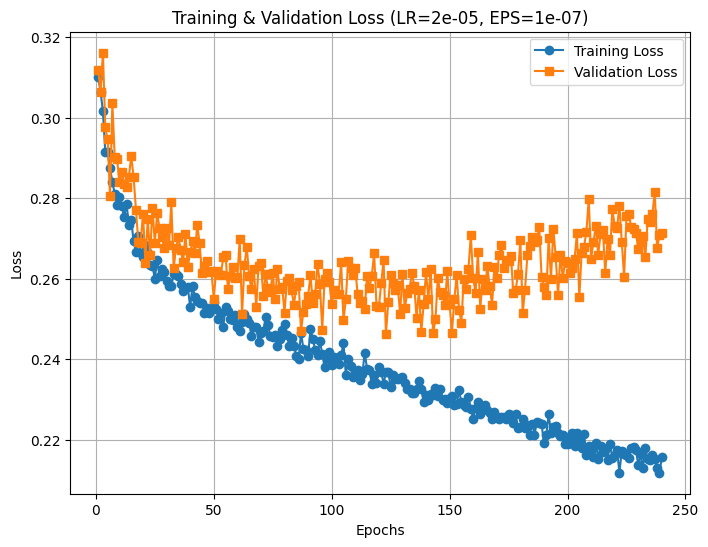

Validation Accuracy for (LR=2e-05, EPS=1e-07, Epochs=240): 0.2463

Best Overall Hyperparameters: Learning Rate = 2e-05, Epsilon = 1e-07, Epochs = 240
Best Validation Loss: 0.2463


In [ ]:
learning_rates = [2e-05]
epsilons = [1e-7]
num_epochs_list = [240]

best_overall_acc = float('inf')
best_hyperparams = None

for lr in learning_rates:
    for eps in epsilons:
        for epochs in num_epochs_list:
            print(f"\nTesting Hyperparameters: Learning Rate = {lr}, Epsilon = {eps}, Epochs = {epochs}")
            val_loss, params = train_and_validate(lr, eps, epochs)
            print(f"Validation Accuracy for (LR={lr}, EPS={eps}, Epochs={epochs}): {val_loss:.4f}")

            if val_loss < best_overall_acc:
                best_overall_acc = val_loss
                best_hyperparams = params

print(f"\nBest Overall Hyperparameters: Learning Rate = {best_hyperparams[0]}, Epsilon = {best_hyperparams[1]}, Epochs = {best_hyperparams[2]}")
print(f"Best Validation Loss: {best_overall_acc:.4f}")

In [ ]:
vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-ema").to(device)

In [ ]:
latent_noise = 0.5 * torch.randn(8, 4, latent_size, latent_size, device=device)
with torch.no_grad():
    with torch.cuda.amp.autocast():
        fake_latents_DM = cold_diffuse(u_net, latent_noise, total_steps=timesteps)
        fake_sample_DM = vae.decode(fake_latents_DM / 0.18215).sample

<ipython-input-47-5fac63301902>:3: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


  0%|          | 0/499 [00:00<?, ?it/s]

### Cold Latent Diffusion Transformer

In [ ]:
def extract_patches(image_tensor, patch_size=8):

    bs, c, h, w = image_tensor.size()

    unfold = torch.nn.Unfold(kernel_size=patch_size, stride=patch_size)

    # Apply Unfold to the image tensor
    unfolded = unfold(image_tensor)

    # Reshape the unfolded tensor to match the desired output shape
    # Output shape: BSxLxH, where L is the number of patches in each dimension
    unfolded = unfolded.transpose(1, 2).reshape(bs, -1, c * patch_size * patch_size)

    return unfolded


def reconstruct_image(patch_sequence, image_shape, patch_size=8):
    """
    Reconstructs the original image tensor from a sequence of patches.

    Args:
        patch_sequence (torch.Tensor): Sequence of patches with shape
        BS x L x (C x patch_size x patch_size)
        image_shape (tuple): Shape of the original image tensor (bs, c, h, w).
        patch_size (int): Size of the patches used in extraction.

    Returns:
        torch.Tensor: Reconstructed image tensor.
    """
    bs, c, h, w = image_shape
    num_patches_h = h // patch_size
    num_patches_w = w // patch_size

    # Reshape the patch sequence to match the unfolded tensor shape
    unfolded_shape = (bs, num_patches_h, num_patches_w, patch_size, patch_size, c)
    patch_sequence = patch_sequence.view(*unfolded_shape)

    # Transpose dimensions to match the original image tensor shape
    patch_sequence = patch_sequence.permute(0, 5, 1, 3, 2, 4).contiguous()

    # Reshape the sequence of patches back into the original image tensor shape
    reconstructed = patch_sequence.view(bs, c, h, w)

    return reconstructed

In [ ]:
class ConditionalNorm2d(nn.Module):
    def __init__(self, hidden_size, num_features):
        super(ConditionalNorm2d, self).__init__()
        self.norm = nn.LayerNorm(hidden_size, elementwise_affine=False)

        self.fcw = nn.Linear(num_features, hidden_size)
        self.fcb = nn.Linear(num_features, hidden_size)

    def forward(self, x, features):
        bs, s, l = x.shape

        out = self.norm(x)
        w = self.fcw(features).reshape(bs, 1, -1)
        b = self.fcb(features).reshape(bs, 1, -1)

        return w * out + b


class SinusoidalPosEmb(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, x):
        device = x.device
        half_dim = self.dim // 2
        emb = math.log(10000) / (half_dim - 1)
        emb = torch.exp(torch.arange(half_dim, device=device) * -emb)
        emb = x[:, None] * emb[None, :]
        emb = torch.cat((emb.sin(), emb.cos()), dim=-1)
        return emb


# Transformer block with self-attention
class TransformerBlock(nn.Module):
    def __init__(self, hidden_size=128, num_heads=4, num_features=128):
        # Initialize the parent nn.Module
        super(TransformerBlock, self).__init__()

        # Layer normalization to normalize the input data
        self.norm = nn.LayerNorm(hidden_size)

        # Multi-head attention mechanism
        self.multihead_attn = nn.MultiheadAttention(hidden_size, num_heads=num_heads,
                                                    batch_first=True, dropout=0.0)

        # Another layer normalization
        self.con_norm = ConditionalNorm2d(hidden_size, num_features)

        # Multi-layer perceptron (MLP) with a hidden layer and activation function
        self.mlp = nn.Sequential(
            nn.Linear(hidden_size, hidden_size * 4),
            nn.LayerNorm(hidden_size * 4),
            nn.ELU(),
            nn.Linear(hidden_size * 4, hidden_size)
        )

    def forward(self, x, features):
        # Apply the first layer normalization
        norm_x = self.norm(x)

        # Apply multi-head attention and add the input (residual connection)
        x = self.multihead_attn(norm_x, norm_x, norm_x)[0] + x

        # Apply the second layer normalization
        norm_x = self.con_norm(x, features)

        # Pass through the MLP and add the input (residual connection)
        x = self.mlp(norm_x) + x

        return x


# Define a Vision Encoder module for the Diffusion Transformer
class DiT(nn.Module):
    def __init__(self, image_size, channels_in, patch_size=16,
                 hidden_size=128, num_features=128,
                 num_layers=3, num_heads=4):
        super(DiT, self).__init__()

        self.time_mlp = nn.Sequential(
            SinusoidalPosEmb(num_features),
            nn.Linear(num_features, 2 * num_features),
            nn.GELU(),
            nn.Linear(2 * num_features, num_features),
            nn.GELU()
        )

        self.patch_size = patch_size
        self.fc_in = nn.Linear(channels_in * patch_size * patch_size, hidden_size)

        seq_length = (image_size // patch_size) ** 2
        self.pos_embedding = nn.Parameter(torch.empty(1, seq_length, hidden_size).normal_(std=0.02))

        # Create multiple transformer blocks as layers
        self.blocks = nn.ModuleList([
            TransformerBlock(hidden_size, num_heads) for _ in range(num_layers)
        ])

        self.fc_out = nn.Linear(hidden_size, channels_in * patch_size * patch_size)

    def forward(self, image_in, index):
        # Get timestep embedding
        index_features = self.time_mlp(index)

        # Split input into patches
        patch_seq = extract_patches(image_in, patch_size=self.patch_size)
        patch_emb = self.fc_in(patch_seq)

        # Add a unique embedding to each token embedding
        embs = patch_emb + self.pos_embedding

        # Pass the embeddings through each Transformer block
        for block in self.blocks:
            embs = block(embs, index_features)

        # Project to output
        image_out = self.fc_out(embs)

        # Reconstruct the input from patches and return result
        return reconstruct_image(image_out, image_in.shape, patch_size=self.patch_size)


In [ ]:
def cosine_alphas_bar(timesteps, s=0.008):
    steps = timesteps + 1
    x = torch.linspace(0, steps, steps)
    alphas_bar = torch.cos(((x / steps) + s) / (1 + s) * torch.pi * 0.5) ** 2
    alphas_bar = alphas_bar / alphas_bar[0]
    return alphas_bar[:timesteps]

In [ ]:
def noise_from_x0(curr_img, img_pred, alpha):
    return (curr_img - alpha.sqrt() * img_pred)/((1 - alpha).sqrt() + 1e-4)

In [ ]:
def cold_diffuse(diffusion_model, sample_in, total_steps, start_step=0):
    diffusion_model.eval()
    bs = sample_in.shape[0]
    alphas = torch.flip(cosine_alphas_bar(total_steps), (0,)).to(device)
    random_sample = copy.deepcopy(sample_in)
    with torch.no_grad():
        for i in trange(start_step, total_steps - 1):
            index = (i * torch.ones(bs, device=sample_in.device)).long()

            img_output = diffusion_model(random_sample, index)

            noise = noise_from_x0(random_sample, img_output, alphas[i])
            x0 = img_output

            rep1 = alphas[i].sqrt() * x0 + (1 - alphas[i]).sqrt() * noise
            rep2 = alphas[i + 1].sqrt() * x0 + (1 - alphas[i + 1]).sqrt() * noise

            random_sample += rep2 - rep1

        index = ((total_steps - 1) * torch.ones(bs, device=sample_in.device)).long()
        img_output = diffusion_model(random_sample, index)

    return img_output


In [ ]:
# Create a dataloader itterable object
dataiter = iter(train_loader)
latents = next(dataiter)

In [ ]:
# Create a dataloader itterable object
dataiter_val = iter(val_loader)
latents_val = next(dataiter)

In [ ]:
use_cuda = torch.cuda.is_available()
gpu_indx  = 0
device = torch.device(gpu_indx if use_cuda else "cpu")

In [ ]:
timesteps = 500
patch_size = 2

# network
dit = DiT(latent_size, channels_in=latents.shape[1], patch_size=patch_size,
            hidden_size=768, num_layers=10, num_heads=8).to(device)

# Adam optimizer
optimizer = optim.Adam(dit.parameters(), lr=lr)

# Scaler for mixed precision training
scaler = torch.cuda.amp.GradScaler()

alphas = torch.flip(cosine_alphas_bar(timesteps), (0,)).to(device)

<ipython-input-28-96266719394e>:12: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()


In [ ]:
# Let's see how many Parameters our Model has!
num_model_params = 0
for param in dit.parameters():
    num_model_params += param.flatten().shape[0]

print("-This Model Has %d (Approximately %d Million) Parameters!" % (num_model_params, num_model_params//1e6))

-This Model Has 73194128 (Approximately 73 Million) Parameters!


###Training and Validation - DiT

In [ ]:
loss_log = []
mean_loss = 0

In [ ]:
def train_and_validate(learning_rate, epsilon, train_epochs):
  best_val_loss = float('inf')
  train_losses = []
  val_losses = []

  for epoch in range(train_epochs):
        dit.train()
        mean_loss = 0
        pbar = tqdm(train_loader, leave=False, desc=f"Epoch {epoch+1}")

        for latents in pbar:
            latents = latents.to(device)
            bs = latents.shape[0]
            rand_index = torch.randint(len(alphas), (bs,), device=device)
            random_sample = torch.randn_like(latents)
            alpha_batch = alphas[rand_index].reshape(bs, 1, 1, 1)
            noise_input = alpha_batch.sqrt() * latents + (1 - alpha_batch).sqrt() * random_sample

            with torch.cuda.amp.autocast():
                latent_pred = dit(noise_input, rand_index)
                loss = F.l1_loss(latent_pred, latents)

            optimizer.zero_grad()
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

            mean_loss += loss.item()

        train_losses.append(mean_loss/len(train_loader))

        # Validation Phase
        dit.eval()
        val_loss = 0
        with torch.no_grad():
            for latents_val in val_loader:
                latents_val = latents_val.to(device)
                bs = latents_val.shape[0]
                rand_index = torch.randint(len(alphas), (bs,), device=device)
                random_sample = torch.randn_like(latents_val)
                alpha_batch = alphas[rand_index].reshape(bs, 1, 1, 1)
                noise_input = alpha_batch.sqrt() * latents_val + (1 - alpha_batch).sqrt() * random_sample
                latent_pred = dit(noise_input, rand_index)
                loss = F.l1_loss(latent_pred, latents_val)
                loss = loss.cpu()

                val_loss += loss.item()


        mean_val_loss = val_loss / len(val_loader)
        val_losses.append(mean_val_loss)

        print(f"Epoch {epoch+1}: Train Loss: {train_losses[-1]:.4f}, Validation Loss: {mean_val_loss:.4f}")

        if mean_val_loss < best_val_loss:
            best_val_loss = mean_val_loss
            best_model_params = (learning_rate, epsilon, train_epochs)


  plt.figure(figsize=(8, 6))
  plt.plot(range(1, train_epochs+1), train_losses, label="Training Loss", marker='o')
  plt.plot(range(1, train_epochs+1), val_losses, label="Validation Loss", marker='s')
  plt.xlabel("Epochs")
  plt.ylabel("Loss")
  plt.title(f"Training & Validation Loss (LR={learning_rate}, EPS={epsilon})")
  plt.legend()
  plt.grid(True)
  plt.show()

  return best_val_loss, best_model_params


Testing Hyperparameters: Learning Rate = 1e-05, Epsilon = 1e-08, Epochs = 60


Epoch 1:   0%|          | 0/150 [00:00<?, ?it/s]<ipython-input-31-ba53ff739e47>:21: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch 1: Train Loss: 0.4967, Validation Loss: 0.4239


Epoch 2: Train Loss: 0.4103, Validation Loss: 0.4039


Epoch 3: Train Loss: 0.3974, Validation Loss: 0.3950


Epoch 4: Train Loss: 0.3947, Validation Loss: 0.3774


Epoch 5: Train Loss: 0.3921, Validation Loss: 0.3954


Epoch 6: Train Loss: 0.3837, Validation Loss: 0.3749


Epoch 7: Train Loss: 0.3712, Validation Loss: 0.3730


Epoch 8: Train Loss: 0.3707, Validation Loss: 0.3537


Epoch 9: Train Loss: 0.3611, Validation Loss: 0.3557


Epoch 10: Train Loss: 0.3503, Validation Loss: 0.3398


Epoch 11: Train Loss: 0.3469, Validation Loss: 0.3468


Epoch 12: Train Loss: 0.3488, Validation Loss: 0.3310


Epoch 13: Train Loss: 0.3380, Validation Loss: 0.3356


Epoch 14: Train Loss: 0.3426, Validation Loss: 0.3350


Epoch 15: Train Loss: 0.3376, Validation Loss: 0.3344


Epoch 16: Train Loss: 0.3350, Validation Loss: 0.3353


Epoch 17: Train Loss: 0.3329, Validation Loss: 0.3320


Epoch 18: Train Loss: 0.3351, Validation Loss: 0.3341


Epoch 19: Train Loss: 0.3320, Validation Loss: 0.3310


Epoch 20: Train Loss: 0.3295, Validation Loss: 0.3269


Epoch 21: Train Loss: 0.3306, Validation Loss: 0.3230


Epoch 22: Train Loss: 0.3334, Validation Loss: 0.3259


Epoch 23: Train Loss: 0.3284, Validation Loss: 0.3245


Epoch 24: Train Loss: 0.3266, Validation Loss: 0.3283


Epoch 25: Train Loss: 0.3286, Validation Loss: 0.3323


Epoch 26: Train Loss: 0.3224, Validation Loss: 0.3273


Epoch 27: Train Loss: 0.3281, Validation Loss: 0.3187


Epoch 28: Train Loss: 0.3244, Validation Loss: 0.3292


Epoch 29: Train Loss: 0.3244, Validation Loss: 0.3269


Epoch 30: Train Loss: 0.3233, Validation Loss: 0.3192


Epoch 31: Train Loss: 0.3220, Validation Loss: 0.3302


Epoch 32: Train Loss: 0.3218, Validation Loss: 0.3142


Epoch 33: Train Loss: 0.3234, Validation Loss: 0.3160


Epoch 34: Train Loss: 0.3192, Validation Loss: 0.3205


Epoch 35: Train Loss: 0.3211, Validation Loss: 0.3177


Epoch 36: Train Loss: 0.3139, Validation Loss: 0.3198


Epoch 37: Train Loss: 0.3172, Validation Loss: 0.3181


Epoch 38: Train Loss: 0.3153, Validation Loss: 0.3071


Epoch 39: Train Loss: 0.3200, Validation Loss: 0.3223


Epoch 40: Train Loss: 0.3151, Validation Loss: 0.3200


Epoch 41: Train Loss: 0.3146, Validation Loss: 0.3067


Epoch 42: Train Loss: 0.3153, Validation Loss: 0.3139


Epoch 43: Train Loss: 0.3117, Validation Loss: 0.3233


Epoch 44: Train Loss: 0.3085, Validation Loss: 0.3188


Epoch 45: Train Loss: 0.3140, Validation Loss: 0.3214


Epoch 46: Train Loss: 0.3128, Validation Loss: 0.3105


Epoch 47: Train Loss: 0.3130, Validation Loss: 0.3186


Epoch 48: Train Loss: 0.3091, Validation Loss: 0.3026


Epoch 49: Train Loss: 0.3058, Validation Loss: 0.3145


Epoch 50: Train Loss: 0.3068, Validation Loss: 0.3014


Epoch 51: Train Loss: 0.3099, Validation Loss: 0.3057


Epoch 52: Train Loss: 0.3094, Validation Loss: 0.3049


Epoch 53: Train Loss: 0.3027, Validation Loss: 0.3101


Epoch 54: Train Loss: 0.3034, Validation Loss: 0.3065


Epoch 55: Train Loss: 0.3003, Validation Loss: 0.3047


Epoch 56: Train Loss: 0.2980, Validation Loss: 0.2999


Epoch 57: Train Loss: 0.2963, Validation Loss: 0.2864


Epoch 58: Train Loss: 0.2952, Validation Loss: 0.2897


Epoch 59: Train Loss: 0.2938, Validation Loss: 0.2916


Epoch 60: Train Loss: 0.2943, Validation Loss: 0.2937


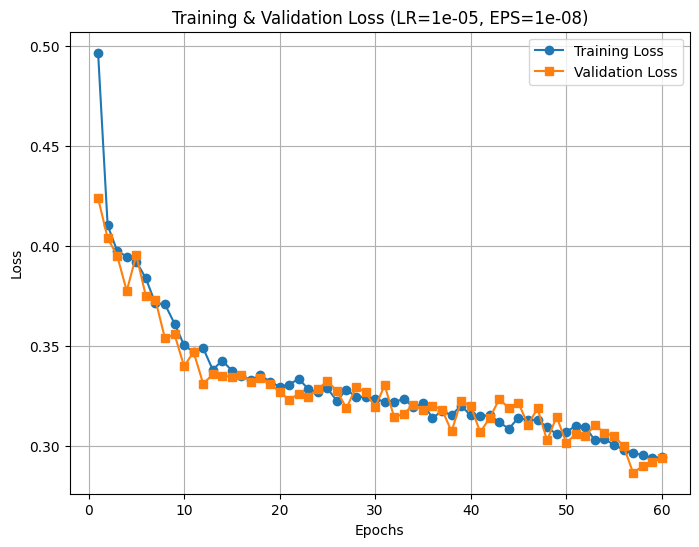

Validation Accuracy for (LR=1e-05, EPS=1e-08, Epochs=60): 0.2864

Testing Hyperparameters: Learning Rate = 1e-05, Epsilon = 1e-08, Epochs = 120


Epoch 1: Train Loss: 0.2896, Validation Loss: 0.3011


Epoch 2: Train Loss: 0.2952, Validation Loss: 0.3025


Epoch 3: Train Loss: 0.2884, Validation Loss: 0.2832


Epoch 4: Train Loss: 0.2821, Validation Loss: 0.2920


Epoch 5: Train Loss: 0.2853, Validation Loss: 0.2865


Epoch 6: Train Loss: 0.2866, Validation Loss: 0.2811


Epoch 7: Train Loss: 0.2832, Validation Loss: 0.2804


Epoch 8: Train Loss: 0.2865, Validation Loss: 0.2867


Epoch 9: Train Loss: 0.2855, Validation Loss: 0.2893


Epoch 10: Train Loss: 0.2826, Validation Loss: 0.2838


Epoch 11: Train Loss: 0.2817, Validation Loss: 0.2748


Epoch 12: Train Loss: 0.2816, Validation Loss: 0.2738


Epoch 13: Train Loss: 0.2815, Validation Loss: 0.2807


Epoch 14: Train Loss: 0.2806, Validation Loss: 0.2858


Epoch 15: Train Loss: 0.2773, Validation Loss: 0.2755


Epoch 16: Train Loss: 0.2827, Validation Loss: 0.2839


Epoch 17: Train Loss: 0.2793, Validation Loss: 0.2740


Epoch 18: Train Loss: 0.2793, Validation Loss: 0.2740


Epoch 19: Train Loss: 0.2769, Validation Loss: 0.2698


Epoch 20: Train Loss: 0.2747, Validation Loss: 0.2686


Epoch 21: Train Loss: 0.2771, Validation Loss: 0.2733


Epoch 22: Train Loss: 0.2722, Validation Loss: 0.2680


Epoch 23: Train Loss: 0.2729, Validation Loss: 0.2680


Epoch 24: Train Loss: 0.2756, Validation Loss: 0.2841


Epoch 25: Train Loss: 0.2753, Validation Loss: 0.2768


Epoch 26: Train Loss: 0.2713, Validation Loss: 0.2630


Epoch 27: Train Loss: 0.2708, Validation Loss: 0.2778


Epoch 28: Train Loss: 0.2700, Validation Loss: 0.2725


Epoch 29: Train Loss: 0.2702, Validation Loss: 0.2697


Epoch 30: Train Loss: 0.2720, Validation Loss: 0.2658


Epoch 31: Train Loss: 0.2697, Validation Loss: 0.2775


Epoch 32: Train Loss: 0.2684, Validation Loss: 0.2755


Epoch 33: Train Loss: 0.2713, Validation Loss: 0.2732


Epoch 34: Train Loss: 0.2743, Validation Loss: 0.2610


Epoch 35: Train Loss: 0.2710, Validation Loss: 0.2711


Epoch 36: Train Loss: 0.2685, Validation Loss: 0.2758


Epoch 37: Train Loss: 0.2722, Validation Loss: 0.2673


Epoch 38: Train Loss: 0.2656, Validation Loss: 0.2651


Epoch 39: Train Loss: 0.2716, Validation Loss: 0.2820


Epoch 40: Train Loss: 0.2677, Validation Loss: 0.2591


Epoch 41: Train Loss: 0.2698, Validation Loss: 0.2706


Epoch 42: Train Loss: 0.2658, Validation Loss: 0.2736


Epoch 43: Train Loss: 0.2653, Validation Loss: 0.2646


Epoch 44: Train Loss: 0.2692, Validation Loss: 0.2641


Epoch 45: Train Loss: 0.2676, Validation Loss: 0.2585


Epoch 46: Train Loss: 0.2656, Validation Loss: 0.2673


Epoch 47: Train Loss: 0.2677, Validation Loss: 0.2727


Epoch 48: Train Loss: 0.2636, Validation Loss: 0.2654


Epoch 49: Train Loss: 0.2616, Validation Loss: 0.2653


Epoch 50: Train Loss: 0.2637, Validation Loss: 0.2655


Epoch 51: Train Loss: 0.2610, Validation Loss: 0.2621


Epoch 52: Train Loss: 0.2640, Validation Loss: 0.2668


Epoch 53: Train Loss: 0.2628, Validation Loss: 0.2636


Epoch 54: Train Loss: 0.2660, Validation Loss: 0.2693


Epoch 55: Train Loss: 0.2617, Validation Loss: 0.2592


Epoch 56: Train Loss: 0.2607, Validation Loss: 0.2567


Epoch 57: Train Loss: 0.2597, Validation Loss: 0.2573


Epoch 58: Train Loss: 0.2668, Validation Loss: 0.2692


Epoch 59: Train Loss: 0.2625, Validation Loss: 0.2688


Epoch 60: Train Loss: 0.2626, Validation Loss: 0.2639


Epoch 61: Train Loss: 0.2627, Validation Loss: 0.2725


Epoch 62: Train Loss: 0.2609, Validation Loss: 0.2609


Epoch 63: Train Loss: 0.2633, Validation Loss: 0.2578


Epoch 64: Train Loss: 0.2642, Validation Loss: 0.2620


Epoch 65: Train Loss: 0.2604, Validation Loss: 0.2716


Epoch 66: Train Loss: 0.2615, Validation Loss: 0.2627


Epoch 67: Train Loss: 0.2634, Validation Loss: 0.2592


Epoch 68: Train Loss: 0.2617, Validation Loss: 0.2659


Epoch 69: Train Loss: 0.2639, Validation Loss: 0.2568


Epoch 70: Train Loss: 0.2574, Validation Loss: 0.2643


Epoch 71: Train Loss: 0.2575, Validation Loss: 0.2666


Epoch 72: Train Loss: 0.2590, Validation Loss: 0.2624


Epoch 73: Train Loss: 0.2613, Validation Loss: 0.2657


Epoch 74: Train Loss: 0.2590, Validation Loss: 0.2597


Epoch 75: Train Loss: 0.2571, Validation Loss: 0.2585


Epoch 76: Train Loss: 0.2573, Validation Loss: 0.2533


Epoch 77: Train Loss: 0.2564, Validation Loss: 0.2611


Epoch 78: Train Loss: 0.2593, Validation Loss: 0.2562


Epoch 79: Train Loss: 0.2593, Validation Loss: 0.2537


Epoch 80: Train Loss: 0.2593, Validation Loss: 0.2638


Epoch 81: Train Loss: 0.2583, Validation Loss: 0.2554


Epoch 82: Train Loss: 0.2563, Validation Loss: 0.2528


Epoch 83: Train Loss: 0.2545, Validation Loss: 0.2563


Epoch 84: Train Loss: 0.2565, Validation Loss: 0.2501


Epoch 85: Train Loss: 0.2605, Validation Loss: 0.2571


Epoch 86: Train Loss: 0.2594, Validation Loss: 0.2743


Epoch 87: Train Loss: 0.2534, Validation Loss: 0.2544


Epoch 88: Train Loss: 0.2596, Validation Loss: 0.2560


Epoch 89: Train Loss: 0.2561, Validation Loss: 0.2604


Epoch 90: Train Loss: 0.2533, Validation Loss: 0.2549


Epoch 91: Train Loss: 0.2576, Validation Loss: 0.2625


Epoch 92: Train Loss: 0.2566, Validation Loss: 0.2609


Epoch 93: Train Loss: 0.2560, Validation Loss: 0.2618


Epoch 94: Train Loss: 0.2553, Validation Loss: 0.2585


Epoch 95: Train Loss: 0.2569, Validation Loss: 0.2556


Epoch 96: Train Loss: 0.2522, Validation Loss: 0.2627


Epoch 97: Train Loss: 0.2508, Validation Loss: 0.2514


Epoch 98: Train Loss: 0.2552, Validation Loss: 0.2526


Epoch 99: Train Loss: 0.2536, Validation Loss: 0.2555


Epoch 100: Train Loss: 0.2532, Validation Loss: 0.2566


Epoch 101: Train Loss: 0.2511, Validation Loss: 0.2575


Epoch 102: Train Loss: 0.2524, Validation Loss: 0.2541


Epoch 103: Train Loss: 0.2534, Validation Loss: 0.2454


Epoch 104: Train Loss: 0.2523, Validation Loss: 0.2563


Epoch 105: Train Loss: 0.2538, Validation Loss: 0.2538


Epoch 106: Train Loss: 0.2490, Validation Loss: 0.2442


Epoch 107: Train Loss: 0.2531, Validation Loss: 0.2532


Epoch 108: Train Loss: 0.2535, Validation Loss: 0.2575


Epoch 109: Train Loss: 0.2525, Validation Loss: 0.2606


Epoch 110: Train Loss: 0.2530, Validation Loss: 0.2500


Epoch 111: Train Loss: 0.2464, Validation Loss: 0.2475


Epoch 112: Train Loss: 0.2510, Validation Loss: 0.2489


Epoch 113: Train Loss: 0.2554, Validation Loss: 0.2532


Epoch 114: Train Loss: 0.2566, Validation Loss: 0.2517


Epoch 115: Train Loss: 0.2469, Validation Loss: 0.2554


Epoch 116: Train Loss: 0.2482, Validation Loss: 0.2531


Epoch 117: Train Loss: 0.2515, Validation Loss: 0.2614


Epoch 118: Train Loss: 0.2484, Validation Loss: 0.2473


Epoch 119: Train Loss: 0.2496, Validation Loss: 0.2536


Epoch 120: Train Loss: 0.2502, Validation Loss: 0.2492


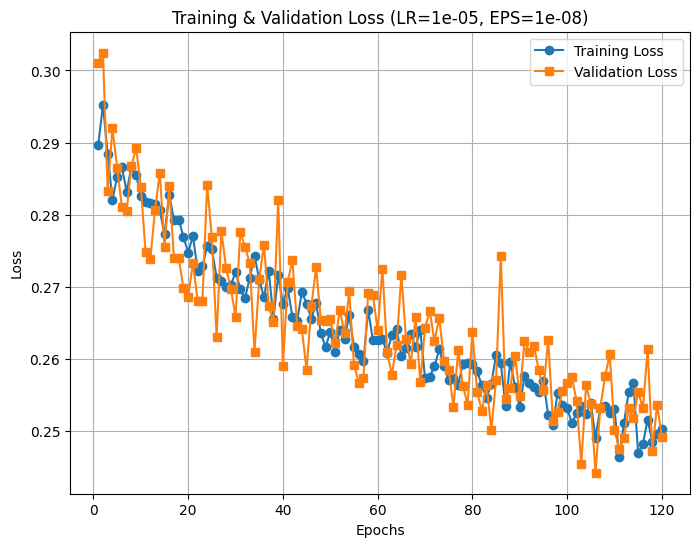

Validation Accuracy for (LR=1e-05, EPS=1e-08, Epochs=120): 0.2442

Testing Hyperparameters: Learning Rate = 1e-05, Epsilon = 1e-08, Epochs = 240


Epoch 1: Train Loss: 0.2520, Validation Loss: 0.2523


Epoch 2: Train Loss: 0.2499, Validation Loss: 0.2548


Epoch 3: Train Loss: 0.2497, Validation Loss: 0.2577


Epoch 4: Train Loss: 0.2492, Validation Loss: 0.2609


Epoch 5: Train Loss: 0.2515, Validation Loss: 0.2513


Epoch 6: Train Loss: 0.2459, Validation Loss: 0.2469


Epoch 7: Train Loss: 0.2487, Validation Loss: 0.2547


Epoch 8: Train Loss: 0.2491, Validation Loss: 0.2503


Epoch 9: Train Loss: 0.2493, Validation Loss: 0.2445


Epoch 10: Train Loss: 0.2484, Validation Loss: 0.2488


Epoch 11: Train Loss: 0.2478, Validation Loss: 0.2470


Epoch 12: Train Loss: 0.2466, Validation Loss: 0.2566


Epoch 13: Train Loss: 0.2461, Validation Loss: 0.2564


Epoch 14: Train Loss: 0.2477, Validation Loss: 0.2453


Epoch 15: Train Loss: 0.2511, Validation Loss: 0.2611


Epoch 16: Train Loss: 0.2510, Validation Loss: 0.2497


Epoch 17: Train Loss: 0.2465, Validation Loss: 0.2584


Epoch 18: Train Loss: 0.2503, Validation Loss: 0.2497


Epoch 19: Train Loss: 0.2454, Validation Loss: 0.2506


Epoch 20: Train Loss: 0.2498, Validation Loss: 0.2493


Epoch 21: Train Loss: 0.2484, Validation Loss: 0.2542


Epoch 22: Train Loss: 0.2487, Validation Loss: 0.2543


Epoch 23: Train Loss: 0.2459, Validation Loss: 0.2470


Epoch 24: Train Loss: 0.2473, Validation Loss: 0.2424


Epoch 25: Train Loss: 0.2479, Validation Loss: 0.2520


Epoch 26: Train Loss: 0.2448, Validation Loss: 0.2457


Epoch 27: Train Loss: 0.2436, Validation Loss: 0.2480


Epoch 28: Train Loss: 0.2476, Validation Loss: 0.2519


Epoch 29: Train Loss: 0.2479, Validation Loss: 0.2347


Epoch 30: Train Loss: 0.2441, Validation Loss: 0.2501


Epoch 31: Train Loss: 0.2482, Validation Loss: 0.2588


Epoch 32: Train Loss: 0.2467, Validation Loss: 0.2443


Epoch 33: Train Loss: 0.2442, Validation Loss: 0.2403


Epoch 34: Train Loss: 0.2487, Validation Loss: 0.2585


Epoch 35: Train Loss: 0.2462, Validation Loss: 0.2518


Epoch 36: Train Loss: 0.2478, Validation Loss: 0.2426


Epoch 37: Train Loss: 0.2452, Validation Loss: 0.2379


Epoch 38: Train Loss: 0.2448, Validation Loss: 0.2481


Epoch 39: Train Loss: 0.2445, Validation Loss: 0.2472


Epoch 40: Train Loss: 0.2468, Validation Loss: 0.2511


Epoch 41: Train Loss: 0.2458, Validation Loss: 0.2535


Epoch 42: Train Loss: 0.2460, Validation Loss: 0.2447


Epoch 43: Train Loss: 0.2484, Validation Loss: 0.2460


Epoch 44: Train Loss: 0.2457, Validation Loss: 0.2398


Epoch 45: Train Loss: 0.2440, Validation Loss: 0.2454


Epoch 46: Train Loss: 0.2417, Validation Loss: 0.2499


Epoch 47: Train Loss: 0.2476, Validation Loss: 0.2488


Epoch 48: Train Loss: 0.2460, Validation Loss: 0.2490


Epoch 49: Train Loss: 0.2446, Validation Loss: 0.2564


Epoch 50: Train Loss: 0.2431, Validation Loss: 0.2515


Epoch 51: Train Loss: 0.2442, Validation Loss: 0.2494


Epoch 52: Train Loss: 0.2445, Validation Loss: 0.2406


Epoch 53: Train Loss: 0.2439, Validation Loss: 0.2457


Epoch 54: Train Loss: 0.2425, Validation Loss: 0.2494


Epoch 55: Train Loss: 0.2413, Validation Loss: 0.2501


Epoch 56: Train Loss: 0.2422, Validation Loss: 0.2493


Epoch 57: Train Loss: 0.2451, Validation Loss: 0.2350


Epoch 58: Train Loss: 0.2447, Validation Loss: 0.2448


Epoch 59: Train Loss: 0.2468, Validation Loss: 0.2405


Epoch 60: Train Loss: 0.2458, Validation Loss: 0.2526


Epoch 61: Train Loss: 0.2435, Validation Loss: 0.2477


Epoch 62: Train Loss: 0.2425, Validation Loss: 0.2397


Epoch 63: Train Loss: 0.2419, Validation Loss: 0.2560


Epoch 64: Train Loss: 0.2477, Validation Loss: 0.2422


Epoch 65: Train Loss: 0.2438, Validation Loss: 0.2480


Epoch 66: Train Loss: 0.2392, Validation Loss: 0.2534


Epoch 67: Train Loss: 0.2434, Validation Loss: 0.2368


Epoch 68: Train Loss: 0.2446, Validation Loss: 0.2413


Epoch 69: Train Loss: 0.2431, Validation Loss: 0.2437


Epoch 70: Train Loss: 0.2444, Validation Loss: 0.2362


Epoch 71: Train Loss: 0.2433, Validation Loss: 0.2461


Epoch 72: Train Loss: 0.2400, Validation Loss: 0.2452


Epoch 73: Train Loss: 0.2451, Validation Loss: 0.2409


Epoch 74: Train Loss: 0.2403, Validation Loss: 0.2427


Epoch 75: Train Loss: 0.2414, Validation Loss: 0.2476


Epoch 76: Train Loss: 0.2427, Validation Loss: 0.2497


Epoch 77: Train Loss: 0.2407, Validation Loss: 0.2448


Epoch 78: Train Loss: 0.2441, Validation Loss: 0.2374


Epoch 79: Train Loss: 0.2388, Validation Loss: 0.2446


Epoch 80: Train Loss: 0.2408, Validation Loss: 0.2452


Epoch 81: Train Loss: 0.2437, Validation Loss: 0.2409


Epoch 82: Train Loss: 0.2415, Validation Loss: 0.2415


Epoch 83: Train Loss: 0.2426, Validation Loss: 0.2442


Epoch 84: Train Loss: 0.2417, Validation Loss: 0.2583


Epoch 85: Train Loss: 0.2450, Validation Loss: 0.2441


Epoch 86: Train Loss: 0.2440, Validation Loss: 0.2486


Epoch 87: Train Loss: 0.2417, Validation Loss: 0.2387


Epoch 88: Train Loss: 0.2424, Validation Loss: 0.2370


Epoch 89: Train Loss: 0.2465, Validation Loss: 0.2425


Epoch 90: Train Loss: 0.2433, Validation Loss: 0.2433


Epoch 91: Train Loss: 0.2398, Validation Loss: 0.2412


Epoch 92: Train Loss: 0.2375, Validation Loss: 0.2396


Epoch 93: Train Loss: 0.2390, Validation Loss: 0.2521


Epoch 94: Train Loss: 0.2438, Validation Loss: 0.2460


Epoch 95: Train Loss: 0.2405, Validation Loss: 0.2514


Epoch 96: Train Loss: 0.2414, Validation Loss: 0.2412


Epoch 97: Train Loss: 0.2416, Validation Loss: 0.2380


Epoch 98: Train Loss: 0.2441, Validation Loss: 0.2443


Epoch 99: Train Loss: 0.2420, Validation Loss: 0.2417


Epoch 100: Train Loss: 0.2400, Validation Loss: 0.2402


Epoch 101: Train Loss: 0.2424, Validation Loss: 0.2406


Epoch 102: Train Loss: 0.2411, Validation Loss: 0.2340


Epoch 103: Train Loss: 0.2379, Validation Loss: 0.2387


Epoch 104: Train Loss: 0.2399, Validation Loss: 0.2518


Epoch 105: Train Loss: 0.2419, Validation Loss: 0.2372


Epoch 106: Train Loss: 0.2394, Validation Loss: 0.2387


Epoch 107: Train Loss: 0.2371, Validation Loss: 0.2451


Epoch 108: Train Loss: 0.2386, Validation Loss: 0.2507


Epoch 109: Train Loss: 0.2380, Validation Loss: 0.2457


Epoch 110: Train Loss: 0.2379, Validation Loss: 0.2292


Epoch 111: Train Loss: 0.2392, Validation Loss: 0.2487


Epoch 112: Train Loss: 0.2426, Validation Loss: 0.2331


Epoch 113: Train Loss: 0.2395, Validation Loss: 0.2406


Epoch 114: Train Loss: 0.2398, Validation Loss: 0.2431


Epoch 115: Train Loss: 0.2419, Validation Loss: 0.2462


Epoch 116: Train Loss: 0.2393, Validation Loss: 0.2458


Epoch 117: Train Loss: 0.2407, Validation Loss: 0.2261


Epoch 118: Train Loss: 0.2410, Validation Loss: 0.2469


Epoch 119: Train Loss: 0.2386, Validation Loss: 0.2434


Epoch 120: Train Loss: 0.2394, Validation Loss: 0.2454


Epoch 121: Train Loss: 0.2377, Validation Loss: 0.2451


Epoch 122: Train Loss: 0.2385, Validation Loss: 0.2352


Epoch 123: Train Loss: 0.2415, Validation Loss: 0.2410


Epoch 124: Train Loss: 0.2386, Validation Loss: 0.2397


Epoch 125: Train Loss: 0.2358, Validation Loss: 0.2480


Epoch 126: Train Loss: 0.2391, Validation Loss: 0.2416


Epoch 127: Train Loss: 0.2397, Validation Loss: 0.2318


Epoch 128: Train Loss: 0.2391, Validation Loss: 0.2398


Epoch 129: Train Loss: 0.2395, Validation Loss: 0.2378


Epoch 130: Train Loss: 0.2413, Validation Loss: 0.2463


Epoch 131: Train Loss: 0.2374, Validation Loss: 0.2334


Epoch 132: Train Loss: 0.2387, Validation Loss: 0.2360


Epoch 133: Train Loss: 0.2389, Validation Loss: 0.2279


Epoch 134: Train Loss: 0.2384, Validation Loss: 0.2368


Epoch 135: Train Loss: 0.2360, Validation Loss: 0.2471


Epoch 136: Train Loss: 0.2404, Validation Loss: 0.2388


Epoch 137: Train Loss: 0.2414, Validation Loss: 0.2302


Epoch 138: Train Loss: 0.2387, Validation Loss: 0.2441


Epoch 139: Train Loss: 0.2360, Validation Loss: 0.2406


Epoch 140: Train Loss: 0.2381, Validation Loss: 0.2412


Epoch 141: Train Loss: 0.2409, Validation Loss: 0.2369


Epoch 142: Train Loss: 0.2381, Validation Loss: 0.2395


Epoch 143: Train Loss: 0.2377, Validation Loss: 0.2460


Epoch 144: Train Loss: 0.2352, Validation Loss: 0.2444


Epoch 145: Train Loss: 0.2377, Validation Loss: 0.2391


Epoch 146: Train Loss: 0.2380, Validation Loss: 0.2355


Epoch 147: Train Loss: 0.2367, Validation Loss: 0.2487


Epoch 148: Train Loss: 0.2371, Validation Loss: 0.2435


Epoch 149: Train Loss: 0.2366, Validation Loss: 0.2339


Epoch 150: Train Loss: 0.2352, Validation Loss: 0.2360


Epoch 151: Train Loss: 0.2343, Validation Loss: 0.2392


Epoch 152: Train Loss: 0.2339, Validation Loss: 0.2457


Epoch 153: Train Loss: 0.2404, Validation Loss: 0.2520


Epoch 154: Train Loss: 0.2342, Validation Loss: 0.2411


Epoch 155: Train Loss: 0.2364, Validation Loss: 0.2453


Epoch 156: Train Loss: 0.2383, Validation Loss: 0.2403


Epoch 157: Train Loss: 0.2395, Validation Loss: 0.2441


Epoch 158: Train Loss: 0.2385, Validation Loss: 0.2327


Epoch 159: Train Loss: 0.2388, Validation Loss: 0.2430


Epoch 160: Train Loss: 0.2385, Validation Loss: 0.2300


Epoch 161: Train Loss: 0.2367, Validation Loss: 0.2346


Epoch 162: Train Loss: 0.2381, Validation Loss: 0.2252


Epoch 163: Train Loss: 0.2348, Validation Loss: 0.2376


Epoch 164: Train Loss: 0.2388, Validation Loss: 0.2349


Epoch 165: Train Loss: 0.2378, Validation Loss: 0.2400


Epoch 166: Train Loss: 0.2380, Validation Loss: 0.2399


Epoch 167: Train Loss: 0.2351, Validation Loss: 0.2418


Epoch 168: Train Loss: 0.2379, Validation Loss: 0.2413


Epoch 169: Train Loss: 0.2363, Validation Loss: 0.2375


Epoch 170: Train Loss: 0.2384, Validation Loss: 0.2424


Epoch 171: Train Loss: 0.2386, Validation Loss: 0.2509


Epoch 172: Train Loss: 0.2388, Validation Loss: 0.2323


Epoch 173: Train Loss: 0.2327, Validation Loss: 0.2342


Epoch 174: Train Loss: 0.2367, Validation Loss: 0.2401


Epoch 175: Train Loss: 0.2387, Validation Loss: 0.2391


Epoch 176: Train Loss: 0.2326, Validation Loss: 0.2352


Epoch 177: Train Loss: 0.2361, Validation Loss: 0.2304


Epoch 178: Train Loss: 0.2363, Validation Loss: 0.2416


Epoch 179: Train Loss: 0.2401, Validation Loss: 0.2365


Epoch 180: Train Loss: 0.2401, Validation Loss: 0.2345


Epoch 181: Train Loss: 0.2349, Validation Loss: 0.2331


Epoch 182: Train Loss: 0.2370, Validation Loss: 0.2301


Epoch 183: Train Loss: 0.2381, Validation Loss: 0.2358


Epoch 184: Train Loss: 0.2335, Validation Loss: 0.2427


Epoch 185: Train Loss: 0.2362, Validation Loss: 0.2320


Epoch 186: Train Loss: 0.2388, Validation Loss: 0.2385


Epoch 187: Train Loss: 0.2352, Validation Loss: 0.2355


Epoch 188: Train Loss: 0.2388, Validation Loss: 0.2420


Epoch 189: Train Loss: 0.2344, Validation Loss: 0.2287


Epoch 190: Train Loss: 0.2394, Validation Loss: 0.2401


Epoch 191: Train Loss: 0.2367, Validation Loss: 0.2430


Epoch 192: Train Loss: 0.2341, Validation Loss: 0.2397


Epoch 193: Train Loss: 0.2354, Validation Loss: 0.2334


Epoch 194: Train Loss: 0.2352, Validation Loss: 0.2346


Epoch 195: Train Loss: 0.2369, Validation Loss: 0.2406


Epoch 196: Train Loss: 0.2355, Validation Loss: 0.2363


Epoch 197: Train Loss: 0.2346, Validation Loss: 0.2377


Epoch 198: Train Loss: 0.2350, Validation Loss: 0.2437


Epoch 199: Train Loss: 0.2376, Validation Loss: 0.2401


Epoch 200: Train Loss: 0.2333, Validation Loss: 0.2217


Epoch 201: Train Loss: 0.2341, Validation Loss: 0.2336


Epoch 202: Train Loss: 0.2358, Validation Loss: 0.2409


Epoch 203: Train Loss: 0.2346, Validation Loss: 0.2205


Epoch 204: Train Loss: 0.2339, Validation Loss: 0.2290


Epoch 205: Train Loss: 0.2371, Validation Loss: 0.2410


Epoch 206: Train Loss: 0.2340, Validation Loss: 0.2282


Epoch 207: Train Loss: 0.2349, Validation Loss: 0.2314


Epoch 208: Train Loss: 0.2374, Validation Loss: 0.2370


Epoch 209: Train Loss: 0.2373, Validation Loss: 0.2398


Epoch 210: Train Loss: 0.2360, Validation Loss: 0.2455


Epoch 211: Train Loss: 0.2354, Validation Loss: 0.2296


Epoch 212: Train Loss: 0.2353, Validation Loss: 0.2374


Epoch 213: Train Loss: 0.2341, Validation Loss: 0.2337


Epoch 214: Train Loss: 0.2358, Validation Loss: 0.2320


Epoch 215: Train Loss: 0.2371, Validation Loss: 0.2348


Epoch 216: Train Loss: 0.2360, Validation Loss: 0.2292


Epoch 217: Train Loss: 0.2331, Validation Loss: 0.2368


Epoch 218: Train Loss: 0.2331, Validation Loss: 0.2536


Epoch 219: Train Loss: 0.2329, Validation Loss: 0.2278


Epoch 220: Train Loss: 0.2332, Validation Loss: 0.2341


Epoch 221: Train Loss: 0.2369, Validation Loss: 0.2387


Epoch 222: Train Loss: 0.2350, Validation Loss: 0.2374


Epoch 223: Train Loss: 0.2344, Validation Loss: 0.2389


Epoch 224: Train Loss: 0.2344, Validation Loss: 0.2378


Epoch 225: Train Loss: 0.2350, Validation Loss: 0.2353


Epoch 226: Train Loss: 0.2379, Validation Loss: 0.2375


Epoch 227: Train Loss: 0.2359, Validation Loss: 0.2233


Epoch 228: Train Loss: 0.2367, Validation Loss: 0.2357


Epoch 229: Train Loss: 0.2327, Validation Loss: 0.2350


Epoch 230: Train Loss: 0.2337, Validation Loss: 0.2338


Epoch 231: Train Loss: 0.2333, Validation Loss: 0.2434


Epoch 232: Train Loss: 0.2351, Validation Loss: 0.2368


Epoch 233: Train Loss: 0.2323, Validation Loss: 0.2261


Epoch 234: Train Loss: 0.2339, Validation Loss: 0.2290


Epoch 235: Train Loss: 0.2357, Validation Loss: 0.2315


Epoch 236: Train Loss: 0.2326, Validation Loss: 0.2444


Epoch 237: Train Loss: 0.2355, Validation Loss: 0.2340


Epoch 238: Train Loss: 0.2350, Validation Loss: 0.2298


Epoch 239: Train Loss: 0.2325, Validation Loss: 0.2361


Epoch 240: Train Loss: 0.2317, Validation Loss: 0.2362


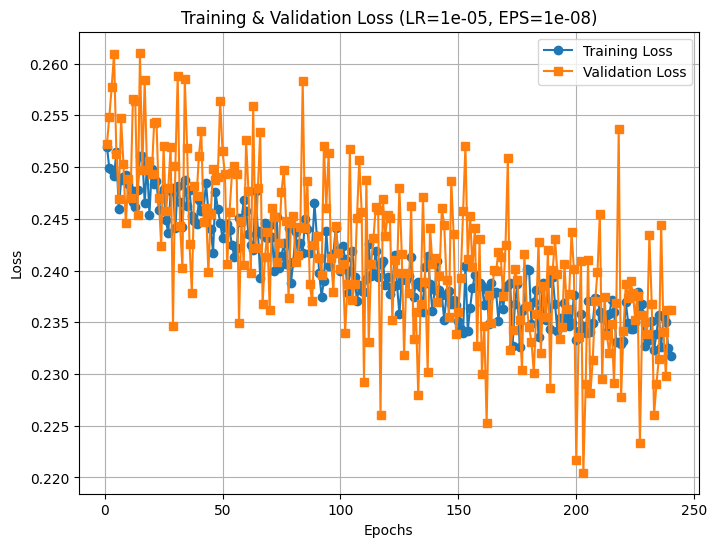

Validation Accuracy for (LR=1e-05, EPS=1e-08, Epochs=240): 0.2205

Testing Hyperparameters: Learning Rate = 1e-05, Epsilon = 1e-07, Epochs = 60


Epoch 1: Train Loss: 0.2354, Validation Loss: 0.2277


Epoch 2: Train Loss: 0.2340, Validation Loss: 0.2302


Epoch 3: Train Loss: 0.2364, Validation Loss: 0.2296


Epoch 4: Train Loss: 0.2346, Validation Loss: 0.2470


Epoch 5: Train Loss: 0.2335, Validation Loss: 0.2335


Epoch 6: Train Loss: 0.2301, Validation Loss: 0.2322


Epoch 7: Train Loss: 0.2319, Validation Loss: 0.2250


Epoch 8: Train Loss: 0.2375, Validation Loss: 0.2351


Epoch 9: Train Loss: 0.2353, Validation Loss: 0.2272


Epoch 10: Train Loss: 0.2326, Validation Loss: 0.2286


Epoch 11: Train Loss: 0.2306, Validation Loss: 0.2325


Epoch 12: Train Loss: 0.2299, Validation Loss: 0.2369


Epoch 13: Train Loss: 0.2323, Validation Loss: 0.2317


Epoch 14: Train Loss: 0.2324, Validation Loss: 0.2383


Epoch 15: Train Loss: 0.2311, Validation Loss: 0.2226


Epoch 16: Train Loss: 0.2353, Validation Loss: 0.2380


Epoch 17: Train Loss: 0.2338, Validation Loss: 0.2422


Epoch 18: Train Loss: 0.2343, Validation Loss: 0.2252


Epoch 19: Train Loss: 0.2332, Validation Loss: 0.2422


Epoch 20: Train Loss: 0.2335, Validation Loss: 0.2362


Epoch 21: Train Loss: 0.2315, Validation Loss: 0.2292


Epoch 22: Train Loss: 0.2369, Validation Loss: 0.2390


Epoch 23: Train Loss: 0.2304, Validation Loss: 0.2447


Epoch 24: Train Loss: 0.2317, Validation Loss: 0.2357


Epoch 25: Train Loss: 0.2320, Validation Loss: 0.2429


Epoch 26: Train Loss: 0.2318, Validation Loss: 0.2293


Epoch 27: Train Loss: 0.2308, Validation Loss: 0.2353


Epoch 28: Train Loss: 0.2340, Validation Loss: 0.2348


Epoch 29: Train Loss: 0.2339, Validation Loss: 0.2269


Epoch 30: Train Loss: 0.2316, Validation Loss: 0.2407


Epoch 31: Train Loss: 0.2332, Validation Loss: 0.2311


Epoch 32: Train Loss: 0.2326, Validation Loss: 0.2341


Epoch 33: Train Loss: 0.2357, Validation Loss: 0.2395


Epoch 34: Train Loss: 0.2309, Validation Loss: 0.2321


Epoch 35: Train Loss: 0.2340, Validation Loss: 0.2308


Epoch 36: Train Loss: 0.2320, Validation Loss: 0.2278


Epoch 37: Train Loss: 0.2281, Validation Loss: 0.2262


Epoch 38: Train Loss: 0.2327, Validation Loss: 0.2410


Epoch 39: Train Loss: 0.2328, Validation Loss: 0.2293


Epoch 40: Train Loss: 0.2330, Validation Loss: 0.2396


Epoch 41: Train Loss: 0.2318, Validation Loss: 0.2365


Epoch 42: Train Loss: 0.2321, Validation Loss: 0.2303


Epoch 43: Train Loss: 0.2330, Validation Loss: 0.2434


Epoch 44: Train Loss: 0.2323, Validation Loss: 0.2332


Epoch 45: Train Loss: 0.2338, Validation Loss: 0.2299


Epoch 46: Train Loss: 0.2309, Validation Loss: 0.2323


Epoch 47: Train Loss: 0.2356, Validation Loss: 0.2311


Epoch 48: Train Loss: 0.2297, Validation Loss: 0.2301


Epoch 49: Train Loss: 0.2311, Validation Loss: 0.2324


Epoch 50: Train Loss: 0.2354, Validation Loss: 0.2251


Epoch 51: Train Loss: 0.2341, Validation Loss: 0.2373


Epoch 52: Train Loss: 0.2311, Validation Loss: 0.2248


Epoch 53: Train Loss: 0.2328, Validation Loss: 0.2213


Epoch 54: Train Loss: 0.2330, Validation Loss: 0.2407


Epoch 55: Train Loss: 0.2290, Validation Loss: 0.2291


Epoch 56: Train Loss: 0.2315, Validation Loss: 0.2358


Epoch 57: Train Loss: 0.2320, Validation Loss: 0.2370


Epoch 58: Train Loss: 0.2301, Validation Loss: 0.2346


Epoch 59: Train Loss: 0.2308, Validation Loss: 0.2213


Epoch 60: Train Loss: 0.2300, Validation Loss: 0.2239


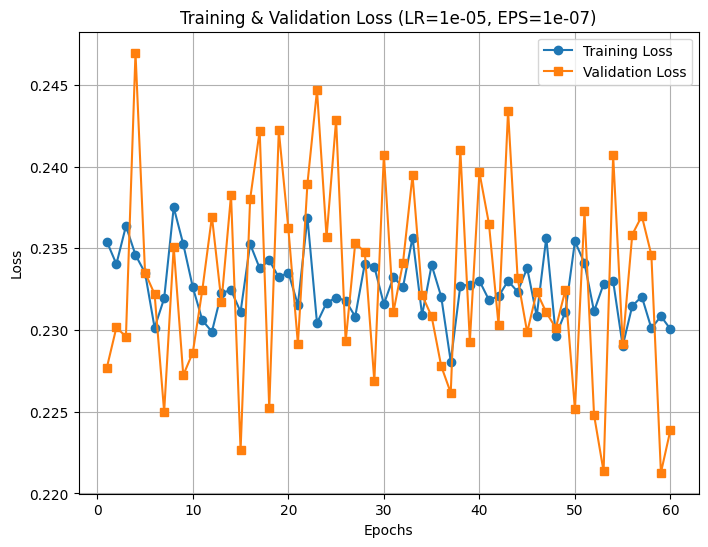

Validation Accuracy for (LR=1e-05, EPS=1e-07, Epochs=60): 0.2213

Testing Hyperparameters: Learning Rate = 1e-05, Epsilon = 1e-07, Epochs = 120


Epoch 1: Train Loss: 0.2287, Validation Loss: 0.2303


Epoch 2: Train Loss: 0.2285, Validation Loss: 0.2321


Epoch 3: Train Loss: 0.2342, Validation Loss: 0.2387


Epoch 4: Train Loss: 0.2328, Validation Loss: 0.2266


Epoch 5: Train Loss: 0.2331, Validation Loss: 0.2405


Epoch 6: Train Loss: 0.2335, Validation Loss: 0.2376


Epoch 7: Train Loss: 0.2305, Validation Loss: 0.2250


Epoch 8: Train Loss: 0.2306, Validation Loss: 0.2240


Epoch 9: Train Loss: 0.2301, Validation Loss: 0.2365


Epoch 10: Train Loss: 0.2343, Validation Loss: 0.2303


Epoch 11: Train Loss: 0.2338, Validation Loss: 0.2370


Epoch 12: Train Loss: 0.2332, Validation Loss: 0.2258


Epoch 13: Train Loss: 0.2339, Validation Loss: 0.2354


Epoch 14: Train Loss: 0.2326, Validation Loss: 0.2350


Epoch 15: Train Loss: 0.2336, Validation Loss: 0.2395


Epoch 16: Train Loss: 0.2349, Validation Loss: 0.2260


Epoch 17: Train Loss: 0.2321, Validation Loss: 0.2298


Epoch 18: Train Loss: 0.2342, Validation Loss: 0.2392


Epoch 19: Train Loss: 0.2299, Validation Loss: 0.2351


Epoch 20: Train Loss: 0.2339, Validation Loss: 0.2391


Epoch 21: Train Loss: 0.2284, Validation Loss: 0.2282


Epoch 22: Train Loss: 0.2291, Validation Loss: 0.2395


Epoch 23: Train Loss: 0.2333, Validation Loss: 0.2340


Epoch 24: Train Loss: 0.2329, Validation Loss: 0.2275


Epoch 25: Train Loss: 0.2302, Validation Loss: 0.2294


Epoch 26: Train Loss: 0.2318, Validation Loss: 0.2358


Epoch 27: Train Loss: 0.2321, Validation Loss: 0.2443


Epoch 28: Train Loss: 0.2294, Validation Loss: 0.2305


Epoch 29: Train Loss: 0.2320, Validation Loss: 0.2289


Epoch 30: Train Loss: 0.2295, Validation Loss: 0.2342


Epoch 31: Train Loss: 0.2314, Validation Loss: 0.2354


Epoch 32: Train Loss: 0.2307, Validation Loss: 0.2317


Epoch 33: Train Loss: 0.2273, Validation Loss: 0.2338


Epoch 34: Train Loss: 0.2306, Validation Loss: 0.2335


Epoch 35: Train Loss: 0.2303, Validation Loss: 0.2297


Epoch 36: Train Loss: 0.2321, Validation Loss: 0.2306


Epoch 37: Train Loss: 0.2316, Validation Loss: 0.2359


Epoch 38: Train Loss: 0.2310, Validation Loss: 0.2418


Epoch 39: Train Loss: 0.2339, Validation Loss: 0.2380


Epoch 40: Train Loss: 0.2325, Validation Loss: 0.2347


Epoch 41: Train Loss: 0.2314, Validation Loss: 0.2378


Epoch 42: Train Loss: 0.2327, Validation Loss: 0.2367


Epoch 43: Train Loss: 0.2303, Validation Loss: 0.2346


Epoch 44: Train Loss: 0.2283, Validation Loss: 0.2410


Epoch 45: Train Loss: 0.2292, Validation Loss: 0.2284


Epoch 46: Train Loss: 0.2282, Validation Loss: 0.2189


Epoch 47: Train Loss: 0.2326, Validation Loss: 0.2393


Epoch 48: Train Loss: 0.2297, Validation Loss: 0.2374


Epoch 49: Train Loss: 0.2273, Validation Loss: 0.2371


Epoch 50: Train Loss: 0.2303, Validation Loss: 0.2315


Epoch 51: Train Loss: 0.2323, Validation Loss: 0.2305


Epoch 52: Train Loss: 0.2284, Validation Loss: 0.2361


Epoch 53: Train Loss: 0.2298, Validation Loss: 0.2317


Epoch 54: Train Loss: 0.2287, Validation Loss: 0.2287


Epoch 55: Train Loss: 0.2305, Validation Loss: 0.2326


Epoch 56: Train Loss: 0.2344, Validation Loss: 0.2399


Epoch 57: Train Loss: 0.2303, Validation Loss: 0.2330


Epoch 58: Train Loss: 0.2332, Validation Loss: 0.2271


Epoch 59: Train Loss: 0.2319, Validation Loss: 0.2397


Epoch 60: Train Loss: 0.2317, Validation Loss: 0.2364


Epoch 61: Train Loss: 0.2289, Validation Loss: 0.2292


Epoch 62: Train Loss: 0.2308, Validation Loss: 0.2386


Epoch 63: Train Loss: 0.2323, Validation Loss: 0.2304


Epoch 64: Train Loss: 0.2285, Validation Loss: 0.2348


Epoch 65: Train Loss: 0.2288, Validation Loss: 0.2393


Epoch 66: Train Loss: 0.2304, Validation Loss: 0.2366


Epoch 67: Train Loss: 0.2286, Validation Loss: 0.2284


Epoch 68: Train Loss: 0.2305, Validation Loss: 0.2294


Epoch 69: Train Loss: 0.2286, Validation Loss: 0.2339


Epoch 70: Train Loss: 0.2309, Validation Loss: 0.2330


Epoch 71: Train Loss: 0.2281, Validation Loss: 0.2244


Epoch 72: Train Loss: 0.2326, Validation Loss: 0.2405


Epoch 73: Train Loss: 0.2295, Validation Loss: 0.2259


Epoch 74: Train Loss: 0.2278, Validation Loss: 0.2291


Epoch 75: Train Loss: 0.2272, Validation Loss: 0.2313


Epoch 76: Train Loss: 0.2297, Validation Loss: 0.2405


Epoch 77: Train Loss: 0.2283, Validation Loss: 0.2397


Epoch 78: Train Loss: 0.2278, Validation Loss: 0.2355


Epoch 79: Train Loss: 0.2287, Validation Loss: 0.2308


Epoch 80: Train Loss: 0.2287, Validation Loss: 0.2302


Epoch 81: Train Loss: 0.2270, Validation Loss: 0.2340


Epoch 82: Train Loss: 0.2289, Validation Loss: 0.2312


Epoch 83: Train Loss: 0.2292, Validation Loss: 0.2324


Epoch 84: Train Loss: 0.2303, Validation Loss: 0.2278


Epoch 85: Train Loss: 0.2280, Validation Loss: 0.2358


Epoch 86: Train Loss: 0.2275, Validation Loss: 0.2293


Epoch 87: Train Loss: 0.2286, Validation Loss: 0.2338


Epoch 88: Train Loss: 0.2329, Validation Loss: 0.2278


Epoch 89: Train Loss: 0.2274, Validation Loss: 0.2240


Epoch 90: Train Loss: 0.2274, Validation Loss: 0.2334


Epoch 91: Train Loss: 0.2304, Validation Loss: 0.2326


Epoch 92: Train Loss: 0.2304, Validation Loss: 0.2270


Epoch 93: Train Loss: 0.2258, Validation Loss: 0.2215


Epoch 94: Train Loss: 0.2284, Validation Loss: 0.2322


Epoch 95: Train Loss: 0.2252, Validation Loss: 0.2348


Epoch 96: Train Loss: 0.2317, Validation Loss: 0.2354


Epoch 97: Train Loss: 0.2276, Validation Loss: 0.2298


Epoch 98: Train Loss: 0.2264, Validation Loss: 0.2250


Epoch 99: Train Loss: 0.2274, Validation Loss: 0.2228


Epoch 100: Train Loss: 0.2312, Validation Loss: 0.2277


Epoch 101: Train Loss: 0.2275, Validation Loss: 0.2415


Epoch 102: Train Loss: 0.2289, Validation Loss: 0.2247


Epoch 103: Train Loss: 0.2290, Validation Loss: 0.2384


Epoch 104: Train Loss: 0.2296, Validation Loss: 0.2223


Epoch 105: Train Loss: 0.2261, Validation Loss: 0.2340


Epoch 106: Train Loss: 0.2296, Validation Loss: 0.2385


Epoch 107: Train Loss: 0.2288, Validation Loss: 0.2375


Epoch 108: Train Loss: 0.2297, Validation Loss: 0.2329


Epoch 109: Train Loss: 0.2319, Validation Loss: 0.2327


Epoch 110: Train Loss: 0.2310, Validation Loss: 0.2353


Epoch 111: Train Loss: 0.2320, Validation Loss: 0.2298


Epoch 112: Train Loss: 0.2249, Validation Loss: 0.2295


Epoch 113: Train Loss: 0.2270, Validation Loss: 0.2332


Epoch 114: Train Loss: 0.2316, Validation Loss: 0.2302


Epoch 115: Train Loss: 0.2326, Validation Loss: 0.2310


Epoch 116: Train Loss: 0.2281, Validation Loss: 0.2344


Epoch 117: Train Loss: 0.2276, Validation Loss: 0.2316


Epoch 118: Train Loss: 0.2292, Validation Loss: 0.2398


Epoch 119: Train Loss: 0.2319, Validation Loss: 0.2278


Epoch 120: Train Loss: 0.2301, Validation Loss: 0.2313


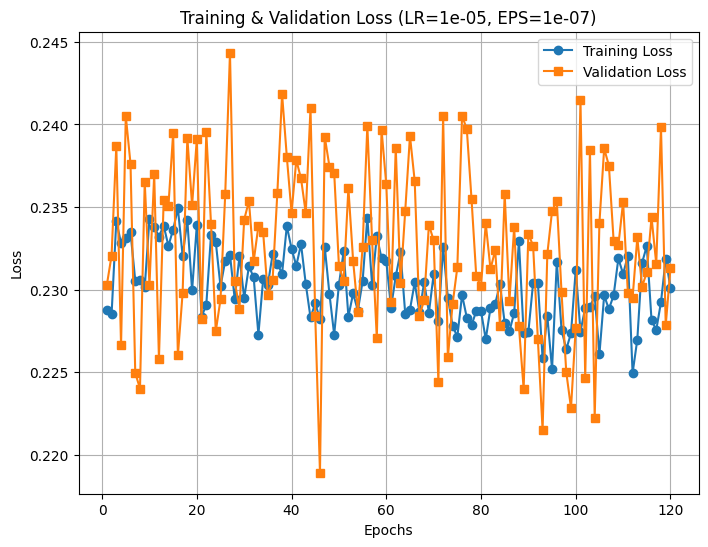

Validation Accuracy for (LR=1e-05, EPS=1e-07, Epochs=120): 0.2189

Testing Hyperparameters: Learning Rate = 1e-05, Epsilon = 1e-07, Epochs = 240


Epoch 1: Train Loss: 0.2296, Validation Loss: 0.2350


Epoch 2: Train Loss: 0.2290, Validation Loss: 0.2282


Epoch 3: Train Loss: 0.2289, Validation Loss: 0.2437


Epoch 4: Train Loss: 0.2304, Validation Loss: 0.2330


Epoch 5: Train Loss: 0.2276, Validation Loss: 0.2321


Epoch 6: Train Loss: 0.2308, Validation Loss: 0.2384


Epoch 7: Train Loss: 0.2288, Validation Loss: 0.2387


Epoch 8: Train Loss: 0.2310, Validation Loss: 0.2292


Epoch 9: Train Loss: 0.2260, Validation Loss: 0.2279


Epoch 10: Train Loss: 0.2282, Validation Loss: 0.2261


Epoch 11: Train Loss: 0.2258, Validation Loss: 0.2293


Epoch 12: Train Loss: 0.2285, Validation Loss: 0.2214


Epoch 13: Train Loss: 0.2271, Validation Loss: 0.2320


Epoch 14: Train Loss: 0.2266, Validation Loss: 0.2344


Epoch 15: Train Loss: 0.2259, Validation Loss: 0.2220


Epoch 16: Train Loss: 0.2297, Validation Loss: 0.2333


Epoch 17: Train Loss: 0.2314, Validation Loss: 0.2341


Epoch 18: Train Loss: 0.2294, Validation Loss: 0.2333


Epoch 19: Train Loss: 0.2308, Validation Loss: 0.2369


Epoch 20: Train Loss: 0.2277, Validation Loss: 0.2254


Epoch 21: Train Loss: 0.2301, Validation Loss: 0.2292


Epoch 22: Train Loss: 0.2284, Validation Loss: 0.2315


Epoch 23: Train Loss: 0.2253, Validation Loss: 0.2294


Epoch 24: Train Loss: 0.2250, Validation Loss: 0.2360


Epoch 25: Train Loss: 0.2284, Validation Loss: 0.2276


Epoch 26: Train Loss: 0.2267, Validation Loss: 0.2336


Epoch 27: Train Loss: 0.2271, Validation Loss: 0.2345


Epoch 28: Train Loss: 0.2245, Validation Loss: 0.2401


Epoch 29: Train Loss: 0.2263, Validation Loss: 0.2288


Epoch 30: Train Loss: 0.2311, Validation Loss: 0.2314


Epoch 31: Train Loss: 0.2271, Validation Loss: 0.2425


Epoch 32: Train Loss: 0.2324, Validation Loss: 0.2309


Epoch 33: Train Loss: 0.2294, Validation Loss: 0.2286


Epoch 34: Train Loss: 0.2257, Validation Loss: 0.2211


Epoch 35: Train Loss: 0.2317, Validation Loss: 0.2339


Epoch 36: Train Loss: 0.2272, Validation Loss: 0.2304


Epoch 37: Train Loss: 0.2256, Validation Loss: 0.2274


Epoch 38: Train Loss: 0.2296, Validation Loss: 0.2232


Epoch 39: Train Loss: 0.2280, Validation Loss: 0.2264


Epoch 40: Train Loss: 0.2301, Validation Loss: 0.2305


Epoch 41: Train Loss: 0.2264, Validation Loss: 0.2298


Epoch 42: Train Loss: 0.2244, Validation Loss: 0.2279


Epoch 43: Train Loss: 0.2284, Validation Loss: 0.2236


Epoch 44: Train Loss: 0.2313, Validation Loss: 0.2333


Epoch 45: Train Loss: 0.2282, Validation Loss: 0.2225


Epoch 46: Train Loss: 0.2264, Validation Loss: 0.2227


Epoch 47: Train Loss: 0.2274, Validation Loss: 0.2225


Epoch 48: Train Loss: 0.2259, Validation Loss: 0.2264


Epoch 49: Train Loss: 0.2287, Validation Loss: 0.2299


Epoch 50: Train Loss: 0.2255, Validation Loss: 0.2239


Epoch 51: Train Loss: 0.2272, Validation Loss: 0.2304


Epoch 52: Train Loss: 0.2287, Validation Loss: 0.2406


Epoch 53: Train Loss: 0.2267, Validation Loss: 0.2356


Epoch 54: Train Loss: 0.2249, Validation Loss: 0.2284


Epoch 55: Train Loss: 0.2265, Validation Loss: 0.2298


Epoch 56: Train Loss: 0.2268, Validation Loss: 0.2287


Epoch 57: Train Loss: 0.2311, Validation Loss: 0.2293


Epoch 58: Train Loss: 0.2268, Validation Loss: 0.2275


Epoch 59: Train Loss: 0.2260, Validation Loss: 0.2227


Epoch 60: Train Loss: 0.2272, Validation Loss: 0.2286


Epoch 61: Train Loss: 0.2245, Validation Loss: 0.2410


Epoch 62: Train Loss: 0.2294, Validation Loss: 0.2266


Epoch 63: Train Loss: 0.2289, Validation Loss: 0.2245


Epoch 64: Train Loss: 0.2265, Validation Loss: 0.2312


Epoch 65: Train Loss: 0.2293, Validation Loss: 0.2390


Epoch 66: Train Loss: 0.2270, Validation Loss: 0.2340


Epoch 67: Train Loss: 0.2285, Validation Loss: 0.2295


Epoch 68: Train Loss: 0.2297, Validation Loss: 0.2393


Epoch 69: Train Loss: 0.2281, Validation Loss: 0.2362


Epoch 70: Train Loss: 0.2264, Validation Loss: 0.2254


Epoch 71: Train Loss: 0.2294, Validation Loss: 0.2413


Epoch 72: Train Loss: 0.2285, Validation Loss: 0.2243


Epoch 73: Train Loss: 0.2265, Validation Loss: 0.2195


Epoch 74: Train Loss: 0.2267, Validation Loss: 0.2379


Epoch 75: Train Loss: 0.2255, Validation Loss: 0.2312


Epoch 76: Train Loss: 0.2255, Validation Loss: 0.2358


Epoch 77: Train Loss: 0.2259, Validation Loss: 0.2254


Epoch 78: Train Loss: 0.2255, Validation Loss: 0.2275


Epoch 79: Train Loss: 0.2253, Validation Loss: 0.2251


Epoch 80: Train Loss: 0.2264, Validation Loss: 0.2367


Epoch 81: Train Loss: 0.2260, Validation Loss: 0.2302


Epoch 82: Train Loss: 0.2281, Validation Loss: 0.2197


Epoch 83: Train Loss: 0.2281, Validation Loss: 0.2255


Epoch 84: Train Loss: 0.2252, Validation Loss: 0.2345


Epoch 85: Train Loss: 0.2239, Validation Loss: 0.2214


Epoch 86: Train Loss: 0.2277, Validation Loss: 0.2380


Epoch 87: Train Loss: 0.2224, Validation Loss: 0.2261


Epoch 88: Train Loss: 0.2277, Validation Loss: 0.2138


Epoch 89: Train Loss: 0.2264, Validation Loss: 0.2351


Epoch 90: Train Loss: 0.2263, Validation Loss: 0.2272


Epoch 91: Train Loss: 0.2258, Validation Loss: 0.2262


Epoch 92: Train Loss: 0.2239, Validation Loss: 0.2179


Epoch 93: Train Loss: 0.2251, Validation Loss: 0.2177


Epoch 94: Train Loss: 0.2281, Validation Loss: 0.2262


Epoch 95: Train Loss: 0.2266, Validation Loss: 0.2344


Epoch 96: Train Loss: 0.2278, Validation Loss: 0.2307


Epoch 97: Train Loss: 0.2252, Validation Loss: 0.2312


Epoch 98: Train Loss: 0.2288, Validation Loss: 0.2297


Epoch 99: Train Loss: 0.2256, Validation Loss: 0.2284


Epoch 100: Train Loss: 0.2220, Validation Loss: 0.2255


Epoch 101: Train Loss: 0.2279, Validation Loss: 0.2208


Epoch 102: Train Loss: 0.2270, Validation Loss: 0.2272


Epoch 103: Train Loss: 0.2250, Validation Loss: 0.2211


Epoch 104: Train Loss: 0.2283, Validation Loss: 0.2231


Epoch 105: Train Loss: 0.2253, Validation Loss: 0.2311


Epoch 106: Train Loss: 0.2250, Validation Loss: 0.2214


Epoch 107: Train Loss: 0.2258, Validation Loss: 0.2402


Epoch 108: Train Loss: 0.2254, Validation Loss: 0.2291


Epoch 109: Train Loss: 0.2232, Validation Loss: 0.2335


Epoch 110: Train Loss: 0.2254, Validation Loss: 0.2232


Epoch 111: Train Loss: 0.2253, Validation Loss: 0.2419


Epoch 112: Train Loss: 0.2266, Validation Loss: 0.2333


Epoch 113: Train Loss: 0.2263, Validation Loss: 0.2274


Epoch 114: Train Loss: 0.2241, Validation Loss: 0.2259


Epoch 115: Train Loss: 0.2283, Validation Loss: 0.2318


Epoch 116: Train Loss: 0.2238, Validation Loss: 0.2270


Epoch 117: Train Loss: 0.2235, Validation Loss: 0.2287


Epoch 118: Train Loss: 0.2250, Validation Loss: 0.2232


Epoch 119: Train Loss: 0.2255, Validation Loss: 0.2315


Epoch 120: Train Loss: 0.2260, Validation Loss: 0.2246


Epoch 121: Train Loss: 0.2263, Validation Loss: 0.2295


Epoch 122: Train Loss: 0.2266, Validation Loss: 0.2315


Epoch 123: Train Loss: 0.2266, Validation Loss: 0.2222


Epoch 124: Train Loss: 0.2244, Validation Loss: 0.2212


Epoch 125: Train Loss: 0.2238, Validation Loss: 0.2316


Epoch 126: Train Loss: 0.2260, Validation Loss: 0.2295


Epoch 127: Train Loss: 0.2257, Validation Loss: 0.2292


Epoch 128: Train Loss: 0.2227, Validation Loss: 0.2231


Epoch 129: Train Loss: 0.2223, Validation Loss: 0.2254


Epoch 130: Train Loss: 0.2250, Validation Loss: 0.2291


Epoch 131: Train Loss: 0.2231, Validation Loss: 0.2288


Epoch 132: Train Loss: 0.2226, Validation Loss: 0.2275


Epoch 133: Train Loss: 0.2281, Validation Loss: 0.2352


Epoch 134: Train Loss: 0.2218, Validation Loss: 0.2171


Epoch 135: Train Loss: 0.2249, Validation Loss: 0.2320


Epoch 136: Train Loss: 0.2247, Validation Loss: 0.2328


Epoch 137: Train Loss: 0.2266, Validation Loss: 0.2260


Epoch 138: Train Loss: 0.2281, Validation Loss: 0.2228


Epoch 139: Train Loss: 0.2257, Validation Loss: 0.2243


Epoch 140: Train Loss: 0.2264, Validation Loss: 0.2188


Epoch 141: Train Loss: 0.2274, Validation Loss: 0.2269


Epoch 142: Train Loss: 0.2242, Validation Loss: 0.2263


Epoch 143: Train Loss: 0.2246, Validation Loss: 0.2219


Epoch 144: Train Loss: 0.2254, Validation Loss: 0.2185


Epoch 145: Train Loss: 0.2255, Validation Loss: 0.2382


Epoch 146: Train Loss: 0.2239, Validation Loss: 0.2304


Epoch 147: Train Loss: 0.2266, Validation Loss: 0.2318


Epoch 148: Train Loss: 0.2267, Validation Loss: 0.2303


Epoch 149: Train Loss: 0.2243, Validation Loss: 0.2309


Epoch 150: Train Loss: 0.2249, Validation Loss: 0.2267


Epoch 151: Train Loss: 0.2243, Validation Loss: 0.2284


Epoch 152: Train Loss: 0.2278, Validation Loss: 0.2338


Epoch 153: Train Loss: 0.2282, Validation Loss: 0.2333


Epoch 154: Train Loss: 0.2286, Validation Loss: 0.2308


Epoch 155: Train Loss: 0.2253, Validation Loss: 0.2306


Epoch 156: Train Loss: 0.2290, Validation Loss: 0.2303


Epoch 157: Train Loss: 0.2247, Validation Loss: 0.2283


Epoch 158: Train Loss: 0.2231, Validation Loss: 0.2326


Epoch 159: Train Loss: 0.2289, Validation Loss: 0.2350


Epoch 160: Train Loss: 0.2237, Validation Loss: 0.2372


Epoch 161: Train Loss: 0.2263, Validation Loss: 0.2296


Epoch 162: Train Loss: 0.2237, Validation Loss: 0.2412


Epoch 163: Train Loss: 0.2257, Validation Loss: 0.2271


Epoch 164: Train Loss: 0.2265, Validation Loss: 0.2280


Epoch 165: Train Loss: 0.2251, Validation Loss: 0.2205


Epoch 166: Train Loss: 0.2246, Validation Loss: 0.2274


Epoch 167: Train Loss: 0.2278, Validation Loss: 0.2266


Epoch 168: Train Loss: 0.2238, Validation Loss: 0.2341


Epoch 169: Train Loss: 0.2235, Validation Loss: 0.2262


Epoch 170: Train Loss: 0.2255, Validation Loss: 0.2319


Epoch 171: Train Loss: 0.2295, Validation Loss: 0.2331


Epoch 172: Train Loss: 0.2242, Validation Loss: 0.2243


Epoch 173: Train Loss: 0.2275, Validation Loss: 0.2315


Epoch 174: Train Loss: 0.2243, Validation Loss: 0.2291


Epoch 175: Train Loss: 0.2230, Validation Loss: 0.2216


Epoch 176: Train Loss: 0.2258, Validation Loss: 0.2347


Epoch 177: Train Loss: 0.2274, Validation Loss: 0.2374


Epoch 178: Train Loss: 0.2256, Validation Loss: 0.2314


Epoch 179: Train Loss: 0.2271, Validation Loss: 0.2327


Epoch 180: Train Loss: 0.2237, Validation Loss: 0.2243


Epoch 181: Train Loss: 0.2267, Validation Loss: 0.2312


Epoch 182: Train Loss: 0.2252, Validation Loss: 0.2275


Epoch 183: Train Loss: 0.2264, Validation Loss: 0.2291


Epoch 184: Train Loss: 0.2212, Validation Loss: 0.2327


Epoch 185: Train Loss: 0.2270, Validation Loss: 0.2327


Epoch 186: Train Loss: 0.2237, Validation Loss: 0.2254


Epoch 187: Train Loss: 0.2252, Validation Loss: 0.2323


Epoch 188: Train Loss: 0.2226, Validation Loss: 0.2235


Epoch 189: Train Loss: 0.2228, Validation Loss: 0.2475


Epoch 190: Train Loss: 0.2238, Validation Loss: 0.2327


Epoch 191: Train Loss: 0.2273, Validation Loss: 0.2323


Epoch 192: Train Loss: 0.2252, Validation Loss: 0.2363


Epoch 193: Train Loss: 0.2253, Validation Loss: 0.2340


Epoch 194: Train Loss: 0.2213, Validation Loss: 0.2299


Epoch 195: Train Loss: 0.2231, Validation Loss: 0.2227


Epoch 196: Train Loss: 0.2254, Validation Loss: 0.2299


Epoch 197: Train Loss: 0.2176, Validation Loss: 0.2312


Epoch 198: Train Loss: 0.2246, Validation Loss: 0.2341


Epoch 199: Train Loss: 0.2284, Validation Loss: 0.2262


Epoch 200: Train Loss: 0.2222, Validation Loss: 0.2321


Epoch 201: Train Loss: 0.2268, Validation Loss: 0.2188


Epoch 202: Train Loss: 0.2255, Validation Loss: 0.2349


Epoch 203: Train Loss: 0.2261, Validation Loss: 0.2297


Epoch 204: Train Loss: 0.2225, Validation Loss: 0.2275


Epoch 205: Train Loss: 0.2240, Validation Loss: 0.2347


Epoch 206: Train Loss: 0.2257, Validation Loss: 0.2237


Epoch 207: Train Loss: 0.2243, Validation Loss: 0.2214


Epoch 208: Train Loss: 0.2233, Validation Loss: 0.2248


Epoch 209: Train Loss: 0.2260, Validation Loss: 0.2352


Epoch 210: Train Loss: 0.2237, Validation Loss: 0.2290


Epoch 211: Train Loss: 0.2245, Validation Loss: 0.2246


Epoch 212: Train Loss: 0.2228, Validation Loss: 0.2318


Epoch 213: Train Loss: 0.2274, Validation Loss: 0.2364


Epoch 214: Train Loss: 0.2224, Validation Loss: 0.2250


Epoch 215: Train Loss: 0.2248, Validation Loss: 0.2190


Epoch 216: Train Loss: 0.2235, Validation Loss: 0.2322


Epoch 217: Train Loss: 0.2260, Validation Loss: 0.2369


Epoch 218: Train Loss: 0.2226, Validation Loss: 0.2250


Epoch 219: Train Loss: 0.2237, Validation Loss: 0.2310


Epoch 220: Train Loss: 0.2250, Validation Loss: 0.2320


Epoch 221: Train Loss: 0.2228, Validation Loss: 0.2272


Epoch 222: Train Loss: 0.2245, Validation Loss: 0.2229


Epoch 223: Train Loss: 0.2249, Validation Loss: 0.2302


Epoch 224: Train Loss: 0.2231, Validation Loss: 0.2312


Epoch 225: Train Loss: 0.2220, Validation Loss: 0.2230


Epoch 226: Train Loss: 0.2253, Validation Loss: 0.2350


Epoch 227: Train Loss: 0.2238, Validation Loss: 0.2276


Epoch 228: Train Loss: 0.2230, Validation Loss: 0.2220


Epoch 229: Train Loss: 0.2224, Validation Loss: 0.2218


Epoch 230: Train Loss: 0.2256, Validation Loss: 0.2285


Epoch 231: Train Loss: 0.2289, Validation Loss: 0.2332


Epoch 232: Train Loss: 0.2263, Validation Loss: 0.2221


Epoch 233: Train Loss: 0.2273, Validation Loss: 0.2272


Epoch 234: Train Loss: 0.2225, Validation Loss: 0.2366


Epoch 235: Train Loss: 0.2213, Validation Loss: 0.2292


Epoch 236: Train Loss: 0.2236, Validation Loss: 0.2202


Epoch 237: Train Loss: 0.2229, Validation Loss: 0.2248


Epoch 238: Train Loss: 0.2233, Validation Loss: 0.2258


Epoch 239: Train Loss: 0.2267, Validation Loss: 0.2136


Epoch 240: Train Loss: 0.2247, Validation Loss: 0.2277


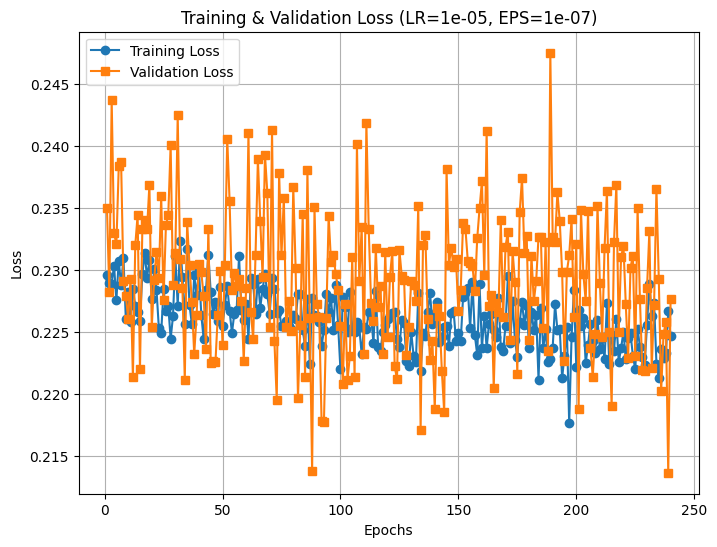

Validation Accuracy for (LR=1e-05, EPS=1e-07, Epochs=240): 0.2136

Testing Hyperparameters: Learning Rate = 2e-05, Epsilon = 1e-08, Epochs = 60


Epoch 1: Train Loss: 0.2227, Validation Loss: 0.2176


Epoch 2: Train Loss: 0.2244, Validation Loss: 0.2170


Epoch 3: Train Loss: 0.2238, Validation Loss: 0.2419


Epoch 4: Train Loss: 0.2227, Validation Loss: 0.2300


Epoch 5: Train Loss: 0.2202, Validation Loss: 0.2229


Epoch 6: Train Loss: 0.2246, Validation Loss: 0.2373


Epoch 7: Train Loss: 0.2239, Validation Loss: 0.2312


Epoch 8: Train Loss: 0.2238, Validation Loss: 0.2219


Epoch 9: Train Loss: 0.2251, Validation Loss: 0.2343


Epoch 10: Train Loss: 0.2244, Validation Loss: 0.2232


Epoch 11: Train Loss: 0.2227, Validation Loss: 0.2268


Epoch 12: Train Loss: 0.2232, Validation Loss: 0.2260


Epoch 13: Train Loss: 0.2213, Validation Loss: 0.2227


Epoch 14: Train Loss: 0.2266, Validation Loss: 0.2372


Epoch 15: Train Loss: 0.2220, Validation Loss: 0.2214


Epoch 16: Train Loss: 0.2243, Validation Loss: 0.2231


Epoch 17: Train Loss: 0.2254, Validation Loss: 0.2299


Epoch 18: Train Loss: 0.2275, Validation Loss: 0.2220


Epoch 19: Train Loss: 0.2260, Validation Loss: 0.2232


Epoch 20: Train Loss: 0.2268, Validation Loss: 0.2327


Epoch 21: Train Loss: 0.2240, Validation Loss: 0.2330


Epoch 22: Train Loss: 0.2249, Validation Loss: 0.2225


Epoch 23: Train Loss: 0.2225, Validation Loss: 0.2345


Epoch 24: Train Loss: 0.2250, Validation Loss: 0.2292


Epoch 25: Train Loss: 0.2243, Validation Loss: 0.2221


Epoch 26: Train Loss: 0.2230, Validation Loss: 0.2287


Epoch 27: Train Loss: 0.2249, Validation Loss: 0.2222


Epoch 28: Train Loss: 0.2270, Validation Loss: 0.2228


Epoch 29: Train Loss: 0.2230, Validation Loss: 0.2285


Epoch 30: Train Loss: 0.2254, Validation Loss: 0.2352


Epoch 31: Train Loss: 0.2233, Validation Loss: 0.2282


Epoch 32: Train Loss: 0.2250, Validation Loss: 0.2264


Epoch 33: Train Loss: 0.2234, Validation Loss: 0.2174


Epoch 34: Train Loss: 0.2219, Validation Loss: 0.2201


Epoch 35: Train Loss: 0.2214, Validation Loss: 0.2236


Epoch 36: Train Loss: 0.2222, Validation Loss: 0.2280


Epoch 37: Train Loss: 0.2244, Validation Loss: 0.2299


Epoch 38: Train Loss: 0.2262, Validation Loss: 0.2342


Epoch 39: Train Loss: 0.2272, Validation Loss: 0.2331


Epoch 40: Train Loss: 0.2256, Validation Loss: 0.2219


Epoch 41: Train Loss: 0.2250, Validation Loss: 0.2248


Epoch 42: Train Loss: 0.2247, Validation Loss: 0.2193


Epoch 43: Train Loss: 0.2219, Validation Loss: 0.2233


Epoch 44: Train Loss: 0.2221, Validation Loss: 0.2201


Epoch 45: Train Loss: 0.2216, Validation Loss: 0.2207


Epoch 46: Train Loss: 0.2200, Validation Loss: 0.2404


Epoch 47: Train Loss: 0.2235, Validation Loss: 0.2233


Epoch 48: Train Loss: 0.2207, Validation Loss: 0.2312


Epoch 49: Train Loss: 0.2221, Validation Loss: 0.2320


Epoch 50: Train Loss: 0.2225, Validation Loss: 0.2263


Epoch 51: Train Loss: 0.2238, Validation Loss: 0.2422


Epoch 52: Train Loss: 0.2172, Validation Loss: 0.2243


Epoch 53: Train Loss: 0.2263, Validation Loss: 0.2293


Epoch 54: Train Loss: 0.2225, Validation Loss: 0.2215


Epoch 55: Train Loss: 0.2203, Validation Loss: 0.2288


Epoch 56: Train Loss: 0.2248, Validation Loss: 0.2297


Epoch 57: Train Loss: 0.2251, Validation Loss: 0.2265


Epoch 58: Train Loss: 0.2219, Validation Loss: 0.2240


Epoch 59: Train Loss: 0.2235, Validation Loss: 0.2248


Epoch 60: Train Loss: 0.2220, Validation Loss: 0.2253


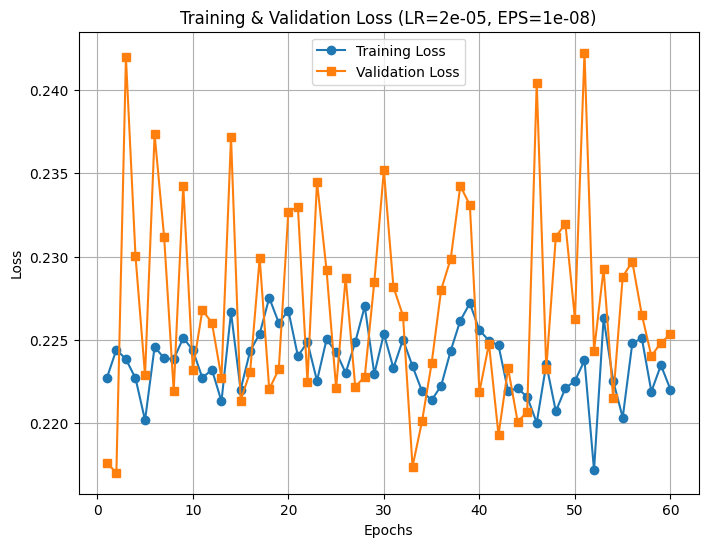

Validation Accuracy for (LR=2e-05, EPS=1e-08, Epochs=60): 0.2170

Testing Hyperparameters: Learning Rate = 2e-05, Epsilon = 1e-08, Epochs = 120


Epoch 1: Train Loss: 0.2241, Validation Loss: 0.2250


Epoch 2: Train Loss: 0.2213, Validation Loss: 0.2294


Epoch 3: Train Loss: 0.2218, Validation Loss: 0.2195


Epoch 4: Train Loss: 0.2205, Validation Loss: 0.2166


Epoch 5: Train Loss: 0.2202, Validation Loss: 0.2238


Epoch 6: Train Loss: 0.2234, Validation Loss: 0.2248


Epoch 7: Train Loss: 0.2228, Validation Loss: 0.2295


Epoch 8: Train Loss: 0.2245, Validation Loss: 0.2327


Epoch 9: Train Loss: 0.2228, Validation Loss: 0.2272


Epoch 10: Train Loss: 0.2171, Validation Loss: 0.2297


Epoch 11: Train Loss: 0.2234, Validation Loss: 0.2294


Epoch 12: Train Loss: 0.2269, Validation Loss: 0.2247


Epoch 13: Train Loss: 0.2219, Validation Loss: 0.2192


Epoch 14: Train Loss: 0.2257, Validation Loss: 0.2242


Epoch 15: Train Loss: 0.2210, Validation Loss: 0.2300


Epoch 16: Train Loss: 0.2230, Validation Loss: 0.2200


Epoch 17: Train Loss: 0.2214, Validation Loss: 0.2250


Epoch 18: Train Loss: 0.2236, Validation Loss: 0.2261


Epoch 19: Train Loss: 0.2228, Validation Loss: 0.2256


Epoch 20: Train Loss: 0.2236, Validation Loss: 0.2261


Epoch 21: Train Loss: 0.2195, Validation Loss: 0.2251


Epoch 22: Train Loss: 0.2201, Validation Loss: 0.2246


Epoch 23: Train Loss: 0.2209, Validation Loss: 0.2268


Epoch 24: Train Loss: 0.2256, Validation Loss: 0.2234


Epoch 25: Train Loss: 0.2201, Validation Loss: 0.2188


Epoch 26: Train Loss: 0.2249, Validation Loss: 0.2312


Epoch 27: Train Loss: 0.2223, Validation Loss: 0.2289


Epoch 28: Train Loss: 0.2215, Validation Loss: 0.2339


Epoch 29: Train Loss: 0.2229, Validation Loss: 0.2271


Epoch 30: Train Loss: 0.2225, Validation Loss: 0.2233


Epoch 31: Train Loss: 0.2221, Validation Loss: 0.2198


Epoch 32: Train Loss: 0.2269, Validation Loss: 0.2270


Epoch 33: Train Loss: 0.2224, Validation Loss: 0.2271


Epoch 34: Train Loss: 0.2248, Validation Loss: 0.2211


Epoch 35: Train Loss: 0.2239, Validation Loss: 0.2274


Epoch 36: Train Loss: 0.2203, Validation Loss: 0.2287


Epoch 37: Train Loss: 0.2238, Validation Loss: 0.2299


Epoch 38: Train Loss: 0.2231, Validation Loss: 0.2240


Epoch 39: Train Loss: 0.2198, Validation Loss: 0.2210


Epoch 40: Train Loss: 0.2225, Validation Loss: 0.2217


Epoch 41: Train Loss: 0.2253, Validation Loss: 0.2249


Epoch 42: Train Loss: 0.2250, Validation Loss: 0.2338


Epoch 43: Train Loss: 0.2231, Validation Loss: 0.2331


Epoch 44: Train Loss: 0.2237, Validation Loss: 0.2231


Epoch 45: Train Loss: 0.2209, Validation Loss: 0.2250


Epoch 46: Train Loss: 0.2233, Validation Loss: 0.2249


Epoch 47: Train Loss: 0.2220, Validation Loss: 0.2238


Epoch 48: Train Loss: 0.2244, Validation Loss: 0.2262


Epoch 49: Train Loss: 0.2210, Validation Loss: 0.2313


Epoch 50: Train Loss: 0.2206, Validation Loss: 0.2309


Epoch 51: Train Loss: 0.2221, Validation Loss: 0.2231


Epoch 52: Train Loss: 0.2224, Validation Loss: 0.2270


Epoch 53: Train Loss: 0.2229, Validation Loss: 0.2300


Epoch 54: Train Loss: 0.2203, Validation Loss: 0.2223


Epoch 55: Train Loss: 0.2208, Validation Loss: 0.2420


Epoch 56: Train Loss: 0.2238, Validation Loss: 0.2190


Epoch 57: Train Loss: 0.2251, Validation Loss: 0.2205


Epoch 58: Train Loss: 0.2211, Validation Loss: 0.2303


Epoch 59: Train Loss: 0.2227, Validation Loss: 0.2175


Epoch 60: Train Loss: 0.2215, Validation Loss: 0.2203


Epoch 61: Train Loss: 0.2224, Validation Loss: 0.2207


Epoch 62: Train Loss: 0.2203, Validation Loss: 0.2163


Epoch 63: Train Loss: 0.2227, Validation Loss: 0.2260


Epoch 64: Train Loss: 0.2235, Validation Loss: 0.2303


Epoch 65: Train Loss: 0.2256, Validation Loss: 0.2336


Epoch 66: Train Loss: 0.2204, Validation Loss: 0.2235


Epoch 67: Train Loss: 0.2219, Validation Loss: 0.2247


Epoch 68: Train Loss: 0.2221, Validation Loss: 0.2209


Epoch 69: Train Loss: 0.2203, Validation Loss: 0.2270


Epoch 70: Train Loss: 0.2217, Validation Loss: 0.2250


Epoch 71: Train Loss: 0.2260, Validation Loss: 0.2253


Epoch 72: Train Loss: 0.2244, Validation Loss: 0.2255


Epoch 73: Train Loss: 0.2244, Validation Loss: 0.2339


Epoch 74: Train Loss: 0.2216, Validation Loss: 0.2272


Epoch 75: Train Loss: 0.2240, Validation Loss: 0.2257


Epoch 76: Train Loss: 0.2204, Validation Loss: 0.2239


Epoch 77: Train Loss: 0.2246, Validation Loss: 0.2365


Epoch 78: Train Loss: 0.2220, Validation Loss: 0.2187


Epoch 79: Train Loss: 0.2245, Validation Loss: 0.2224


Epoch 80: Train Loss: 0.2238, Validation Loss: 0.2282


Epoch 81: Train Loss: 0.2230, Validation Loss: 0.2370


Epoch 82: Train Loss: 0.2218, Validation Loss: 0.2165


Epoch 83: Train Loss: 0.2218, Validation Loss: 0.2301


Epoch 84: Train Loss: 0.2223, Validation Loss: 0.2289


Epoch 85: Train Loss: 0.2214, Validation Loss: 0.2278


Epoch 86: Train Loss: 0.2205, Validation Loss: 0.2301


Epoch 87: Train Loss: 0.2228, Validation Loss: 0.2270


Epoch 88: Train Loss: 0.2200, Validation Loss: 0.2255


Epoch 89: Train Loss: 0.2259, Validation Loss: 0.2263


Epoch 90: Train Loss: 0.2220, Validation Loss: 0.2222


Epoch 91: Train Loss: 0.2220, Validation Loss: 0.2203


Epoch 92: Train Loss: 0.2226, Validation Loss: 0.2277


Epoch 93: Train Loss: 0.2225, Validation Loss: 0.2221


Epoch 94: Train Loss: 0.2216, Validation Loss: 0.2236


Epoch 95: Train Loss: 0.2190, Validation Loss: 0.2328


Epoch 96: Train Loss: 0.2236, Validation Loss: 0.2214


Epoch 97: Train Loss: 0.2210, Validation Loss: 0.2386


Epoch 98: Train Loss: 0.2196, Validation Loss: 0.2194


Epoch 99: Train Loss: 0.2256, Validation Loss: 0.2201


Epoch 100: Train Loss: 0.2202, Validation Loss: 0.2286


Epoch 101: Train Loss: 0.2217, Validation Loss: 0.2265


Epoch 102: Train Loss: 0.2207, Validation Loss: 0.2272


Epoch 103: Train Loss: 0.2192, Validation Loss: 0.2314


Epoch 104: Train Loss: 0.2224, Validation Loss: 0.2308


Epoch 105: Train Loss: 0.2202, Validation Loss: 0.2297


Epoch 106: Train Loss: 0.2222, Validation Loss: 0.2275


Epoch 107: Train Loss: 0.2225, Validation Loss: 0.2334


Epoch 108: Train Loss: 0.2241, Validation Loss: 0.2258


Epoch 109: Train Loss: 0.2202, Validation Loss: 0.2297


Epoch 110: Train Loss: 0.2185, Validation Loss: 0.2333


Epoch 111: Train Loss: 0.2190, Validation Loss: 0.2310


Epoch 112: Train Loss: 0.2192, Validation Loss: 0.2255


Epoch 113: Train Loss: 0.2222, Validation Loss: 0.2271


Epoch 114: Train Loss: 0.2201, Validation Loss: 0.2205


Epoch 115: Train Loss: 0.2246, Validation Loss: 0.2307


Epoch 116: Train Loss: 0.2212, Validation Loss: 0.2273


Epoch 117: Train Loss: 0.2196, Validation Loss: 0.2178


Epoch 118: Train Loss: 0.2224, Validation Loss: 0.2276


Epoch 119: Train Loss: 0.2217, Validation Loss: 0.2282


Epoch 120: Train Loss: 0.2216, Validation Loss: 0.2260


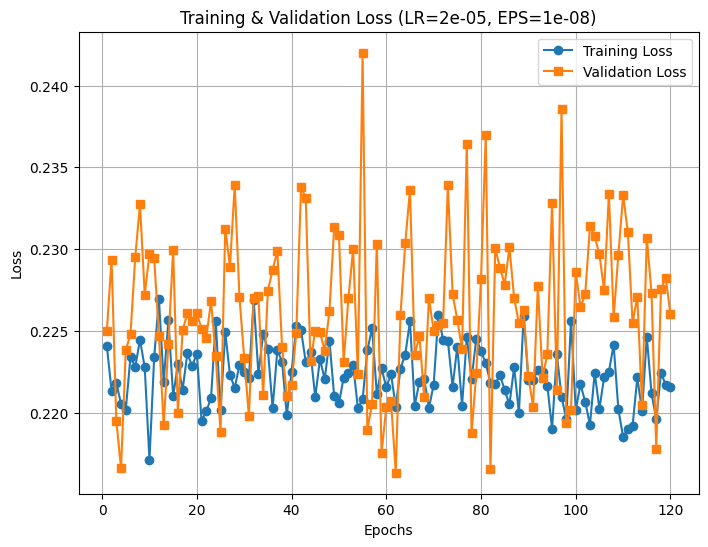

Validation Accuracy for (LR=2e-05, EPS=1e-08, Epochs=120): 0.2163

Testing Hyperparameters: Learning Rate = 2e-05, Epsilon = 1e-08, Epochs = 240


Epoch 1: Train Loss: 0.2218, Validation Loss: 0.2291


Epoch 2: Train Loss: 0.2225, Validation Loss: 0.2170


Epoch 3: Train Loss: 0.2203, Validation Loss: 0.2283


Epoch 4: Train Loss: 0.2210, Validation Loss: 0.2350


Epoch 5: Train Loss: 0.2235, Validation Loss: 0.2305


Epoch 6: Train Loss: 0.2245, Validation Loss: 0.2291


Epoch 7: Train Loss: 0.2201, Validation Loss: 0.2305


Epoch 8: Train Loss: 0.2221, Validation Loss: 0.2274


Epoch 9: Train Loss: 0.2190, Validation Loss: 0.2333


Epoch 10: Train Loss: 0.2175, Validation Loss: 0.2197


Epoch 11: Train Loss: 0.2204, Validation Loss: 0.2375


Epoch 12: Train Loss: 0.2208, Validation Loss: 0.2168


Epoch 13: Train Loss: 0.2176, Validation Loss: 0.2307


Epoch 14: Train Loss: 0.2237, Validation Loss: 0.2165


Epoch 15: Train Loss: 0.2201, Validation Loss: 0.2237


Epoch 16: Train Loss: 0.2200, Validation Loss: 0.2205


Epoch 17: Train Loss: 0.2217, Validation Loss: 0.2298


Epoch 18: Train Loss: 0.2211, Validation Loss: 0.2237


Epoch 19: Train Loss: 0.2239, Validation Loss: 0.2291


Epoch 20: Train Loss: 0.2196, Validation Loss: 0.2152


Epoch 21: Train Loss: 0.2191, Validation Loss: 0.2271


Epoch 22: Train Loss: 0.2222, Validation Loss: 0.2275


Epoch 23: Train Loss: 0.2187, Validation Loss: 0.2188


Epoch 24: Train Loss: 0.2195, Validation Loss: 0.2251


Epoch 25: Train Loss: 0.2232, Validation Loss: 0.2260


Epoch 26: Train Loss: 0.2223, Validation Loss: 0.2302


Epoch 27: Train Loss: 0.2189, Validation Loss: 0.2243


Epoch 28: Train Loss: 0.2195, Validation Loss: 0.2195


Epoch 29: Train Loss: 0.2205, Validation Loss: 0.2272


Epoch 30: Train Loss: 0.2224, Validation Loss: 0.2285


Epoch 31: Train Loss: 0.2212, Validation Loss: 0.2371


Epoch 32: Train Loss: 0.2235, Validation Loss: 0.2344


Epoch 33: Train Loss: 0.2193, Validation Loss: 0.2235


Epoch 34: Train Loss: 0.2197, Validation Loss: 0.2257


Epoch 35: Train Loss: 0.2193, Validation Loss: 0.2257


Epoch 36: Train Loss: 0.2224, Validation Loss: 0.2139


Epoch 37: Train Loss: 0.2201, Validation Loss: 0.2261


Epoch 38: Train Loss: 0.2198, Validation Loss: 0.2408


Epoch 39: Train Loss: 0.2210, Validation Loss: 0.2339


Epoch 40: Train Loss: 0.2221, Validation Loss: 0.2374


Epoch 41: Train Loss: 0.2187, Validation Loss: 0.2283


Epoch 42: Train Loss: 0.2194, Validation Loss: 0.2346


Epoch 43: Train Loss: 0.2229, Validation Loss: 0.2172


Epoch 44: Train Loss: 0.2199, Validation Loss: 0.2164


Epoch 45: Train Loss: 0.2240, Validation Loss: 0.2245


Epoch 46: Train Loss: 0.2228, Validation Loss: 0.2257


Epoch 47: Train Loss: 0.2192, Validation Loss: 0.2196


Epoch 48: Train Loss: 0.2221, Validation Loss: 0.2329


Epoch 49: Train Loss: 0.2219, Validation Loss: 0.2201


Epoch 50: Train Loss: 0.2227, Validation Loss: 0.2259


Epoch 51: Train Loss: 0.2214, Validation Loss: 0.2239


Epoch 52: Train Loss: 0.2207, Validation Loss: 0.2340


Epoch 53: Train Loss: 0.2196, Validation Loss: 0.2303


Epoch 54: Train Loss: 0.2220, Validation Loss: 0.2218


Epoch 55: Train Loss: 0.2193, Validation Loss: 0.2215


Epoch 56: Train Loss: 0.2191, Validation Loss: 0.2287


Epoch 57: Train Loss: 0.2195, Validation Loss: 0.2220


Epoch 58: Train Loss: 0.2221, Validation Loss: 0.2213


Epoch 59: Train Loss: 0.2226, Validation Loss: 0.2184


Epoch 60: Train Loss: 0.2221, Validation Loss: 0.2304


Epoch 61: Train Loss: 0.2193, Validation Loss: 0.2295


Epoch 62: Train Loss: 0.2199, Validation Loss: 0.2178


Epoch 63: Train Loss: 0.2178, Validation Loss: 0.2193


Epoch 64: Train Loss: 0.2213, Validation Loss: 0.2264


Epoch 65: Train Loss: 0.2221, Validation Loss: 0.2219


Epoch 66: Train Loss: 0.2186, Validation Loss: 0.2253


Epoch 67: Train Loss: 0.2169, Validation Loss: 0.2238


Epoch 68: Train Loss: 0.2204, Validation Loss: 0.2391


Epoch 69: Train Loss: 0.2201, Validation Loss: 0.2296


Epoch 70: Train Loss: 0.2200, Validation Loss: 0.2301


Epoch 71: Train Loss: 0.2211, Validation Loss: 0.2320


Epoch 72: Train Loss: 0.2202, Validation Loss: 0.2287


Epoch 73: Train Loss: 0.2174, Validation Loss: 0.2335


Epoch 74: Train Loss: 0.2211, Validation Loss: 0.2216


Epoch 75: Train Loss: 0.2198, Validation Loss: 0.2212


Epoch 76: Train Loss: 0.2198, Validation Loss: 0.2272


Epoch 77: Train Loss: 0.2188, Validation Loss: 0.2190


Epoch 78: Train Loss: 0.2205, Validation Loss: 0.2273


Epoch 79: Train Loss: 0.2215, Validation Loss: 0.2197


Epoch 80: Train Loss: 0.2205, Validation Loss: 0.2222


Epoch 81: Train Loss: 0.2228, Validation Loss: 0.2212


Epoch 82: Train Loss: 0.2204, Validation Loss: 0.2325


Epoch 83: Train Loss: 0.2179, Validation Loss: 0.2311


Epoch 84: Train Loss: 0.2178, Validation Loss: 0.2249


Epoch 85: Train Loss: 0.2190, Validation Loss: 0.2317


Epoch 86: Train Loss: 0.2200, Validation Loss: 0.2293


Epoch 87: Train Loss: 0.2206, Validation Loss: 0.2321


Epoch 88: Train Loss: 0.2229, Validation Loss: 0.2336


Epoch 89: Train Loss: 0.2228, Validation Loss: 0.2231


Epoch 90: Train Loss: 0.2191, Validation Loss: 0.2290


Epoch 91: Train Loss: 0.2166, Validation Loss: 0.2236


Epoch 92: Train Loss: 0.2197, Validation Loss: 0.2243


Epoch 93: Train Loss: 0.2175, Validation Loss: 0.2275


Epoch 94: Train Loss: 0.2191, Validation Loss: 0.2203


Epoch 95: Train Loss: 0.2164, Validation Loss: 0.2252


Epoch 96: Train Loss: 0.2199, Validation Loss: 0.2264


Epoch 97: Train Loss: 0.2188, Validation Loss: 0.2156


Epoch 98: Train Loss: 0.2184, Validation Loss: 0.2242


Epoch 99: Train Loss: 0.2226, Validation Loss: 0.2285


Epoch 100: Train Loss: 0.2188, Validation Loss: 0.2314


Epoch 101: Train Loss: 0.2231, Validation Loss: 0.2217


Epoch 102: Train Loss: 0.2187, Validation Loss: 0.2102


Epoch 103: Train Loss: 0.2181, Validation Loss: 0.2359


Epoch 104: Train Loss: 0.2224, Validation Loss: 0.2219


Epoch 105: Train Loss: 0.2208, Validation Loss: 0.2297


Epoch 106: Train Loss: 0.2213, Validation Loss: 0.2177


Epoch 107: Train Loss: 0.2188, Validation Loss: 0.2342


Epoch 108: Train Loss: 0.2168, Validation Loss: 0.2298


Epoch 109: Train Loss: 0.2208, Validation Loss: 0.2260


Epoch 110: Train Loss: 0.2162, Validation Loss: 0.2308


Epoch 111: Train Loss: 0.2198, Validation Loss: 0.2281


Epoch 112: Train Loss: 0.2184, Validation Loss: 0.2155


Epoch 113: Train Loss: 0.2232, Validation Loss: 0.2133


Epoch 114: Train Loss: 0.2212, Validation Loss: 0.2198


Epoch 115: Train Loss: 0.2204, Validation Loss: 0.2292


Epoch 116: Train Loss: 0.2192, Validation Loss: 0.2249


Epoch 117: Train Loss: 0.2208, Validation Loss: 0.2216


Epoch 118: Train Loss: 0.2221, Validation Loss: 0.2218


Epoch 119: Train Loss: 0.2196, Validation Loss: 0.2223


Epoch 120: Train Loss: 0.2188, Validation Loss: 0.2365


Epoch 121: Train Loss: 0.2189, Validation Loss: 0.2245


Epoch 122: Train Loss: 0.2230, Validation Loss: 0.2287


Epoch 123: Train Loss: 0.2230, Validation Loss: 0.2332


Epoch 124: Train Loss: 0.2208, Validation Loss: 0.2235


Epoch 125: Train Loss: 0.2177, Validation Loss: 0.2255


Epoch 126: Train Loss: 0.2150, Validation Loss: 0.2264


Epoch 127: Train Loss: 0.2183, Validation Loss: 0.2217


Epoch 128: Train Loss: 0.2211, Validation Loss: 0.2301


Epoch 129: Train Loss: 0.2199, Validation Loss: 0.2148


Epoch 130: Train Loss: 0.2129, Validation Loss: 0.2285


Epoch 131: Train Loss: 0.2201, Validation Loss: 0.2357


Epoch 132: Train Loss: 0.2189, Validation Loss: 0.2250


Epoch 133: Train Loss: 0.2214, Validation Loss: 0.2293


Epoch 134: Train Loss: 0.2260, Validation Loss: 0.2247


Epoch 135: Train Loss: 0.2205, Validation Loss: 0.2217


Epoch 136: Train Loss: 0.2221, Validation Loss: 0.2157


Epoch 137: Train Loss: 0.2201, Validation Loss: 0.2224


Epoch 138: Train Loss: 0.2186, Validation Loss: 0.2218


Epoch 139: Train Loss: 0.2205, Validation Loss: 0.2336


Epoch 140: Train Loss: 0.2204, Validation Loss: 0.2171


Epoch 141: Train Loss: 0.2207, Validation Loss: 0.2287


Epoch 142: Train Loss: 0.2178, Validation Loss: 0.2268


Epoch 143: Train Loss: 0.2181, Validation Loss: 0.2232


Epoch 144: Train Loss: 0.2205, Validation Loss: 0.2199


Epoch 145: Train Loss: 0.2194, Validation Loss: 0.2177


Epoch 146: Train Loss: 0.2134, Validation Loss: 0.2245


Epoch 147: Train Loss: 0.2188, Validation Loss: 0.2202


Epoch 148: Train Loss: 0.2188, Validation Loss: 0.2203


Epoch 149: Train Loss: 0.2178, Validation Loss: 0.2217


Epoch 150: Train Loss: 0.2188, Validation Loss: 0.2263


Epoch 151: Train Loss: 0.2174, Validation Loss: 0.2311


Epoch 152: Train Loss: 0.2205, Validation Loss: 0.2374


Epoch 153: Train Loss: 0.2179, Validation Loss: 0.2304


Epoch 154: Train Loss: 0.2180, Validation Loss: 0.2336


Epoch 155: Train Loss: 0.2195, Validation Loss: 0.2286


Epoch 156: Train Loss: 0.2176, Validation Loss: 0.2262


Epoch 157: Train Loss: 0.2158, Validation Loss: 0.2278


Epoch 158: Train Loss: 0.2199, Validation Loss: 0.2250


Epoch 159: Train Loss: 0.2205, Validation Loss: 0.2208


Epoch 160: Train Loss: 0.2161, Validation Loss: 0.2310


Epoch 161: Train Loss: 0.2195, Validation Loss: 0.2335


Epoch 162: Train Loss: 0.2198, Validation Loss: 0.2280


Epoch 163: Train Loss: 0.2162, Validation Loss: 0.2228


Epoch 164: Train Loss: 0.2202, Validation Loss: 0.2277


Epoch 165: Train Loss: 0.2155, Validation Loss: 0.2155


Epoch 166: Train Loss: 0.2181, Validation Loss: 0.2273


Epoch 167: Train Loss: 0.2202, Validation Loss: 0.2315


Epoch 168: Train Loss: 0.2223, Validation Loss: 0.2262


Epoch 169: Train Loss: 0.2200, Validation Loss: 0.2243


Epoch 170: Train Loss: 0.2186, Validation Loss: 0.2318


Epoch 171: Train Loss: 0.2170, Validation Loss: 0.2269


Epoch 172: Train Loss: 0.2161, Validation Loss: 0.2281


Epoch 173: Train Loss: 0.2192, Validation Loss: 0.2324


Epoch 174: Train Loss: 0.2197, Validation Loss: 0.2223


Epoch 175: Train Loss: 0.2206, Validation Loss: 0.2283


Epoch 176: Train Loss: 0.2211, Validation Loss: 0.2299


Epoch 177: Train Loss: 0.2187, Validation Loss: 0.2178


Epoch 178: Train Loss: 0.2178, Validation Loss: 0.2257


Epoch 179: Train Loss: 0.2162, Validation Loss: 0.2319


Epoch 180: Train Loss: 0.2188, Validation Loss: 0.2204


Epoch 181: Train Loss: 0.2195, Validation Loss: 0.2170


Epoch 182: Train Loss: 0.2195, Validation Loss: 0.2308


Epoch 183: Train Loss: 0.2157, Validation Loss: 0.2244


Epoch 184: Train Loss: 0.2210, Validation Loss: 0.2262


Epoch 185: Train Loss: 0.2165, Validation Loss: 0.2233


Epoch 186: Train Loss: 0.2171, Validation Loss: 0.2181


Epoch 187: Train Loss: 0.2194, Validation Loss: 0.2210


Epoch 188: Train Loss: 0.2207, Validation Loss: 0.2210


Epoch 189: Train Loss: 0.2189, Validation Loss: 0.2313


Epoch 190: Train Loss: 0.2217, Validation Loss: 0.2269


Epoch 191: Train Loss: 0.2212, Validation Loss: 0.2193


Epoch 192: Train Loss: 0.2193, Validation Loss: 0.2270


Epoch 193: Train Loss: 0.2200, Validation Loss: 0.2208


Epoch 194: Train Loss: 0.2193, Validation Loss: 0.2225


Epoch 195: Train Loss: 0.2182, Validation Loss: 0.2380


Epoch 196: Train Loss: 0.2207, Validation Loss: 0.2200


Epoch 197: Train Loss: 0.2190, Validation Loss: 0.2264


Epoch 198: Train Loss: 0.2206, Validation Loss: 0.2306


Epoch 199: Train Loss: 0.2186, Validation Loss: 0.2252


Epoch 200: Train Loss: 0.2205, Validation Loss: 0.2163


Epoch 201: Train Loss: 0.2169, Validation Loss: 0.2267


Epoch 202: Train Loss: 0.2163, Validation Loss: 0.2212


Epoch 203: Train Loss: 0.2179, Validation Loss: 0.2170


Epoch 204: Train Loss: 0.2186, Validation Loss: 0.2327


Epoch 205: Train Loss: 0.2183, Validation Loss: 0.2253


Epoch 206: Train Loss: 0.2182, Validation Loss: 0.2300


Epoch 207: Train Loss: 0.2160, Validation Loss: 0.2276


Epoch 208: Train Loss: 0.2193, Validation Loss: 0.2210


Epoch 209: Train Loss: 0.2190, Validation Loss: 0.2291


Epoch 210: Train Loss: 0.2231, Validation Loss: 0.2249


Epoch 211: Train Loss: 0.2183, Validation Loss: 0.2248


Epoch 212: Train Loss: 0.2198, Validation Loss: 0.2287


Epoch 213: Train Loss: 0.2163, Validation Loss: 0.2298


Epoch 214: Train Loss: 0.2202, Validation Loss: 0.2249


Epoch 215: Train Loss: 0.2178, Validation Loss: 0.2324


Epoch 216: Train Loss: 0.2170, Validation Loss: 0.2409


Epoch 217: Train Loss: 0.2188, Validation Loss: 0.2195


Epoch 218: Train Loss: 0.2169, Validation Loss: 0.2315


Epoch 219: Train Loss: 0.2189, Validation Loss: 0.2373


Epoch 220: Train Loss: 0.2189, Validation Loss: 0.2292


Epoch 221: Train Loss: 0.2153, Validation Loss: 0.2246


Epoch 222: Train Loss: 0.2223, Validation Loss: 0.2213


Epoch 223: Train Loss: 0.2175, Validation Loss: 0.2267


Epoch 224: Train Loss: 0.2184, Validation Loss: 0.2215


Epoch 225: Train Loss: 0.2197, Validation Loss: 0.2232


Epoch 226: Train Loss: 0.2168, Validation Loss: 0.2214


Epoch 227: Train Loss: 0.2170, Validation Loss: 0.2261


Epoch 228: Train Loss: 0.2211, Validation Loss: 0.2218


Epoch 229: Train Loss: 0.2177, Validation Loss: 0.2213


Epoch 230: Train Loss: 0.2188, Validation Loss: 0.2324


Epoch 231: Train Loss: 0.2185, Validation Loss: 0.2284


Epoch 232: Train Loss: 0.2154, Validation Loss: 0.2299


Epoch 233: Train Loss: 0.2179, Validation Loss: 0.2222


Epoch 234: Train Loss: 0.2195, Validation Loss: 0.2237


Epoch 235: Train Loss: 0.2172, Validation Loss: 0.2164


Epoch 236: Train Loss: 0.2155, Validation Loss: 0.2137


Epoch 237: Train Loss: 0.2183, Validation Loss: 0.2112


Epoch 238: Train Loss: 0.2168, Validation Loss: 0.2218


Epoch 239: Train Loss: 0.2205, Validation Loss: 0.2284


Epoch 240: Train Loss: 0.2187, Validation Loss: 0.2347


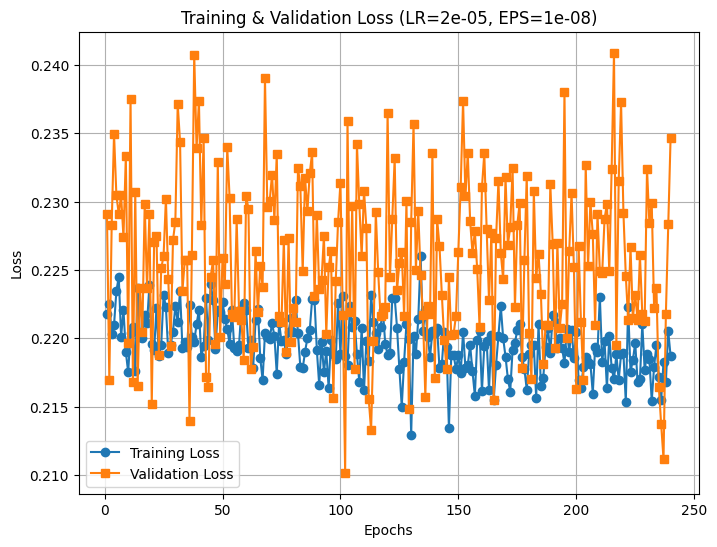

Validation Accuracy for (LR=2e-05, EPS=1e-08, Epochs=240): 0.2102

Testing Hyperparameters: Learning Rate = 2e-05, Epsilon = 1e-07, Epochs = 60


Epoch 1: Train Loss: 0.2176, Validation Loss: 0.2219


Epoch 2: Train Loss: 0.2191, Validation Loss: 0.2256


Epoch 3: Train Loss: 0.2178, Validation Loss: 0.2255


Epoch 4: Train Loss: 0.2192, Validation Loss: 0.2220


Epoch 5: Train Loss: 0.2140, Validation Loss: 0.2220


Epoch 6: Train Loss: 0.2204, Validation Loss: 0.2312


Epoch 7: Train Loss: 0.2146, Validation Loss: 0.2248


Epoch 8: Train Loss: 0.2168, Validation Loss: 0.2107


Epoch 9: Train Loss: 0.2148, Validation Loss: 0.2226


Epoch 10: Train Loss: 0.2184, Validation Loss: 0.2243


Epoch 11: Train Loss: 0.2162, Validation Loss: 0.2159


Epoch 12: Train Loss: 0.2172, Validation Loss: 0.2308


Epoch 13: Train Loss: 0.2147, Validation Loss: 0.2288


Epoch 14: Train Loss: 0.2182, Validation Loss: 0.2221


Epoch 15: Train Loss: 0.2199, Validation Loss: 0.2280


Epoch 16: Train Loss: 0.2205, Validation Loss: 0.2248


Epoch 17: Train Loss: 0.2156, Validation Loss: 0.2242


Epoch 18: Train Loss: 0.2195, Validation Loss: 0.2280


Epoch 19: Train Loss: 0.2182, Validation Loss: 0.2294


Epoch 20: Train Loss: 0.2155, Validation Loss: 0.2222


Epoch 21: Train Loss: 0.2188, Validation Loss: 0.2134


Epoch 22: Train Loss: 0.2174, Validation Loss: 0.2254


Epoch 23: Train Loss: 0.2179, Validation Loss: 0.2262


Epoch 24: Train Loss: 0.2174, Validation Loss: 0.2269


Epoch 25: Train Loss: 0.2132, Validation Loss: 0.2275


Epoch 26: Train Loss: 0.2173, Validation Loss: 0.2178


Epoch 27: Train Loss: 0.2167, Validation Loss: 0.2276


Epoch 28: Train Loss: 0.2118, Validation Loss: 0.2313


Epoch 29: Train Loss: 0.2166, Validation Loss: 0.2272


Epoch 30: Train Loss: 0.2191, Validation Loss: 0.2305


Epoch 31: Train Loss: 0.2182, Validation Loss: 0.2276


Epoch 32: Train Loss: 0.2189, Validation Loss: 0.2204


Epoch 33: Train Loss: 0.2172, Validation Loss: 0.2323


Epoch 34: Train Loss: 0.2162, Validation Loss: 0.2382


Epoch 35: Train Loss: 0.2232, Validation Loss: 0.2279


Epoch 36: Train Loss: 0.2181, Validation Loss: 0.2160


Epoch 37: Train Loss: 0.2176, Validation Loss: 0.2245


Epoch 38: Train Loss: 0.2183, Validation Loss: 0.2185


Epoch 39: Train Loss: 0.2192, Validation Loss: 0.2237


Epoch 40: Train Loss: 0.2159, Validation Loss: 0.2263


Epoch 41: Train Loss: 0.2166, Validation Loss: 0.2289


Epoch 42: Train Loss: 0.2165, Validation Loss: 0.2208


Epoch 43: Train Loss: 0.2162, Validation Loss: 0.2202


Epoch 44: Train Loss: 0.2184, Validation Loss: 0.2233


Epoch 45: Train Loss: 0.2147, Validation Loss: 0.2356


Epoch 46: Train Loss: 0.2162, Validation Loss: 0.2229


Epoch 47: Train Loss: 0.2212, Validation Loss: 0.2251


Epoch 48: Train Loss: 0.2170, Validation Loss: 0.2153


Epoch 49: Train Loss: 0.2164, Validation Loss: 0.2297


Epoch 50: Train Loss: 0.2156, Validation Loss: 0.2213


Epoch 51: Train Loss: 0.2173, Validation Loss: 0.2435


Epoch 52: Train Loss: 0.2170, Validation Loss: 0.2345


Epoch 53: Train Loss: 0.2169, Validation Loss: 0.2248


Epoch 54: Train Loss: 0.2161, Validation Loss: 0.2150


Epoch 55: Train Loss: 0.2163, Validation Loss: 0.2295


Epoch 56: Train Loss: 0.2151, Validation Loss: 0.2255


Epoch 57: Train Loss: 0.2168, Validation Loss: 0.2218


Epoch 58: Train Loss: 0.2163, Validation Loss: 0.2250


Epoch 59: Train Loss: 0.2153, Validation Loss: 0.2360


Epoch 60: Train Loss: 0.2153, Validation Loss: 0.2270


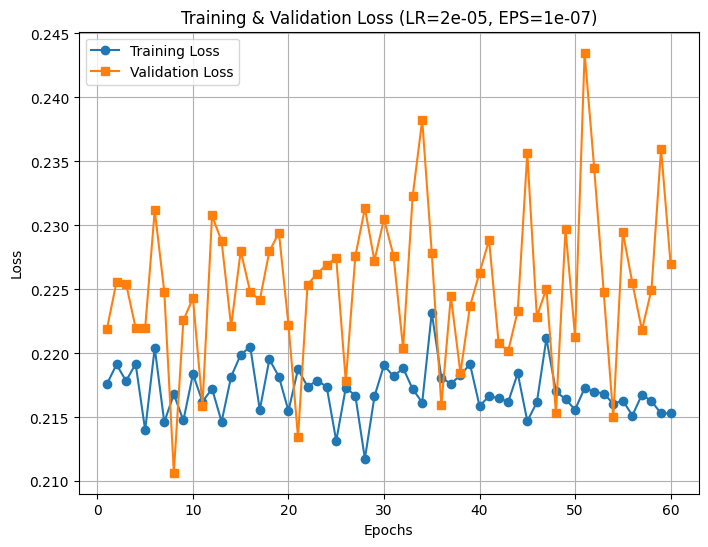

Validation Accuracy for (LR=2e-05, EPS=1e-07, Epochs=60): 0.2107

Testing Hyperparameters: Learning Rate = 2e-05, Epsilon = 1e-07, Epochs = 120


Epoch 1: Train Loss: 0.2174, Validation Loss: 0.2172


Epoch 2: Train Loss: 0.2152, Validation Loss: 0.2260


Epoch 3: Train Loss: 0.2143, Validation Loss: 0.2176


Epoch 4: Train Loss: 0.2162, Validation Loss: 0.2261


Epoch 5: Train Loss: 0.2169, Validation Loss: 0.2281


Epoch 6: Train Loss: 0.2194, Validation Loss: 0.2241


Epoch 7: Train Loss: 0.2144, Validation Loss: 0.2375


Epoch 8: Train Loss: 0.2151, Validation Loss: 0.2322


Epoch 9: Train Loss: 0.2206, Validation Loss: 0.2317


Epoch 10: Train Loss: 0.2214, Validation Loss: 0.2212


Epoch 11: Train Loss: 0.2163, Validation Loss: 0.2395


Epoch 12: Train Loss: 0.2121, Validation Loss: 0.2286


Epoch 13: Train Loss: 0.2220, Validation Loss: 0.2302


Epoch 14: Train Loss: 0.2175, Validation Loss: 0.2271


Epoch 15: Train Loss: 0.2141, Validation Loss: 0.2355


Epoch 16: Train Loss: 0.2202, Validation Loss: 0.2282


Epoch 17: Train Loss: 0.2166, Validation Loss: 0.2279


Epoch 18: Train Loss: 0.2137, Validation Loss: 0.2399


Epoch 19: Train Loss: 0.2181, Validation Loss: 0.2225


Epoch 20: Train Loss: 0.2168, Validation Loss: 0.2238


Epoch 21: Train Loss: 0.2192, Validation Loss: 0.2300


Epoch 22: Train Loss: 0.2151, Validation Loss: 0.2219


Epoch 23: Train Loss: 0.2171, Validation Loss: 0.2335


Epoch 24: Train Loss: 0.2185, Validation Loss: 0.2254


Epoch 25: Train Loss: 0.2204, Validation Loss: 0.2241


Epoch 26: Train Loss: 0.2156, Validation Loss: 0.2267


Epoch 27: Train Loss: 0.2163, Validation Loss: 0.2250


Epoch 28: Train Loss: 0.2165, Validation Loss: 0.2142


Epoch 29: Train Loss: 0.2171, Validation Loss: 0.2249


Epoch 30: Train Loss: 0.2156, Validation Loss: 0.2313


Epoch 31: Train Loss: 0.2152, Validation Loss: 0.2218


Epoch 32: Train Loss: 0.2151, Validation Loss: 0.2253


Epoch 33: Train Loss: 0.2166, Validation Loss: 0.2185


Epoch 34: Train Loss: 0.2152, Validation Loss: 0.2364


Epoch 35: Train Loss: 0.2138, Validation Loss: 0.2183


Epoch 36: Train Loss: 0.2197, Validation Loss: 0.2285


Epoch 37: Train Loss: 0.2159, Validation Loss: 0.2237


Epoch 38: Train Loss: 0.2154, Validation Loss: 0.2204


Epoch 39: Train Loss: 0.2173, Validation Loss: 0.2276


Epoch 40: Train Loss: 0.2173, Validation Loss: 0.2252


Epoch 41: Train Loss: 0.2166, Validation Loss: 0.2324


Epoch 42: Train Loss: 0.2173, Validation Loss: 0.2347


Epoch 43: Train Loss: 0.2151, Validation Loss: 0.2247


Epoch 44: Train Loss: 0.2153, Validation Loss: 0.2271


Epoch 45: Train Loss: 0.2197, Validation Loss: 0.2237


Epoch 46: Train Loss: 0.2139, Validation Loss: 0.2181


Epoch 47: Train Loss: 0.2145, Validation Loss: 0.2281


Epoch 48: Train Loss: 0.2151, Validation Loss: 0.2315


Epoch 49: Train Loss: 0.2167, Validation Loss: 0.2287


Epoch 50: Train Loss: 0.2160, Validation Loss: 0.2189


Epoch 51: Train Loss: 0.2168, Validation Loss: 0.2239


Epoch 52: Train Loss: 0.2176, Validation Loss: 0.2308


Epoch 53: Train Loss: 0.2127, Validation Loss: 0.2230


Epoch 54: Train Loss: 0.2154, Validation Loss: 0.2281


Epoch 55: Train Loss: 0.2148, Validation Loss: 0.2253


Epoch 56: Train Loss: 0.2167, Validation Loss: 0.2322


Epoch 57: Train Loss: 0.2146, Validation Loss: 0.2228


Epoch 58: Train Loss: 0.2115, Validation Loss: 0.2349


Epoch 59: Train Loss: 0.2166, Validation Loss: 0.2259


Epoch 60: Train Loss: 0.2150, Validation Loss: 0.2271


Epoch 61: Train Loss: 0.2218, Validation Loss: 0.2222


Epoch 62: Train Loss: 0.2169, Validation Loss: 0.2226


Epoch 63: Train Loss: 0.2165, Validation Loss: 0.2313


Epoch 64: Train Loss: 0.2162, Validation Loss: 0.2248


Epoch 65: Train Loss: 0.2152, Validation Loss: 0.2287


Epoch 66: Train Loss: 0.2173, Validation Loss: 0.2185


Epoch 67: Train Loss: 0.2146, Validation Loss: 0.2281


Epoch 68: Train Loss: 0.2179, Validation Loss: 0.2285


Epoch 69: Train Loss: 0.2166, Validation Loss: 0.2277


Epoch 70: Train Loss: 0.2151, Validation Loss: 0.2322


Epoch 71: Train Loss: 0.2153, Validation Loss: 0.2309


Epoch 72: Train Loss: 0.2162, Validation Loss: 0.2142


Epoch 73: Train Loss: 0.2151, Validation Loss: 0.2317


Epoch 74: Train Loss: 0.2139, Validation Loss: 0.2308


Epoch 75: Train Loss: 0.2154, Validation Loss: 0.2228


Epoch 76: Train Loss: 0.2172, Validation Loss: 0.2260


Epoch 77: Train Loss: 0.2138, Validation Loss: 0.2303


Epoch 78: Train Loss: 0.2191, Validation Loss: 0.2324


Epoch 79: Train Loss: 0.2176, Validation Loss: 0.2233


Epoch 80: Train Loss: 0.2176, Validation Loss: 0.2134


Epoch 81: Train Loss: 0.2177, Validation Loss: 0.2340


Epoch 82: Train Loss: 0.2140, Validation Loss: 0.2296


Epoch 83: Train Loss: 0.2163, Validation Loss: 0.2224


Epoch 84: Train Loss: 0.2170, Validation Loss: 0.2222


Epoch 85: Train Loss: 0.2144, Validation Loss: 0.2223


Epoch 86: Train Loss: 0.2171, Validation Loss: 0.2307


Epoch 87: Train Loss: 0.2150, Validation Loss: 0.2288


Epoch 88: Train Loss: 0.2164, Validation Loss: 0.2256


Epoch 89: Train Loss: 0.2172, Validation Loss: 0.2308


Epoch 90: Train Loss: 0.2153, Validation Loss: 0.2191


Epoch 91: Train Loss: 0.2126, Validation Loss: 0.2364


Epoch 92: Train Loss: 0.2161, Validation Loss: 0.2323


Epoch 93: Train Loss: 0.2144, Validation Loss: 0.2222


Epoch 94: Train Loss: 0.2133, Validation Loss: 0.2228


Epoch 95: Train Loss: 0.2168, Validation Loss: 0.2316


Epoch 96: Train Loss: 0.2163, Validation Loss: 0.2209


Epoch 97: Train Loss: 0.2155, Validation Loss: 0.2256


Epoch 98: Train Loss: 0.2128, Validation Loss: 0.2237


Epoch 99: Train Loss: 0.2144, Validation Loss: 0.2111


Epoch 100: Train Loss: 0.2162, Validation Loss: 0.2289


Epoch 101: Train Loss: 0.2147, Validation Loss: 0.2234


Epoch 102: Train Loss: 0.2168, Validation Loss: 0.2320


Epoch 103: Train Loss: 0.2143, Validation Loss: 0.2234


Epoch 104: Train Loss: 0.2156, Validation Loss: 0.2279


Epoch 105: Train Loss: 0.2168, Validation Loss: 0.2168


Epoch 106: Train Loss: 0.2134, Validation Loss: 0.2242


Epoch 107: Train Loss: 0.2129, Validation Loss: 0.2294


Epoch 108: Train Loss: 0.2145, Validation Loss: 0.2223


Epoch 109: Train Loss: 0.2134, Validation Loss: 0.2252


Epoch 110: Train Loss: 0.2143, Validation Loss: 0.2266


Epoch 111: Train Loss: 0.2185, Validation Loss: 0.2311


Epoch 112: Train Loss: 0.2165, Validation Loss: 0.2260


Epoch 113: Train Loss: 0.2126, Validation Loss: 0.2221


Epoch 114: Train Loss: 0.2155, Validation Loss: 0.2212


Epoch 115: Train Loss: 0.2152, Validation Loss: 0.2251


Epoch 116: Train Loss: 0.2173, Validation Loss: 0.2329


Epoch 117: Train Loss: 0.2154, Validation Loss: 0.2267


Epoch 118: Train Loss: 0.2148, Validation Loss: 0.2327


Epoch 119: Train Loss: 0.2195, Validation Loss: 0.2309


Epoch 120: Train Loss: 0.2159, Validation Loss: 0.2379


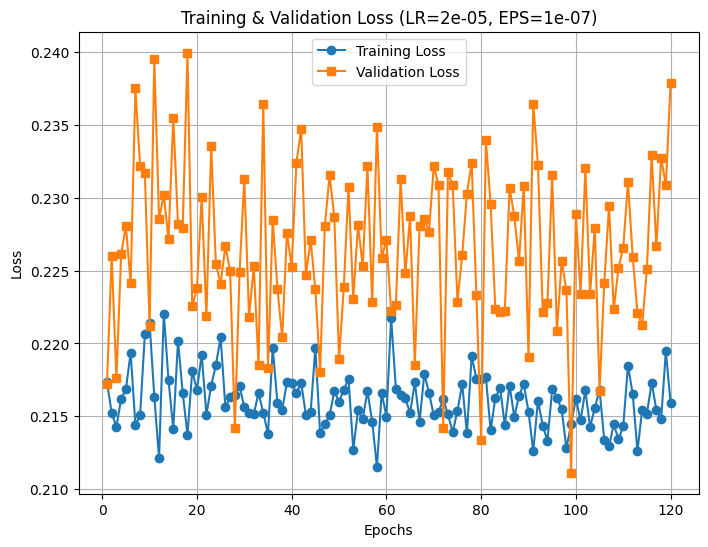

Validation Accuracy for (LR=2e-05, EPS=1e-07, Epochs=120): 0.2111

Testing Hyperparameters: Learning Rate = 2e-05, Epsilon = 1e-07, Epochs = 240


Epoch 1: Train Loss: 0.2163, Validation Loss: 0.2365


Epoch 2: Train Loss: 0.2185, Validation Loss: 0.2254


Epoch 3: Train Loss: 0.2140, Validation Loss: 0.2183


Epoch 4: Train Loss: 0.2153, Validation Loss: 0.2332


Epoch 5: Train Loss: 0.2168, Validation Loss: 0.2229


Epoch 6: Train Loss: 0.2144, Validation Loss: 0.2287


Epoch 7: Train Loss: 0.2189, Validation Loss: 0.2236


Epoch 8: Train Loss: 0.2144, Validation Loss: 0.2233


Epoch 9: Train Loss: 0.2140, Validation Loss: 0.2163


Epoch 10: Train Loss: 0.2145, Validation Loss: 0.2219


Epoch 11: Train Loss: 0.2140, Validation Loss: 0.2252


Epoch 12: Train Loss: 0.2169, Validation Loss: 0.2209


Epoch 13: Train Loss: 0.2126, Validation Loss: 0.2239


Epoch 14: Train Loss: 0.2118, Validation Loss: 0.2228


Epoch 15: Train Loss: 0.2142, Validation Loss: 0.2142


Epoch 16: Train Loss: 0.2205, Validation Loss: 0.2297


Epoch 17: Train Loss: 0.2131, Validation Loss: 0.2215


Epoch 18: Train Loss: 0.2143, Validation Loss: 0.2241


Epoch 19: Train Loss: 0.2157, Validation Loss: 0.2258


Epoch 20: Train Loss: 0.2141, Validation Loss: 0.2203


Epoch 21: Train Loss: 0.2160, Validation Loss: 0.2255


Epoch 22: Train Loss: 0.2158, Validation Loss: 0.2301


Epoch 23: Train Loss: 0.2146, Validation Loss: 0.2240


Epoch 24: Train Loss: 0.2139, Validation Loss: 0.2252


Epoch 25: Train Loss: 0.2168, Validation Loss: 0.2291


Epoch 26: Train Loss: 0.2141, Validation Loss: 0.2213


Epoch 27: Train Loss: 0.2148, Validation Loss: 0.2292


Epoch 28: Train Loss: 0.2134, Validation Loss: 0.2289


Epoch 29: Train Loss: 0.2154, Validation Loss: 0.2294


Epoch 30: Train Loss: 0.2134, Validation Loss: 0.2296


Epoch 31: Train Loss: 0.2151, Validation Loss: 0.2243


Epoch 32: Train Loss: 0.2125, Validation Loss: 0.2394


Epoch 33: Train Loss: 0.2131, Validation Loss: 0.2288


Epoch 34: Train Loss: 0.2162, Validation Loss: 0.2307


Epoch 35: Train Loss: 0.2161, Validation Loss: 0.2357


Epoch 36: Train Loss: 0.2152, Validation Loss: 0.2323


Epoch 37: Train Loss: 0.2116, Validation Loss: 0.2302


Epoch 38: Train Loss: 0.2132, Validation Loss: 0.2204


Epoch 39: Train Loss: 0.2150, Validation Loss: 0.2280


Epoch 40: Train Loss: 0.2107, Validation Loss: 0.2338


Epoch 41: Train Loss: 0.2158, Validation Loss: 0.2201


Epoch 42: Train Loss: 0.2156, Validation Loss: 0.2211


Epoch 43: Train Loss: 0.2167, Validation Loss: 0.2169


Epoch 44: Train Loss: 0.2131, Validation Loss: 0.2268


Epoch 45: Train Loss: 0.2131, Validation Loss: 0.2244


Epoch 46: Train Loss: 0.2127, Validation Loss: 0.2267


Epoch 47: Train Loss: 0.2117, Validation Loss: 0.2273


Epoch 48: Train Loss: 0.2123, Validation Loss: 0.2247


Epoch 49: Train Loss: 0.2118, Validation Loss: 0.2283


Epoch 50: Train Loss: 0.2158, Validation Loss: 0.2199


Epoch 51: Train Loss: 0.2152, Validation Loss: 0.2272


Epoch 52: Train Loss: 0.2146, Validation Loss: 0.2371


Epoch 53: Train Loss: 0.2157, Validation Loss: 0.2236


Epoch 54: Train Loss: 0.2122, Validation Loss: 0.2323


Epoch 55: Train Loss: 0.2165, Validation Loss: 0.2144


Epoch 56: Train Loss: 0.2164, Validation Loss: 0.2193


Epoch 57: Train Loss: 0.2159, Validation Loss: 0.2207


Epoch 58: Train Loss: 0.2131, Validation Loss: 0.2304


Epoch 59: Train Loss: 0.2143, Validation Loss: 0.2322


Epoch 60: Train Loss: 0.2175, Validation Loss: 0.2215


Epoch 61: Train Loss: 0.2126, Validation Loss: 0.2224


Epoch 62: Train Loss: 0.2150, Validation Loss: 0.2208


Epoch 63: Train Loss: 0.2132, Validation Loss: 0.2276


Epoch 64: Train Loss: 0.2132, Validation Loss: 0.2263


Epoch 65: Train Loss: 0.2139, Validation Loss: 0.2250


Epoch 66: Train Loss: 0.2088, Validation Loss: 0.2289


Epoch 67: Train Loss: 0.2157, Validation Loss: 0.2256


Epoch 68: Train Loss: 0.2136, Validation Loss: 0.2273


Epoch 69: Train Loss: 0.2139, Validation Loss: 0.2150


Epoch 70: Train Loss: 0.2123, Validation Loss: 0.2233


Epoch 71: Train Loss: 0.2143, Validation Loss: 0.2271


Epoch 72: Train Loss: 0.2140, Validation Loss: 0.2364


Epoch 73: Train Loss: 0.2117, Validation Loss: 0.2245


Epoch 74: Train Loss: 0.2151, Validation Loss: 0.2257


Epoch 75: Train Loss: 0.2115, Validation Loss: 0.2348


Epoch 76: Train Loss: 0.2143, Validation Loss: 0.2323


Epoch 77: Train Loss: 0.2106, Validation Loss: 0.2317


Epoch 78: Train Loss: 0.2135, Validation Loss: 0.2258


Epoch 79: Train Loss: 0.2115, Validation Loss: 0.2276


Epoch 80: Train Loss: 0.2154, Validation Loss: 0.2233


Epoch 81: Train Loss: 0.2157, Validation Loss: 0.2160


Epoch 82: Train Loss: 0.2145, Validation Loss: 0.2214


Epoch 83: Train Loss: 0.2157, Validation Loss: 0.2174


Epoch 84: Train Loss: 0.2149, Validation Loss: 0.2284


Epoch 85: Train Loss: 0.2138, Validation Loss: 0.2278


Epoch 86: Train Loss: 0.2160, Validation Loss: 0.2295


Epoch 87: Train Loss: 0.2160, Validation Loss: 0.2207


Epoch 88: Train Loss: 0.2142, Validation Loss: 0.2317


Epoch 89: Train Loss: 0.2130, Validation Loss: 0.2207


Epoch 90: Train Loss: 0.2156, Validation Loss: 0.2293


Epoch 91: Train Loss: 0.2137, Validation Loss: 0.2360


Epoch 92: Train Loss: 0.2154, Validation Loss: 0.2167


Epoch 93: Train Loss: 0.2128, Validation Loss: 0.2174


Epoch 94: Train Loss: 0.2130, Validation Loss: 0.2215


Epoch 95: Train Loss: 0.2164, Validation Loss: 0.2256


Epoch 96: Train Loss: 0.2143, Validation Loss: 0.2270


Epoch 97: Train Loss: 0.2151, Validation Loss: 0.2250


Epoch 98: Train Loss: 0.2137, Validation Loss: 0.2229


Epoch 99: Train Loss: 0.2117, Validation Loss: 0.2358


Epoch 100: Train Loss: 0.2117, Validation Loss: 0.2251


Epoch 101: Train Loss: 0.2114, Validation Loss: 0.2297


Epoch 102: Train Loss: 0.2136, Validation Loss: 0.2430


Epoch 103: Train Loss: 0.2129, Validation Loss: 0.2093


Epoch 104: Train Loss: 0.2152, Validation Loss: 0.2216


Epoch 105: Train Loss: 0.2139, Validation Loss: 0.2355


Epoch 106: Train Loss: 0.2134, Validation Loss: 0.2222


Epoch 107: Train Loss: 0.2159, Validation Loss: 0.2220


Epoch 108: Train Loss: 0.2124, Validation Loss: 0.2235


Epoch 109: Train Loss: 0.2107, Validation Loss: 0.2266


Epoch 110: Train Loss: 0.2121, Validation Loss: 0.2249


Epoch 111: Train Loss: 0.2163, Validation Loss: 0.2305


Epoch 112: Train Loss: 0.2193, Validation Loss: 0.2298


Epoch 113: Train Loss: 0.2163, Validation Loss: 0.2199


Epoch 114: Train Loss: 0.2115, Validation Loss: 0.2249


Epoch 115: Train Loss: 0.2150, Validation Loss: 0.2282


Epoch 116: Train Loss: 0.2152, Validation Loss: 0.2347


Epoch 117: Train Loss: 0.2150, Validation Loss: 0.2293


Epoch 118: Train Loss: 0.2172, Validation Loss: 0.2242


Epoch 119: Train Loss: 0.2128, Validation Loss: 0.2261


Epoch 120: Train Loss: 0.2140, Validation Loss: 0.2308


Epoch 121: Train Loss: 0.2152, Validation Loss: 0.2265


Epoch 122: Train Loss: 0.2139, Validation Loss: 0.2242


Epoch 123: Train Loss: 0.2163, Validation Loss: 0.2279


Epoch 124: Train Loss: 0.2144, Validation Loss: 0.2196


Epoch 125: Train Loss: 0.2137, Validation Loss: 0.2222


Epoch 126: Train Loss: 0.2136, Validation Loss: 0.2315


Epoch 127: Train Loss: 0.2145, Validation Loss: 0.2196


Epoch 128: Train Loss: 0.2132, Validation Loss: 0.2283


Epoch 129: Train Loss: 0.2142, Validation Loss: 0.2181


Epoch 130: Train Loss: 0.2127, Validation Loss: 0.2207


Epoch 131: Train Loss: 0.2140, Validation Loss: 0.2208


Epoch 132: Train Loss: 0.2119, Validation Loss: 0.2288


Epoch 133: Train Loss: 0.2160, Validation Loss: 0.2261


Epoch 134: Train Loss: 0.2134, Validation Loss: 0.2226


Epoch 135: Train Loss: 0.2165, Validation Loss: 0.2277


Epoch 136: Train Loss: 0.2106, Validation Loss: 0.2161


Epoch 137: Train Loss: 0.2147, Validation Loss: 0.2134


Epoch 138: Train Loss: 0.2138, Validation Loss: 0.2309


Epoch 139: Train Loss: 0.2094, Validation Loss: 0.2279


Epoch 140: Train Loss: 0.2118, Validation Loss: 0.2331


Epoch 141: Train Loss: 0.2121, Validation Loss: 0.2208


Epoch 142: Train Loss: 0.2138, Validation Loss: 0.2158


Epoch 143: Train Loss: 0.2119, Validation Loss: 0.2298


Epoch 144: Train Loss: 0.2142, Validation Loss: 0.2205


Epoch 145: Train Loss: 0.2120, Validation Loss: 0.2360


Epoch 146: Train Loss: 0.2135, Validation Loss: 0.2210


Epoch 147: Train Loss: 0.2142, Validation Loss: 0.2339


Epoch 148: Train Loss: 0.2145, Validation Loss: 0.2328


Epoch 149: Train Loss: 0.2143, Validation Loss: 0.2251


Epoch 150: Train Loss: 0.2153, Validation Loss: 0.2317


Epoch 151: Train Loss: 0.2118, Validation Loss: 0.2358


Epoch 152: Train Loss: 0.2117, Validation Loss: 0.2173


Epoch 153: Train Loss: 0.2120, Validation Loss: 0.2348


Epoch 154: Train Loss: 0.2124, Validation Loss: 0.2241


Epoch 155: Train Loss: 0.2157, Validation Loss: 0.2227


Epoch 156: Train Loss: 0.2121, Validation Loss: 0.2291


Epoch 157: Train Loss: 0.2133, Validation Loss: 0.2375


Epoch 158: Train Loss: 0.2095, Validation Loss: 0.2260


Epoch 159: Train Loss: 0.2120, Validation Loss: 0.2221


Epoch 160: Train Loss: 0.2131, Validation Loss: 0.2292


Epoch 161: Train Loss: 0.2129, Validation Loss: 0.2271


Epoch 162: Train Loss: 0.2135, Validation Loss: 0.2166


Epoch 163: Train Loss: 0.2114, Validation Loss: 0.2265


Epoch 164: Train Loss: 0.2120, Validation Loss: 0.2288


Epoch 165: Train Loss: 0.2164, Validation Loss: 0.2280


Epoch 166: Train Loss: 0.2114, Validation Loss: 0.2239


Epoch 167: Train Loss: 0.2186, Validation Loss: 0.2224


Epoch 168: Train Loss: 0.2160, Validation Loss: 0.2253


Epoch 169: Train Loss: 0.2121, Validation Loss: 0.2311


Epoch 170: Train Loss: 0.2137, Validation Loss: 0.2256


Epoch 171: Train Loss: 0.2077, Validation Loss: 0.2341


Epoch 172: Train Loss: 0.2157, Validation Loss: 0.2228


Epoch 173: Train Loss: 0.2110, Validation Loss: 0.2344


Epoch 174: Train Loss: 0.2129, Validation Loss: 0.2306


Epoch 175: Train Loss: 0.2150, Validation Loss: 0.2283


Epoch 176: Train Loss: 0.2148, Validation Loss: 0.2284


Epoch 177: Train Loss: 0.2126, Validation Loss: 0.2184


Epoch 178: Train Loss: 0.2136, Validation Loss: 0.2304


Epoch 179: Train Loss: 0.2156, Validation Loss: 0.2200


Epoch 180: Train Loss: 0.2157, Validation Loss: 0.2219


Epoch 181: Train Loss: 0.2114, Validation Loss: 0.2454


Epoch 182: Train Loss: 0.2162, Validation Loss: 0.2256


Epoch 183: Train Loss: 0.2125, Validation Loss: 0.2292


Epoch 184: Train Loss: 0.2113, Validation Loss: 0.2235


Epoch 185: Train Loss: 0.2125, Validation Loss: 0.2206


Epoch 186: Train Loss: 0.2139, Validation Loss: 0.2345


Epoch 187: Train Loss: 0.2131, Validation Loss: 0.2358


Epoch 188: Train Loss: 0.2138, Validation Loss: 0.2300


Epoch 189: Train Loss: 0.2131, Validation Loss: 0.2181


Epoch 190: Train Loss: 0.2165, Validation Loss: 0.2199


Epoch 191: Train Loss: 0.2087, Validation Loss: 0.2205


Epoch 192: Train Loss: 0.2113, Validation Loss: 0.2209


Epoch 193: Train Loss: 0.2145, Validation Loss: 0.2188


Epoch 194: Train Loss: 0.2147, Validation Loss: 0.2251


Epoch 195: Train Loss: 0.2126, Validation Loss: 0.2209


Epoch 196: Train Loss: 0.2154, Validation Loss: 0.2171


Epoch 197: Train Loss: 0.2125, Validation Loss: 0.2308


Epoch 198: Train Loss: 0.2154, Validation Loss: 0.2254


Epoch 199: Train Loss: 0.2140, Validation Loss: 0.2269


Epoch 200: Train Loss: 0.2117, Validation Loss: 0.2247


Epoch 201: Train Loss: 0.2123, Validation Loss: 0.2198


Epoch 202: Train Loss: 0.2126, Validation Loss: 0.2292


Epoch 203: Train Loss: 0.2174, Validation Loss: 0.2293


Epoch 204: Train Loss: 0.2113, Validation Loss: 0.2286


Epoch 205: Train Loss: 0.2158, Validation Loss: 0.2318


Epoch 206: Train Loss: 0.2124, Validation Loss: 0.2293


Epoch 207: Train Loss: 0.2116, Validation Loss: 0.2419


Epoch 208: Train Loss: 0.2144, Validation Loss: 0.2303


Epoch 209: Train Loss: 0.2127, Validation Loss: 0.2222


Epoch 210: Train Loss: 0.2107, Validation Loss: 0.2274


Epoch 211: Train Loss: 0.2104, Validation Loss: 0.2250


Epoch 212: Train Loss: 0.2115, Validation Loss: 0.2255


Epoch 213: Train Loss: 0.2144, Validation Loss: 0.2292


Epoch 214: Train Loss: 0.2132, Validation Loss: 0.2281


Epoch 215: Train Loss: 0.2138, Validation Loss: 0.2253


Epoch 216: Train Loss: 0.2134, Validation Loss: 0.2254


Epoch 217: Train Loss: 0.2140, Validation Loss: 0.2269


Epoch 218: Train Loss: 0.2090, Validation Loss: 0.2291


Epoch 219: Train Loss: 0.2131, Validation Loss: 0.2211


Epoch 220: Train Loss: 0.2122, Validation Loss: 0.2285


Epoch 221: Train Loss: 0.2148, Validation Loss: 0.2226


Epoch 222: Train Loss: 0.2105, Validation Loss: 0.2256


Epoch 223: Train Loss: 0.2106, Validation Loss: 0.2182


Epoch 224: Train Loss: 0.2121, Validation Loss: 0.2324


Epoch 225: Train Loss: 0.2128, Validation Loss: 0.2223


Epoch 226: Train Loss: 0.2113, Validation Loss: 0.2216


Epoch 227: Train Loss: 0.2145, Validation Loss: 0.2145


Epoch 228: Train Loss: 0.2112, Validation Loss: 0.2233


Epoch 229: Train Loss: 0.2091, Validation Loss: 0.2193


Epoch 230: Train Loss: 0.2085, Validation Loss: 0.2213


Epoch 231: Train Loss: 0.2114, Validation Loss: 0.2265


Epoch 232: Train Loss: 0.2088, Validation Loss: 0.2258


Epoch 233: Train Loss: 0.2140, Validation Loss: 0.2288


Epoch 234: Train Loss: 0.2135, Validation Loss: 0.2311


Epoch 235: Train Loss: 0.2097, Validation Loss: 0.2260


Epoch 236: Train Loss: 0.2099, Validation Loss: 0.2285


Epoch 237: Train Loss: 0.2135, Validation Loss: 0.2226


Epoch 238: Train Loss: 0.2147, Validation Loss: 0.2252


Epoch 239: Train Loss: 0.2127, Validation Loss: 0.2281


Epoch 240: Train Loss: 0.2092, Validation Loss: 0.2227


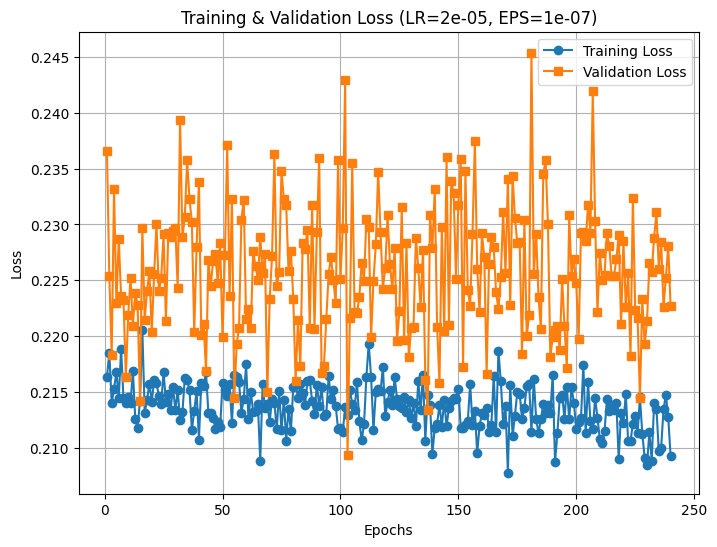

Validation Accuracy for (LR=2e-05, EPS=1e-07, Epochs=240): 0.2093

Best Overall Hyperparameters: Learning Rate = 2e-05, Epsilon = 1e-07, Epochs = 240
Best Validation Loss: 0.2093


In [ ]:
learning_rates = [1e-5, 2e-5]
epsilons = [1e-8, 1e-7]
num_epochs_list = [60, 120, 240]

best_overall_acc = float('inf')
best_hyperparams = None

for lr in learning_rates:
    for eps in epsilons:
        for epochs in num_epochs_list:
            print(f"\nTesting Hyperparameters: Learning Rate = {lr}, Epsilon = {eps}, Epochs = {epochs}")
            val_loss, params = train_and_validate(lr, eps, epochs)
            print(f"Validation Accuracy for (LR={lr}, EPS={eps}, Epochs={epochs}): {val_loss:.4f}")

            if val_loss < best_overall_acc:
                best_overall_acc = val_loss
                best_hyperparams = params

print(f"\nBest Overall Hyperparameters: Learning Rate = {best_hyperparams[0]}, Epsilon = {best_hyperparams[1]}, Epochs = {best_hyperparams[2]}")
print(f"Best Validation Loss: {best_overall_acc:.4f}")

In [ ]:
vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-ema").to(device)

In [ ]:
latent_noise = 0.95 * torch.randn(8, 4, latent_size, latent_size, device=device)
with torch.no_grad():
    with torch.cuda.amp.autocast():
        fake_latents = cold_diffuse(dit, latent_noise, total_steps=timesteps)
        fake_sample = vae.decode(fake_latents / 0.18215).sample

<ipython-input-35-5ecf1237472b>:3: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


  0%|          | 0/499 [00:00<?, ?it/s]

### Results Diffusion Model - Image Generation

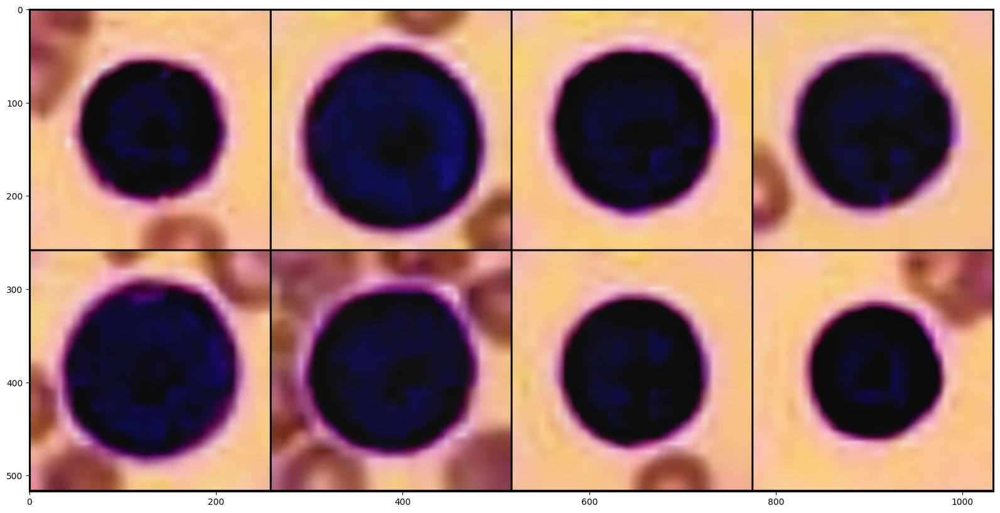

In [ ]:
plt.figure(figsize = (20, 10))
out = vutils.make_grid(fake_sample_DM.detach().float().cpu(), nrow=4, normalize=True)
_ = plt.imshow(out.numpy().transpose((1, 2, 0)))

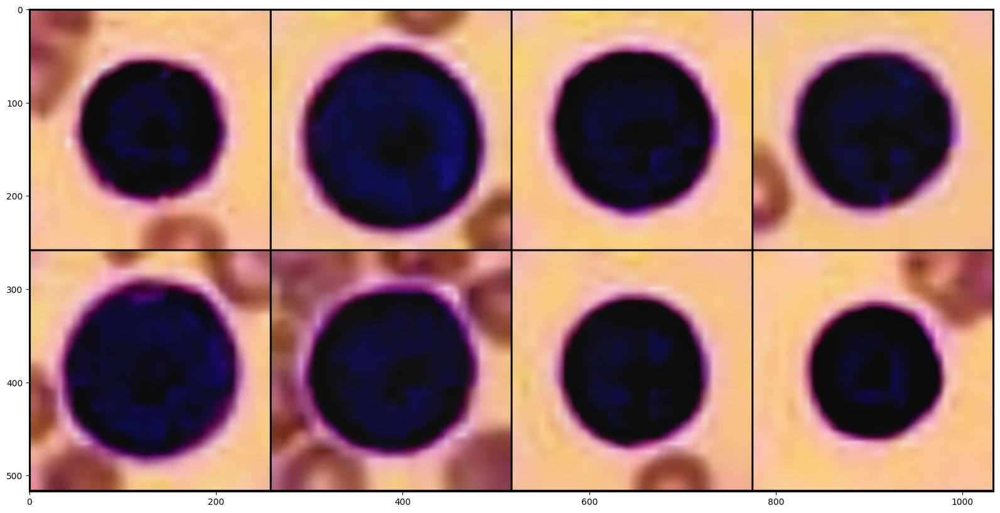

In [ ]:
output_dir = 'image_generated_DM'
os.makedirs(output_dir, exist_ok=True)

plt.figure(figsize=(20, 10))

# Create the grid of images
out = vutils.make_grid(fake_sample_DM.detach().float().cpu(), nrow=4, normalize=True)

plt.imshow(out.numpy().transpose((1, 2, 0)))

for i in range(fake_sample.size(0)):
    # Save each individual image as a PNG file
    img = fake_sample[i].detach().cpu()
    img = img.permute(1, 2, 0)  # Convert to HWC format for saving with matplotlib
    img = (img * 255).clamp(0, 255).numpy().astype('uint8')  # Convert to uint8 for image saving
    image_path = os.path.join(output_dir, f"generated_image_{i+1}.png")
    plt.imsave(image_path, img)


In [ ]:
# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load InceptionV3 pre-trained model
inception_model = models.inception_v3(pretrained=True, transform_input=False)
inception_model.eval().to(device)

# Define InceptionV3 feature extractor
def get_inception_features(images, model=inception_model):
    transform = transforms.Compose([
        transforms.Resize(299),  # Resize to 299x299 for InceptionV3
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    features = []
    for img_path in images:
        img = Image.open(img_path).convert("RGB")
        img = transform(img).unsqueeze(0).to(device)  # Add batch dimension
        with torch.no_grad():
            feature = model(img)
        features.append(feature.cpu().numpy().squeeze(0))

    return np.array(features)

# Function to calculate FID
def calculate_fid(real_images, generated_images):
    real_features = get_inception_features(real_images)
    generated_features = get_inception_features(generated_images)

    # Calculate the mean and covariance of the features
    real_mean, real_cov = np.mean(real_features, axis=0), np.cov(real_features, rowvar=False)
    gen_mean, gen_cov = np.mean(generated_features, axis=0), np.cov(generated_features, rowvar=False)

    # Calculate the FID score
    mean_diff = real_mean - gen_mean
    cov_sqrt, _ = sqrtm(real_cov.dot(gen_cov), disp=False)

    fid_score = np.sum(mean_diff**2) + np.trace(real_cov + gen_cov - 2*cov_sqrt)
    return fid_score

# Function to calculate SSIM between two images
def calculate_ssim(image1_path, image2_path):
    img1 = Image.open(image1_path).convert("RGB")
    img2 = Image.open(image2_path).convert("RGB")

    # Convert images to grayscale (SSIM works better in grayscale)
    img1 = np.array(img1.convert("L"))
    img2 = np.array(img2.convert("L"))

    # Calculate SSIM between the two images
    ssim_score, _ = ssim(img1, img2, full=True)
    return ssim_score

# Function to evaluate the FID and SSIM for a set of real and generated images
def evaluate_model_fid_ssim(real_images_dir, generated_images_dir):
    # Get real and generated image paths
    real_images = [os.path.join(real_images_dir, fname) for fname in os.listdir(real_images_dir) if fname.endswith('.png')]
    generated_images = [os.path.join(generated_images_dir, fname) for fname in os.listdir(generated_images_dir) if fname.endswith('.png')]

    # Calculate FID score
    fid_score = calculate_fid(real_images, generated_images)
    print(f"FID Score: {fid_score:.4f}")

    # Calculate SSIM score for each pair of real and generated images
    ssim_scores = []
    for real_img, gen_img in zip(real_images, generated_images):
        ssim_score = calculate_ssim(real_img, gen_img)
        ssim_scores.append(ssim_score)

    mean_ssim = np.mean(ssim_scores)
    print(f"Mean SSIM Score: {mean_ssim:.4f}")
    return fid_score, mean_ssim


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:00<00:00, 200MB/s] 


In [ ]:
real_images_dir = 'bloodmnist-final/test'  # Real images
generated_images_dir = 'image_generated_DM'  # Generated images

# Call the function to evaluate the model
fid, mean_ssim = evaluate_model_fid_ssim(real_images_dir, generated_images_dir)

FID Score: 2332.2659-0.0000j
Mean SSIM Score: 0.2629


###Results DiT - Image generation

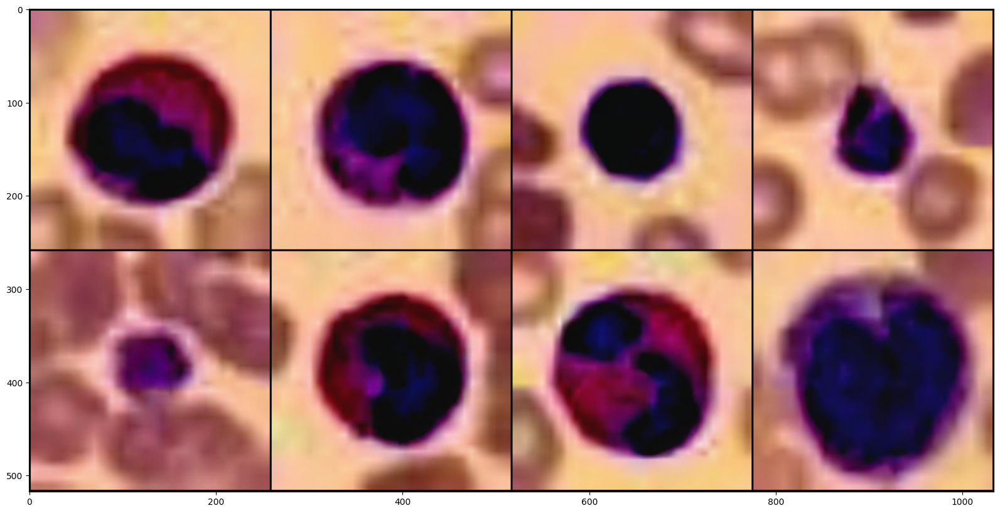

In [ ]:
plt.figure(figsize = (20, 10))
out = vutils.make_grid(fake_sample.detach().float().cpu(), nrow=4, normalize=True)
_ = plt.imshow(out.numpy().transpose((1, 2, 0)))

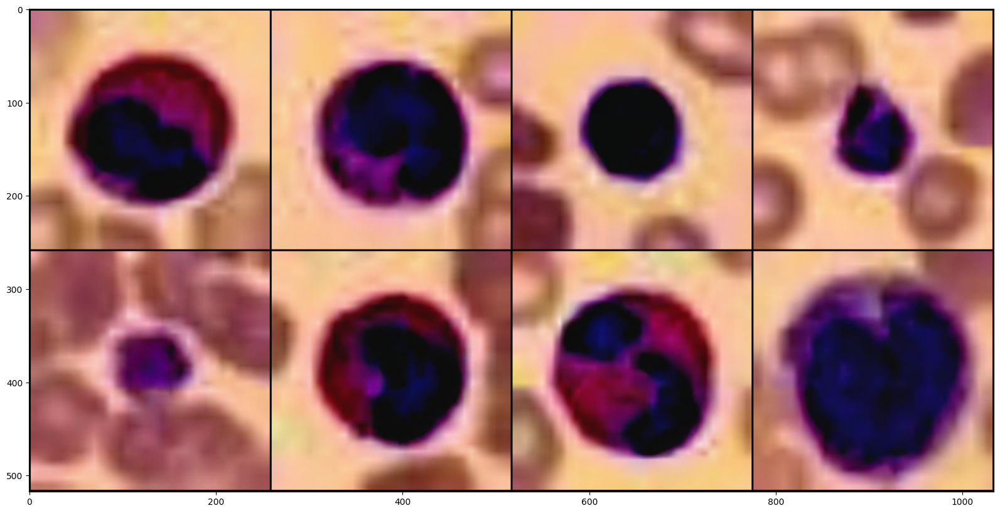

In [ ]:
output_dir = 'image_generated-DiT'
os.makedirs(output_dir, exist_ok=True)

plt.figure(figsize=(20, 10))

# Create the grid of images
out = vutils.make_grid(fake_sample.detach().float().cpu(), nrow=4, normalize=True)

plt.imshow(out.numpy().transpose((1, 2, 0)))

for i in range(fake_sample.size(0)):
    # Save each individual image as a PNG file
    img = fake_sample[i].detach().cpu()
    img = img.permute(1, 2, 0)  # Convert to HWC format for saving with matplotlib
    img = (img * 255).clamp(0, 255).numpy().astype('uint8')  # Convert to uint8 for image saving
    image_path = os.path.join(output_dir, f"generated_image_{i+1}.png")
    plt.imsave(image_path, img)


In [ ]:
# Set directories
real_images_dir = 'bloodmnist-final/test'  # Real images from the 'test' folder in 'bloodmnist'
generated_images_dir = 'image_generated'  # Generated images

# Call the function to evaluate the model
fid, mean_ssim = evaluate_model_fid_ssim(real_images_dir, generated_images_dir)


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:01<00:00, 67.3MB/s] 


FID Score: 2301.7661-0.0000j
Mean SSIM Score: 0.4039
